# **File ipynb for classification**

**11/08/2023** -  Progetto Hand Robot Team EEG - Andrea Scarpellini, Sara Paratico
(if you are modifying this file please write here your name)

This file contains a supervised classification analysis on data collected in 2022. We utilized labeled data collected by Davide and applied various algorithms for the supervised classification.


### **JSON FILES:**
We have 22 file called in the following way.
 - POW000.json

  ...

 - POW021.json

####**Description**
- "000": An identifier for a reading session.
- "UserID": User identifier, in this case, "M28".
- "Readings": Contains the reading data collected during the session.
- "000000": A key for a specific reading during the session.
- "Phase": The phase of the recording
  - Baseline 000
  - Baseline Occhi Chiusi
  - Sudoku
  - SPIEGARE LE ALTRE
-"Time": The timestamp of the reading, for example, "12:43:49".
-"AF3", "T7", "Pz", "T8", "AF4": Electrode positions on the scalp.
-"Theta", "Alpha", "BetaL", "BetaH", "Gamma": Power for brain waves in their respective frequency bands.


### **What we use**
We use only the data relative to the channels and the label relative to the phase. With those data we should be able to create a model that can desciminate the phases thanks to the values of pow.


- What are the phases that we are interested  in? --> why?
- How much file we should use for training ?
- for testing?
- for validation?



### **Sub-Objective:**
Can we distinguish between different phases?

Questions:

- Which electrodes carry the most significant weight in the data?

- Why are these electrodes crucial?
- What frequency bands exhibit the greatest influence in the dataset?

- Why are these frequency bands noteworthy?
- Which task is most effective in eliciting concentration from the subject?

- Why is this particular task considered optimal?
- Considering a potential user experience, which analyzed task is the most    suitable choice for triggering the robotic arm?
Explanation: What specific action does the subject need to perform to activate the robotic arm, based on our analysis?






---
# ***SETTINGS***
---

In [1]:
# SARA: montiamo a drive per collegarci alla cartella desiderata
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [23]:
# IMPORT LIBRARIES
import json
import os
import pandas as pd
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
import math
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.layers import Flatten, GlobalAveragePooling2D, Multiply, Reshape, Dense
from tensorflow.keras.layers import UpSampling2D, Conv2D
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model

tfk = tf.keras
tfkl = tf.keras.layers

import random
import numpy as np
seed = 4

random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)
np.random.seed(seed)
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)

**WARNING**

(Andrea) --> If you want to use this file you have to change the directory! ( this is another reason we should use github)

Da un file Json otteniamo un dataset pandas. \

Ho pensato che fosse piu' comodo utilizzare un dataset pandas piuttosto che direttamente un file json.

---
# ***DATAFRAME CREATION***
---

In [3]:
# I CREATE INDIVIDUAL DATAFRAMES IN ORDER TO TAKE MEMORY OF THEIR LENGHT

# Initialize an empty list to store the rows
lenghts = []
# Define columns as before
columns = ['UserID', 'Phase', 'Time', 'AF3_Theta', 'AF3_Alpha', 'AF3_BetaL', 'AF3_BetaH', 'AF3_Gamma',
           'T7_Theta', 'T7_Alpha', 'T7_BetaL', 'T7_BetaH', 'T7_Gamma',
           'Pz_Theta', 'Pz_Alpha', 'Pz_BetaL', 'Pz_BetaH', 'Pz_Gamma',
           'T8_Theta', 'T8_Alpha', 'T8_BetaL', 'T8_BetaH', 'T8_Gamma',
           'AF4_Theta', 'AF4_Alpha', 'AF4_BetaL', 'AF4_BetaH', 'AF4_Gamma']

# Iterate through all the JSON files in the specified range
old = 0
lenght =  []
for i in range(0, 22):
    rows = []
    # Generate the file name (assuming the format is POWxxx.json)
    json_file_name = f'POW{i:03d}.json'
    json_file_path = os.path.join('/content/gdrive/MyDrive/SAPIENS/DB_Macchinine', json_file_name)

    # Check if the file exists before attempting to read it
    if os.path.exists(json_file_path):
       with open(json_file_path, 'r') as json_file:
            data = json.load(json_file)

        # Iterate through the JSON data
       for key, value in data.items():
            user_id = value['UserID']
            readings = value['Readings']
            for reading_key, reading_value in readings.items():
                phase = reading_value['Phase']
                if phase in ["sudoku", "Sudoku", "Baseline occhi chiusi", "occhi chiusi", "baseline occhi chiusi"]:
                    time = reading_value['Time']
                    af3_theta = reading_value['AF3']['Theta']
                    af3_alpha = reading_value['AF3']['Alpha']
                    af3_betaL = reading_value['AF3']['BetaL']
                    af3_betaH = reading_value['AF3']['BetaH']
                    af3_gamma = reading_value['AF3']['Gamma']

                    t7_theta = reading_value['T7']['Theta']
                    t7_alpha = reading_value['T7']['Alpha']
                    t7_betaL = reading_value['T7']['BetaL']
                    t7_betaH = reading_value['T7']['BetaH']
                    t7_gamma = reading_value['T7']['Gamma']

                    pz_theta = reading_value['Pz']['Theta']
                    pz_alpha = reading_value['Pz']['Alpha']
                    pz_betaL = reading_value['Pz']['BetaL']
                    pz_betaH = reading_value['Pz']['BetaH']
                    pz_gamma = reading_value['Pz']['Gamma']

                    t8_theta = reading_value['T8']['Theta']
                    t8_alpha = reading_value['T8']['Alpha']
                    t8_betaL = reading_value['T8']['BetaL']
                    t8_betaH = reading_value['T8']['BetaH']
                    t8_gamma = reading_value['T8']['Gamma']

                    af4_theta = reading_value['AF4']['Theta']
                    af4_alpha = reading_value['AF4']['Alpha']
                    af4_betaL = reading_value['AF4']['BetaL']
                    af4_betaH = reading_value['AF4']['BetaH']
                    af4_gamma = reading_value['AF4']['Gamma']


                    row = [user_id, phase, time, af3_theta, af3_alpha, af3_betaL, af3_betaH, af3_gamma, t7_theta, t7_alpha, t7_betaL, t7_betaH, t7_gamma,
                           pz_theta, pz_alpha, pz_betaL, pz_betaH, pz_gamma, t8_theta, t8_alpha, t8_betaL, t8_betaH, t8_gamma,
                           af4_theta, af4_alpha, af4_betaL, af4_betaH, af4_gamma]

                    rows.append(row)

    # I need lenghts in order to know when I pass from a file to another
    one_df = pd.DataFrame(rows, columns=columns)
    lenghts.append(len(one_df))

In [4]:
# TOTAL FINAL DATAFRAME

# Initialize an empty list to store the rows
rows = []

# Iterate through all the JSON files in the specified range
for i in range(0, 22):
    # Generate the file name (assuming the format is POWxxx.json)
    json_file_name = f'POW{i:03d}.json'
    json_file_path = os.path.join('/content/gdrive/MyDrive/SAPIENS/DB_Macchinine', json_file_name)

    # Check if the file exists before attempting to read it
    if os.path.exists(json_file_path):
        with open(json_file_path, 'r') as json_file:
            data = json.load(json_file)

        # Iterate through the JSON data
        for key, value in data.items():
            user_id = value['UserID']
            readings = value['Readings']
            for reading_key, reading_value in readings.items():
                phase = reading_value['Phase']
                if phase in  ["sudoku", "Sudoku", "Baseline occhi chiusi", "occhi chiusi", "baseline occhi chiusi"]:
                    time = reading_value['Time']
                    af3_theta = reading_value['AF3']['Theta']
                    af3_alpha = reading_value['AF3']['Alpha']
                    af3_betaL = reading_value['AF3']['BetaL']
                    af3_betaH = reading_value['AF3']['BetaH']
                    af3_gamma = reading_value['AF3']['Gamma']

                    t7_theta = reading_value['T7']['Theta']
                    t7_alpha = reading_value['T7']['Alpha']
                    t7_betaL = reading_value['T7']['BetaL']
                    t7_betaH = reading_value['T7']['BetaH']
                    t7_gamma = reading_value['T7']['Gamma']

                    pz_theta = reading_value['Pz']['Theta']
                    pz_alpha = reading_value['Pz']['Alpha']
                    pz_betaL = reading_value['Pz']['BetaL']
                    pz_betaH = reading_value['Pz']['BetaH']
                    pz_gamma = reading_value['Pz']['Gamma']

                    t8_theta = reading_value['T8']['Theta']
                    t8_alpha = reading_value['T8']['Alpha']
                    t8_betaL = reading_value['T8']['BetaL']
                    t8_betaH = reading_value['T8']['BetaH']
                    t8_gamma = reading_value['T8']['Gamma']

                    af4_theta = reading_value['AF4']['Theta']
                    af4_alpha = reading_value['AF4']['Alpha']
                    af4_betaL = reading_value['AF4']['BetaL']
                    af4_betaH = reading_value['AF4']['BetaH']
                    af4_gamma = reading_value['AF4']['Gamma']


                    row = [user_id, phase, time, af3_theta, af3_alpha, af3_betaL, af3_betaH, af3_gamma, t7_theta, t7_alpha, t7_betaL, t7_betaH, t7_gamma,
                           pz_theta, pz_alpha, pz_betaL, pz_betaH, pz_gamma, t8_theta, t8_alpha, t8_betaL, t8_betaH, t8_gamma,
                           af4_theta, af4_alpha, af4_betaL, af4_betaH, af4_gamma]

                    rows.append(row)

# Define columns as before
columns = ['UserID', 'Phase', 'Time', 'AF3_Theta', 'AF3_Alpha', 'AF3_BetaL', 'AF3_BetaH', 'AF3_Gamma',
           'T7_Theta', 'T7_Alpha', 'T7_BetaL', 'T7_BetaH', 'T7_Gamma',
           'Pz_Theta', 'Pz_Alpha', 'Pz_BetaL', 'Pz_BetaH', 'Pz_Gamma',
           'T8_Theta', 'T8_Alpha', 'T8_BetaL', 'T8_BetaH', 'T8_Gamma',
           'AF4_Theta', 'AF4_Alpha', 'AF4_BetaL', 'AF4_BetaH', 'AF4_Gamma']

# Create a DataFrame from the rows and columns
df = pd.DataFrame(rows, columns=columns)

# Filter the DataFrame to only include rows with 'Phase' as "sudoku" or "baseline occhi chiusi"
filtered_df = df[df['Phase'].isin(["sudoku", "Sudoku", "Baseline occhi chiusi", "occhi chiusi", "baseline occhi chiusi"])]

In [5]:
# HOW IS COMPOSED filtered_data?
filtered_df

,UserID,Phase,Time,AF3_Theta,AF3_Alpha,AF3_BetaL,AF3_BetaH,AF3_Gamma,T7_Theta,T7_Alpha,...,T8_Theta,T8_Alpha,T8_BetaL,T8_BetaH,T8_Gamma,AF4_Theta,AF4_Alpha,AF4_BetaL,AF4_BetaH,AF4_Gamma
0,M28,baseline occhi chiusi,12:47:56,2.514,4.049,6.891,3.734,2.143,3.878,3.109,...,3.368,9.275,10.638,3.768,3.033,3.03,5.133,6.916,4.916,2.152
1,M28,baseline occhi chiusi,12:47:56,2.184,3.739,5.57,3.868,2.017,3.327,3.66,...,3.754,10.035,10.933,3.293,2.756,2.583,4.833,5.746,5.199,2.108
2,M28,baseline occhi chiusi,12:47:56,2.03,3.471,4.345,3.931,1.849,2.814,4.142,...,4.156,10.042,10.698,2.928,2.48,2.429,4.343,4.658,5.4,2.024
3,M28,baseline occhi chiusi,12:47:57,2.059,3.598,3.408,3.924,1.706,2.552,4.518,...,4.449,9.434,9.763,2.688,2.236,2.457,4.088,3.804,5.43,1.931
4,M28,baseline occhi chiusi,12:47:57,2.361,4.377,2.791,3.916,1.643,2.659,4.794,...,4.548,8.518,8.255,2.589,2.066,2.977,4.451,3.207,5.29,1.858
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63337,M30,sudoku,19:41:58,0.805,1.104,0.606,0.446,0.169,0.346,0.678,...,0.841,0.575,0.741,0.563,0.271,1.558,0.987,0.486,0.331,0.212
63338,M30,sudoku,19:41:58,0.897,1.082,0.59,0.452,0.18,0.352,0.745,...,0.802,0.387,0.694,0.553,0.261,1.8,1.037,0.494,0.356,0.221
63339,M30,sudoku,19:41:58,1.092,1.033,0.564,0.442,0.188,0.37,0.79,...,0.795,0.252,0.642,0.516,0.25,2.072,1.038,0.515,0.372,0.226
63340,M30,sudoku,19:41:58,1.323,0.905,0.534,0.421,0.189,0.393,0.788,...,0.836,0.179,0.587,0.464,0.244,2.384,0.97,0.537,0.378,0.225


In [6]:
# This is the list of lenghts of individual files recordings containing desired phases.
# The files are ordered from POW000 to POW021.

print("Different lenghts of singular POWfile recordings: ", lenghts)
prev = 0
indices = [0]
for z in lenghts:
  if z != 0:
    index = z + prev
    indices.append(index)
    prev = index
print("Indices that sign the end of a POWfile and the beginning of the next one: ", indices)

Different lenghts of singular POWfile recordings:  [4444, 1677, 3374, 3162, 2235, 2696, 2979, 1907, 2955, 3047, 3064, 1569, 2816, 3004, 2895, 2997, 3306, 3159, 2873, 2930, 3057, 3196]
Indices that sign the end of a POWfile and the beginning of the next one:  [0, 4444, 6121, 9495, 12657, 14892, 17588, 20567, 22474, 25429, 28476, 31540, 33109, 35925, 38929, 41824, 44821, 48127, 51286, 54159, 57089, 60146, 63342]


In [7]:
# I do not need UserID and Time
columns_to_remove = ['UserID', 'Time']
filtered_df.drop(columns=columns_to_remove, inplace=True)
print(filtered_df.shape)
filtered_df.head()

(63342, 26)


,Phase,AF3_Theta,AF3_Alpha,AF3_BetaL,AF3_BetaH,AF3_Gamma,T7_Theta,T7_Alpha,T7_BetaL,T7_BetaH,...,T8_Theta,T8_Alpha,T8_BetaL,T8_BetaH,T8_Gamma,AF4_Theta,AF4_Alpha,AF4_BetaL,AF4_BetaH,AF4_Gamma
0,baseline occhi chiusi,2.514,4.049,6.891,3.734,2.143,3.878,3.109,4.454,3.1,...,3.368,9.275,10.638,3.768,3.033,3.03,5.133,6.916,4.916,2.152
1,baseline occhi chiusi,2.184,3.739,5.57,3.868,2.017,3.327,3.66,4.823,3.116,...,3.754,10.035,10.933,3.293,2.756,2.583,4.833,5.746,5.199,2.108
2,baseline occhi chiusi,2.03,3.471,4.345,3.931,1.849,2.814,4.142,5.099,3.022,...,4.156,10.042,10.698,2.928,2.48,2.429,4.343,4.658,5.4,2.024
3,baseline occhi chiusi,2.059,3.598,3.408,3.924,1.706,2.552,4.518,5.164,2.871,...,4.449,9.434,9.763,2.688,2.236,2.457,4.088,3.804,5.43,1.931
4,baseline occhi chiusi,2.361,4.377,2.791,3.916,1.643,2.659,4.794,4.94,2.771,...,4.548,8.518,8.255,2.589,2.066,2.977,4.451,3.207,5.29,1.858


### **Dataset Exploration**

- Balance
- Missing values
- Variable types
- Variable distributions
- Potential variable transformations
- Variable distributions separated by phase
- Possible correlation between channels

---
# ***COUNTPLOT***
---

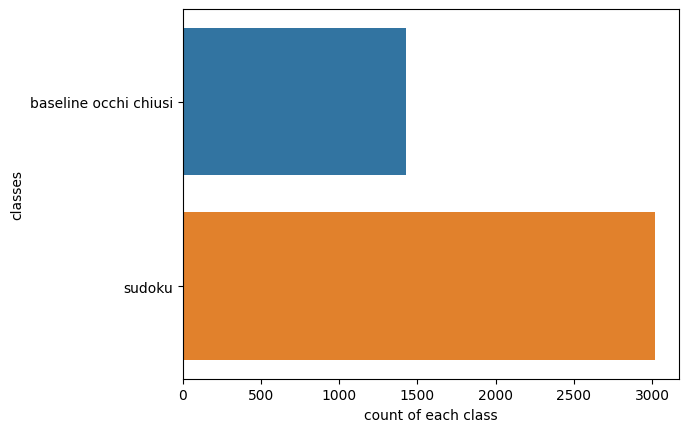

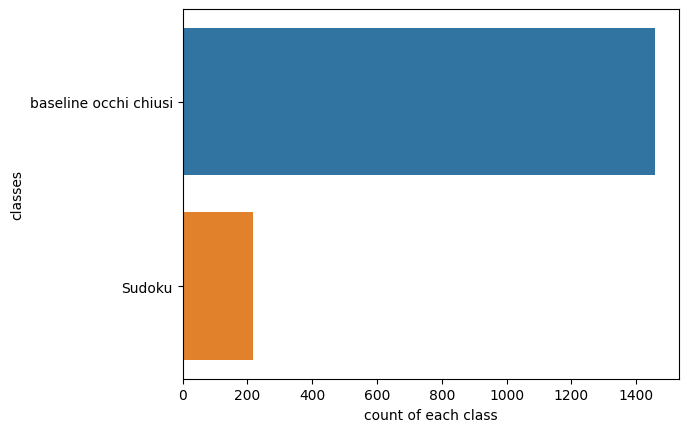

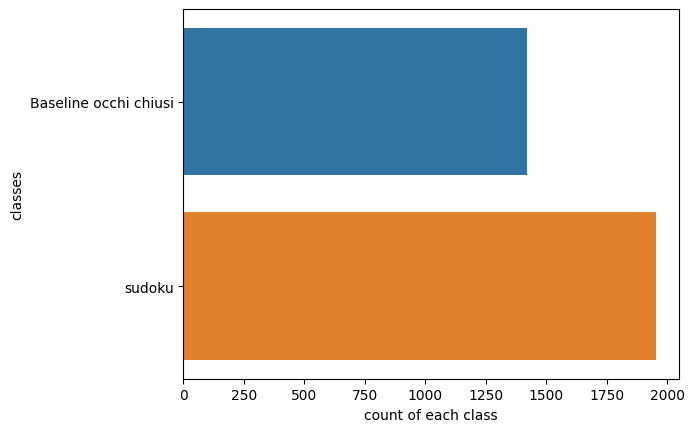

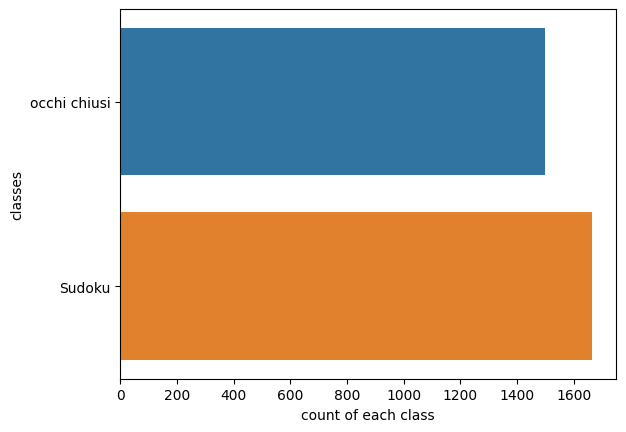

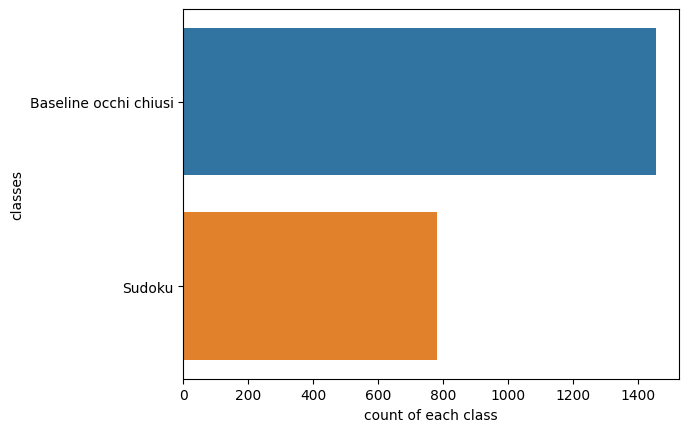

...

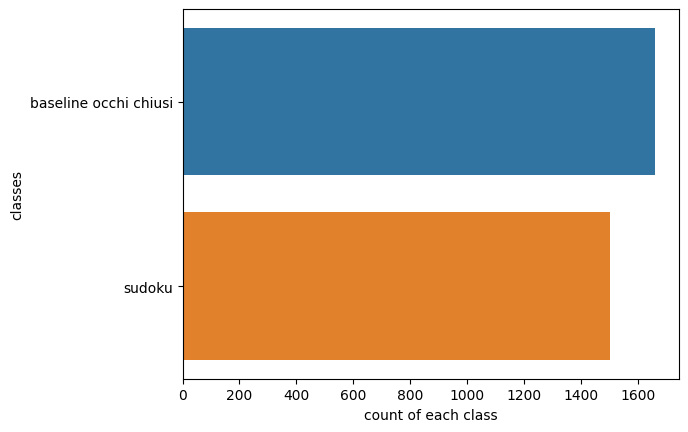

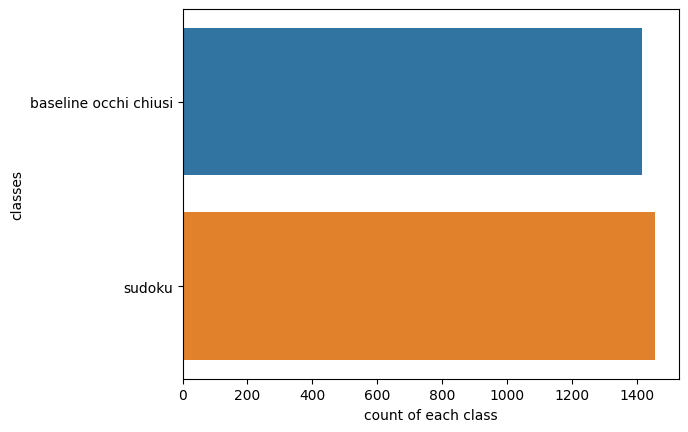

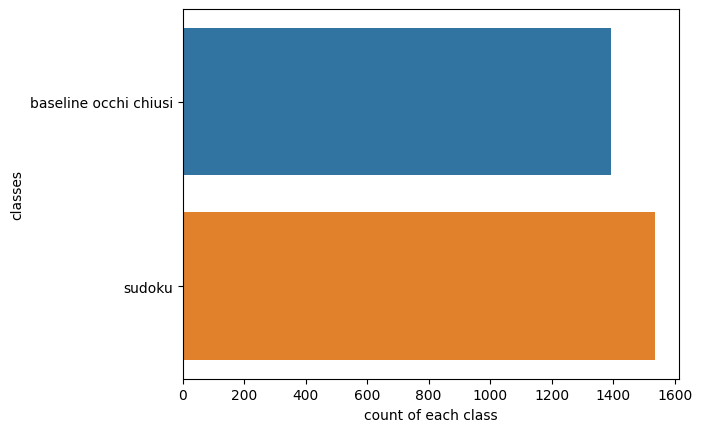

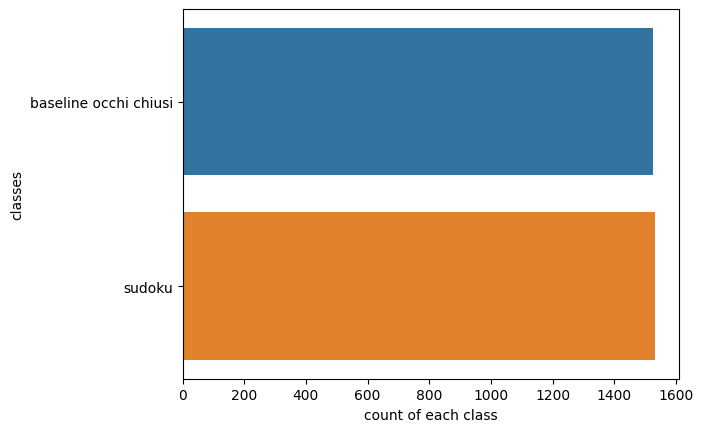

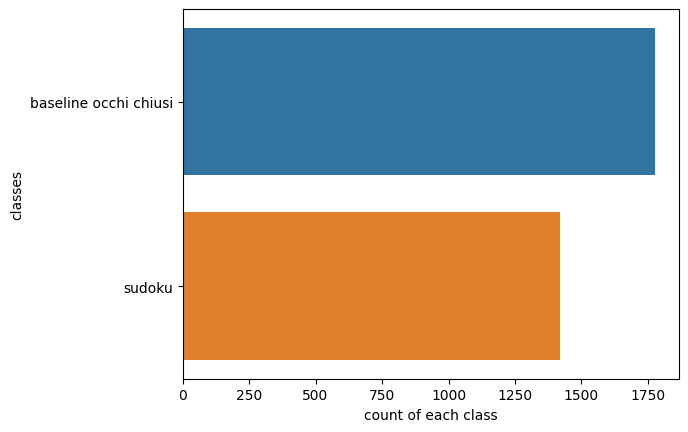

In [8]:
# I AM LOOKING FOR A SMARTER WAY FOR DOING THIS, BUT I ESSENTALLY CREATE SINGULAR DATAFRAMES,
# DIVIDING SINGULAR FILES DATA FROM TOTAL DATAFRAME

dataframes = []

w = 0
for i in range(22):
  dataframes.append(filtered_df[indices[w]:indices[w+1]])

  sns.countplot(y=dataframes[i].Phase, data = dataframes[i])
  plt.xlabel("count of each class")
  plt.ylabel("classes")
  plt.show()

  w=w+1

The dataset is  not balanced ! Considering boostrapping or elimination of data or something else (ask to a data analyst what  we should do)

**--> SARA**: possible options could be balance classes in classification net, there's a specific key for balances

---
# ***DATA DTYPE***
---

In [9]:
filtered_df.isna().any()

Phase        False
AF3_Theta    False
AF3_Alpha    False
AF3_BetaL    False
AF3_BetaH    False
AF3_Gamma    False
T7_Theta     False
T7_Alpha     False
T7_BetaL     False
T7_BetaH     False
T7_Gamma     False
Pz_Theta     False
Pz_Alpha     False
Pz_BetaL     False
Pz_BetaH     False
Pz_Gamma     False
T8_Theta     False
T8_Alpha     False
T8_BetaL     False
T8_BetaH     False
T8_Gamma     False
AF4_Theta    False
AF4_Alpha    False
AF4_BetaL    False
AF4_BetaH    False
AF4_Gamma    False
dtype: bool

In [10]:
print(filtered_df.dtypes)

Phase        object
AF3_Theta    object
AF3_Alpha    object
AF3_BetaL    object
AF3_BetaH    object
AF3_Gamma    object
T7_Theta     object
T7_Alpha     object
T7_BetaL     object
T7_BetaH     object
T7_Gamma     object
Pz_Theta     object
Pz_Alpha     object
Pz_BetaL     object
Pz_BetaH     object
Pz_Gamma     object
T8_Theta     object
T8_Alpha     object
T8_BetaL     object
T8_BetaH     object
T8_Gamma     object
AF4_Theta    object
AF4_Alpha    object
AF4_BetaL    object
AF4_BetaH    object
AF4_Gamma    object
dtype: object


We should chage from object to float the POW numbers.

In [11]:
columns_to_convert = [
    'AF3_Theta', 'AF3_Alpha', 'AF3_BetaL', 'AF3_BetaH', 'AF3_Gamma',
    'T7_Theta', 'T7_Alpha', 'T7_BetaL', 'T7_BetaH', 'T7_Gamma',
    'Pz_Theta', 'Pz_Alpha', 'Pz_BetaL', 'Pz_BetaH', 'Pz_Gamma',
    'T8_Theta', 'T8_Alpha', 'T8_BetaL', 'T8_BetaH', 'T8_Gamma',
    'AF4_Theta', 'AF4_Alpha', 'AF4_BetaL', 'AF4_BetaH', 'AF4_Gamma'
]

# Use the astype method to convert columns to float
filtered_df[columns_to_convert] = filtered_df[columns_to_convert].astype(float)

In [12]:
dataframes = []

w = 0
for i in range(22):
  dataframes.append(filtered_df[indices[w]:indices[w+1]])
  w=w+1

In [13]:
print(filtered_df.dtypes)

Phase         object
AF3_Theta    float64
AF3_Alpha    float64
AF3_BetaL    float64
AF3_BetaH    float64
AF3_Gamma    float64
T7_Theta     float64
T7_Alpha     float64
T7_BetaL     float64
T7_BetaH     float64
T7_Gamma     float64
Pz_Theta     float64
Pz_Alpha     float64
Pz_BetaL     float64
Pz_BetaH     float64
Pz_Gamma     float64
T8_Theta     float64
T8_Alpha     float64
T8_BetaL     float64
T8_BetaH     float64
T8_Gamma     float64
AF4_Theta    float64
AF4_Alpha    float64
AF4_BetaL    float64
AF4_BetaH    float64
AF4_Gamma    float64
dtype: object


---
# ***DATA DISTRIBUTION***
---

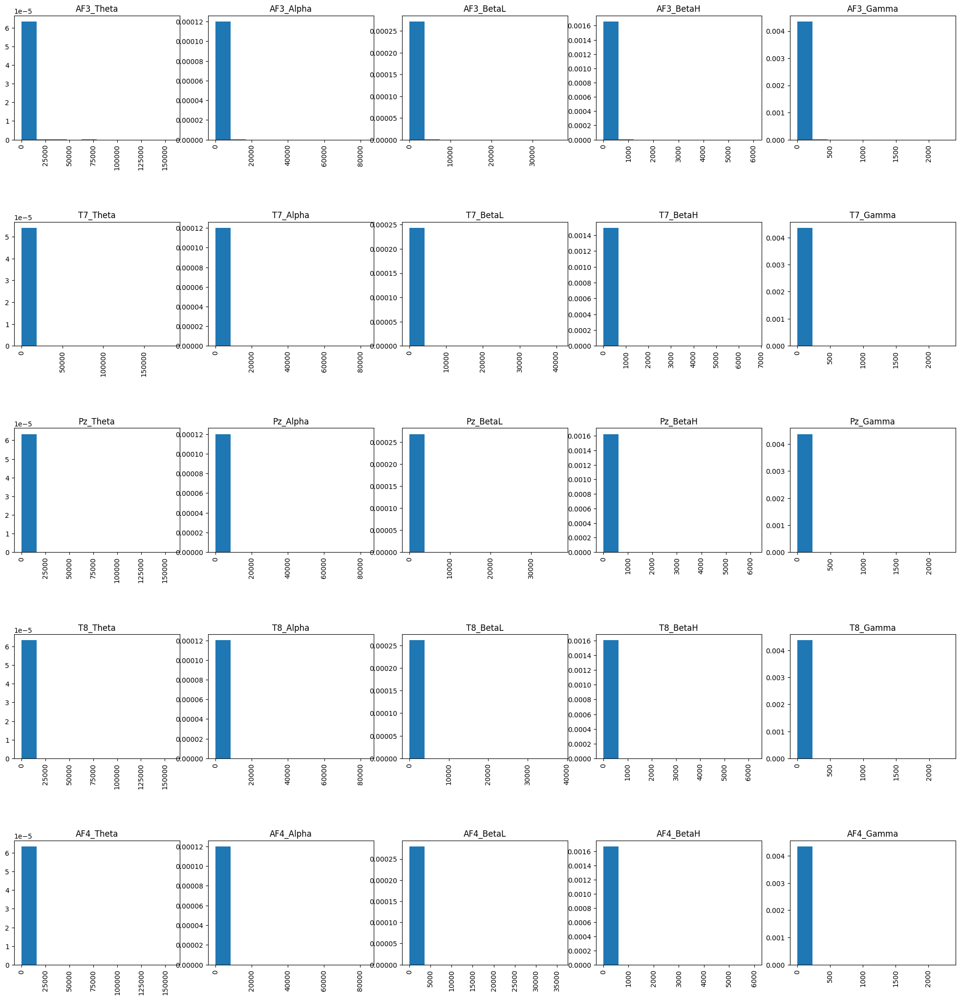

In [14]:
pow = filtered_df [columns_to_convert]

fig, axes = plt.subplots(5, 5,figsize=[20,20])
axes = axes.flatten()
fig.tight_layout(h_pad=10)

i=0
for x in pow.columns:
    plt.sca(axes[i]) # set the current Axes
    plt.hist(pow[x],density=True)
    plt.xticks(rotation = 90) # Rotates X-Axis Ticks by 45-degrees
    plt.title(x)
    i+=1
plt.show()

FILE  0


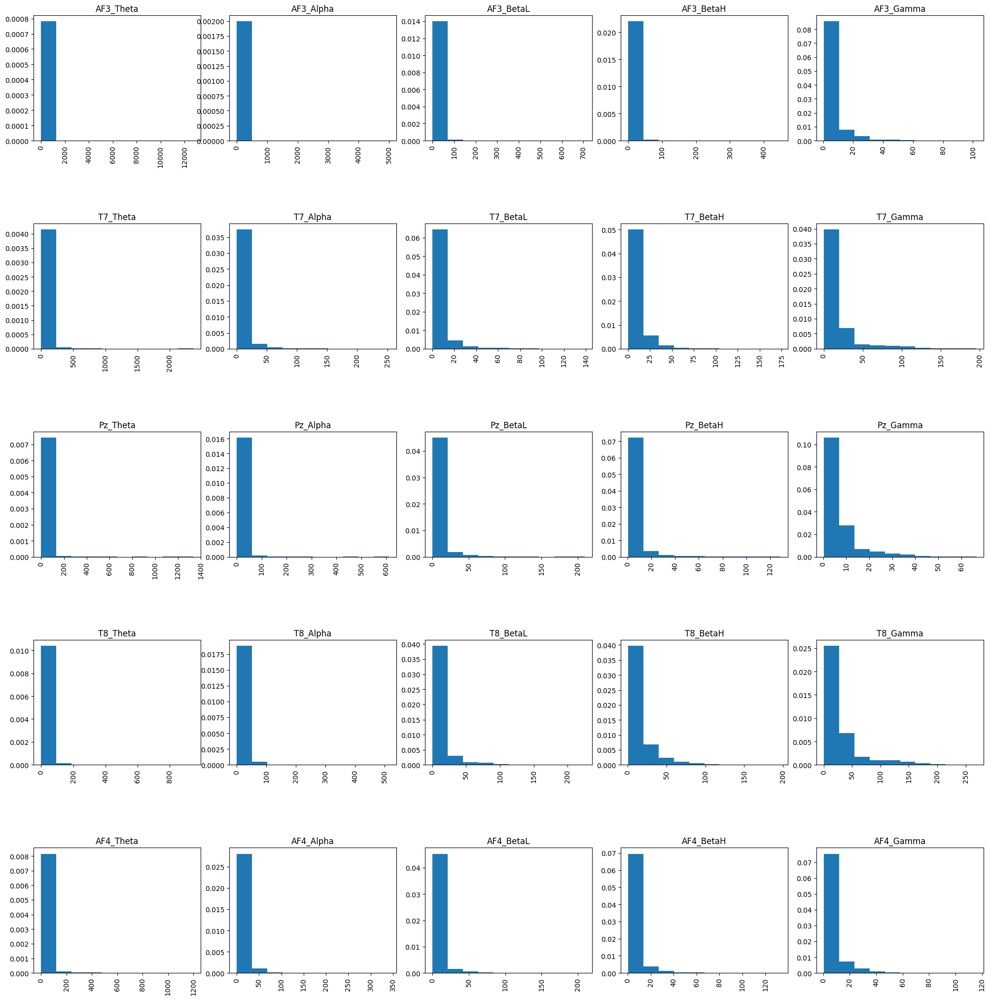

FILE  1


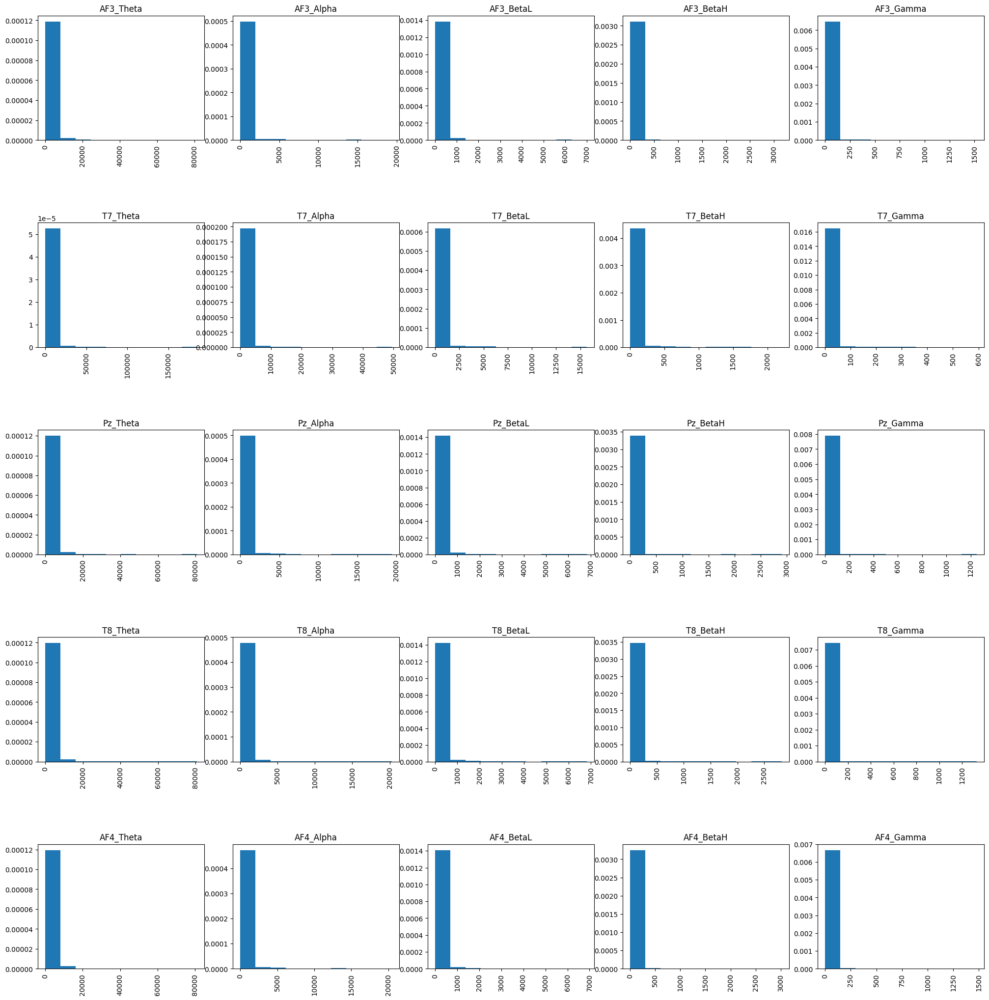

FILE  2


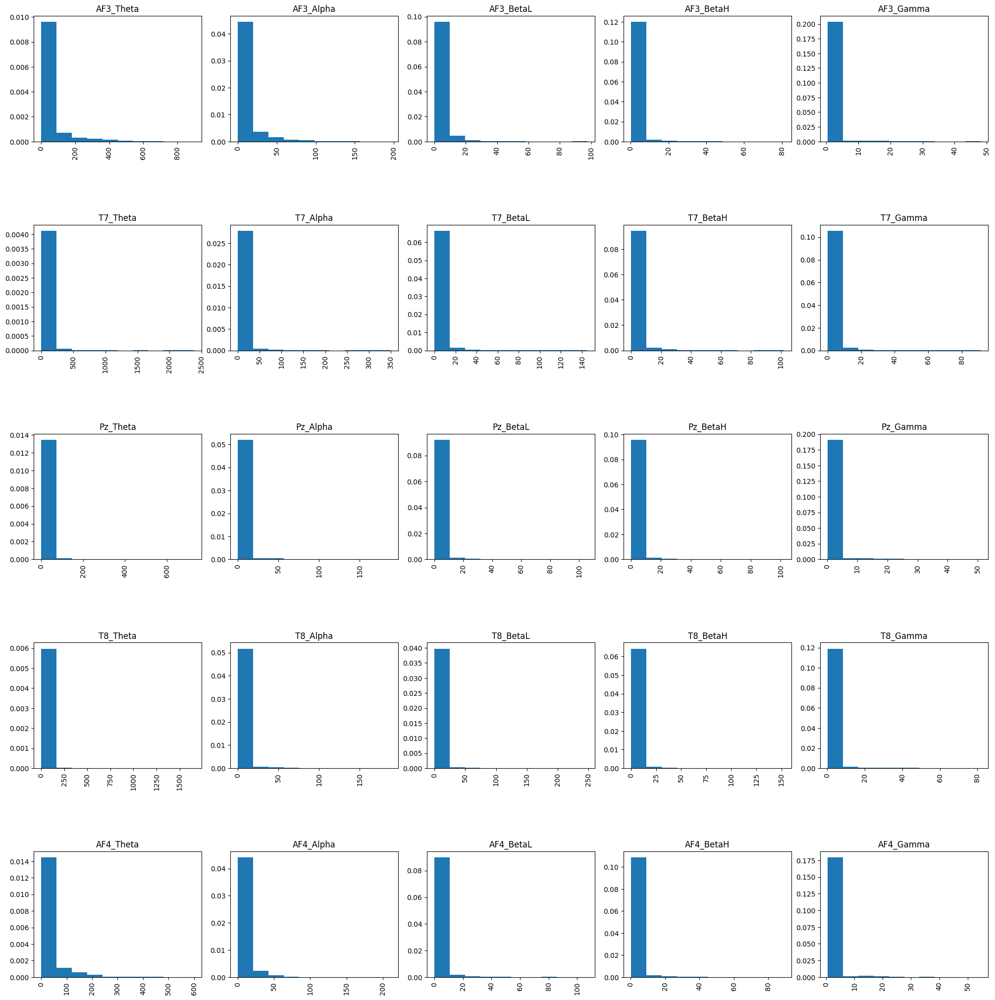

FILE  3


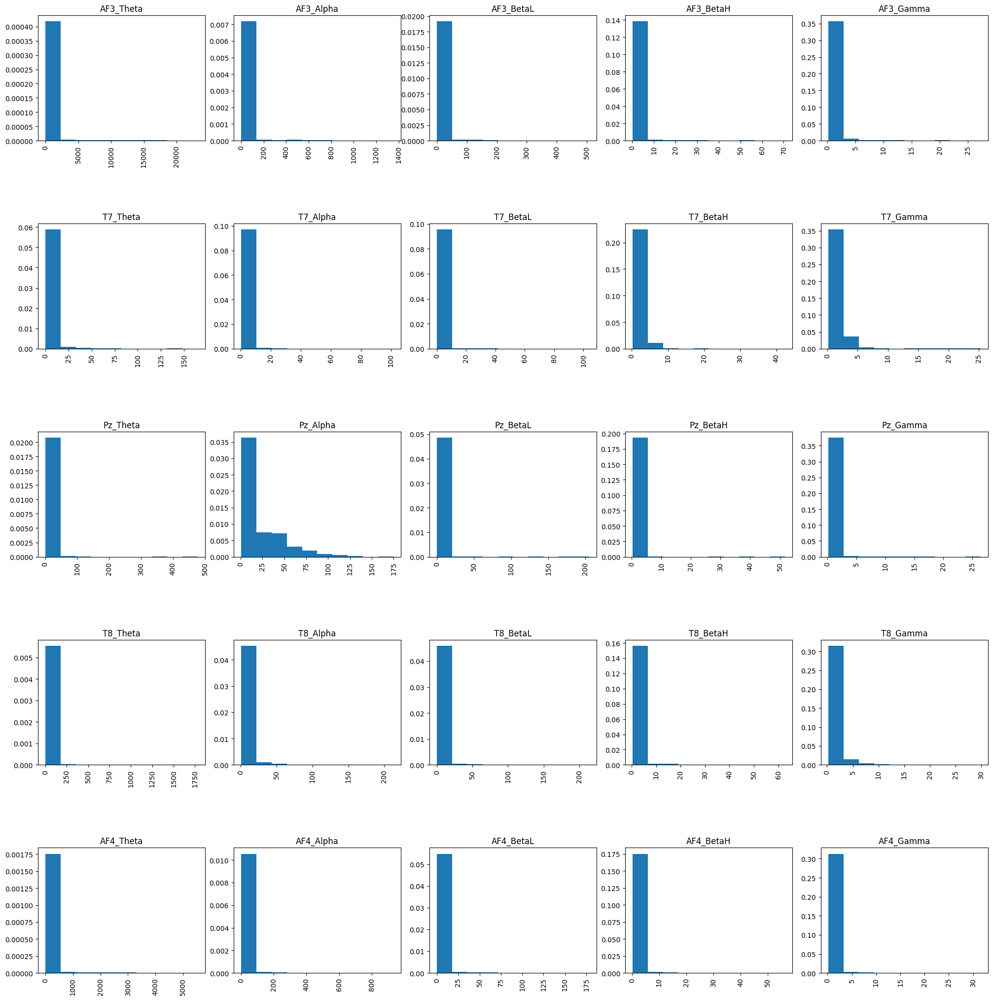

FILE  4


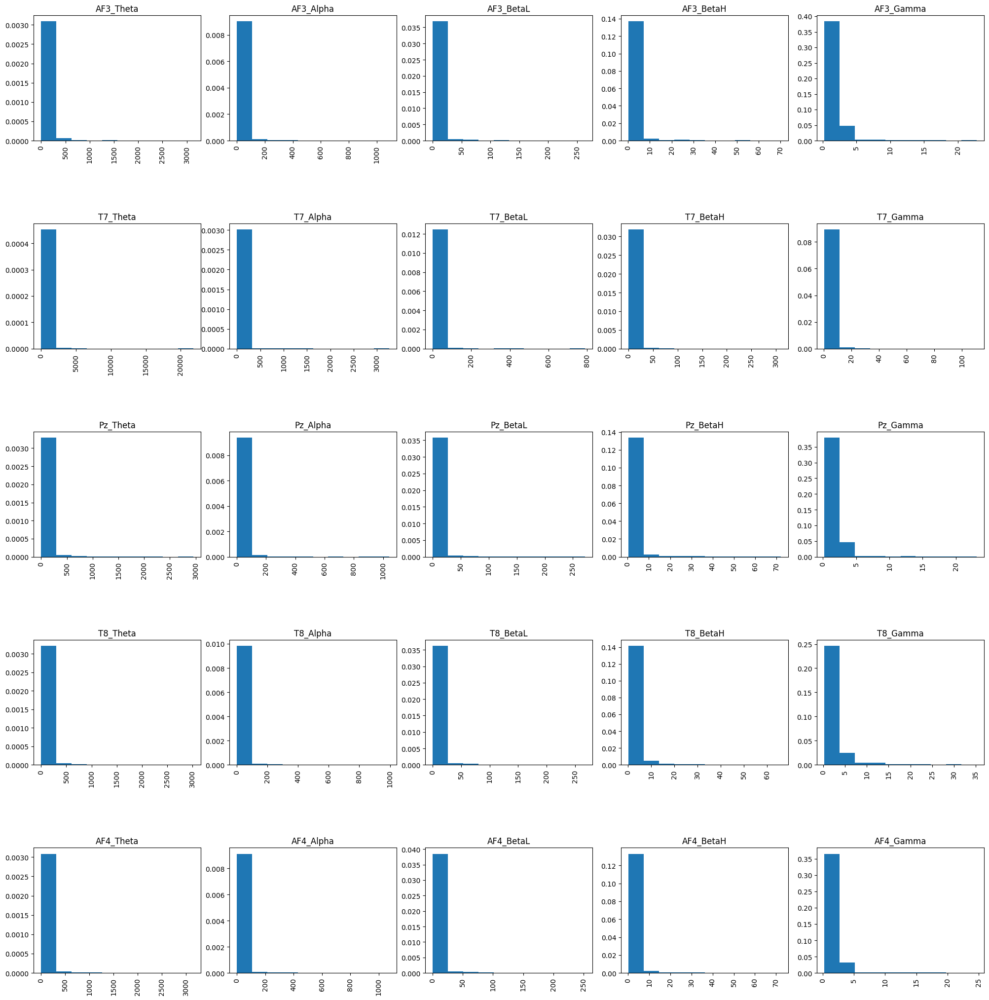

FILE  5


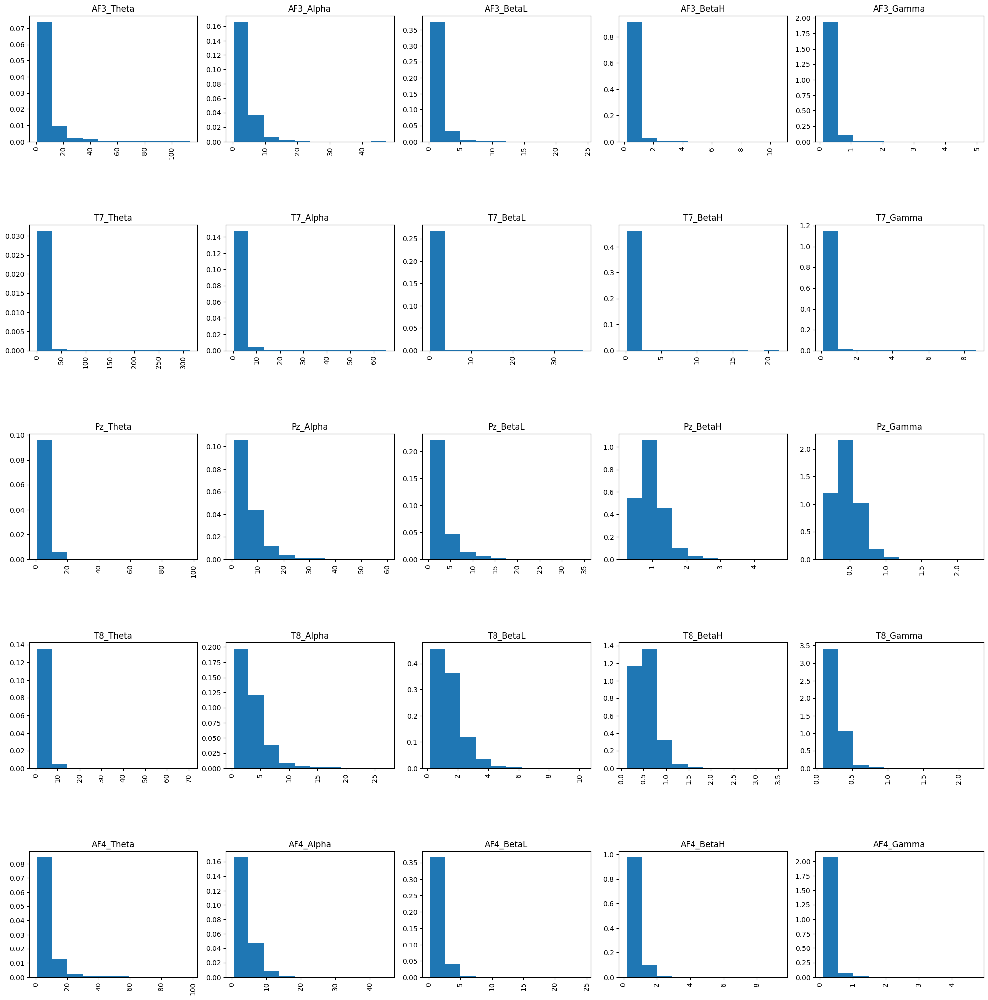

FILE  6


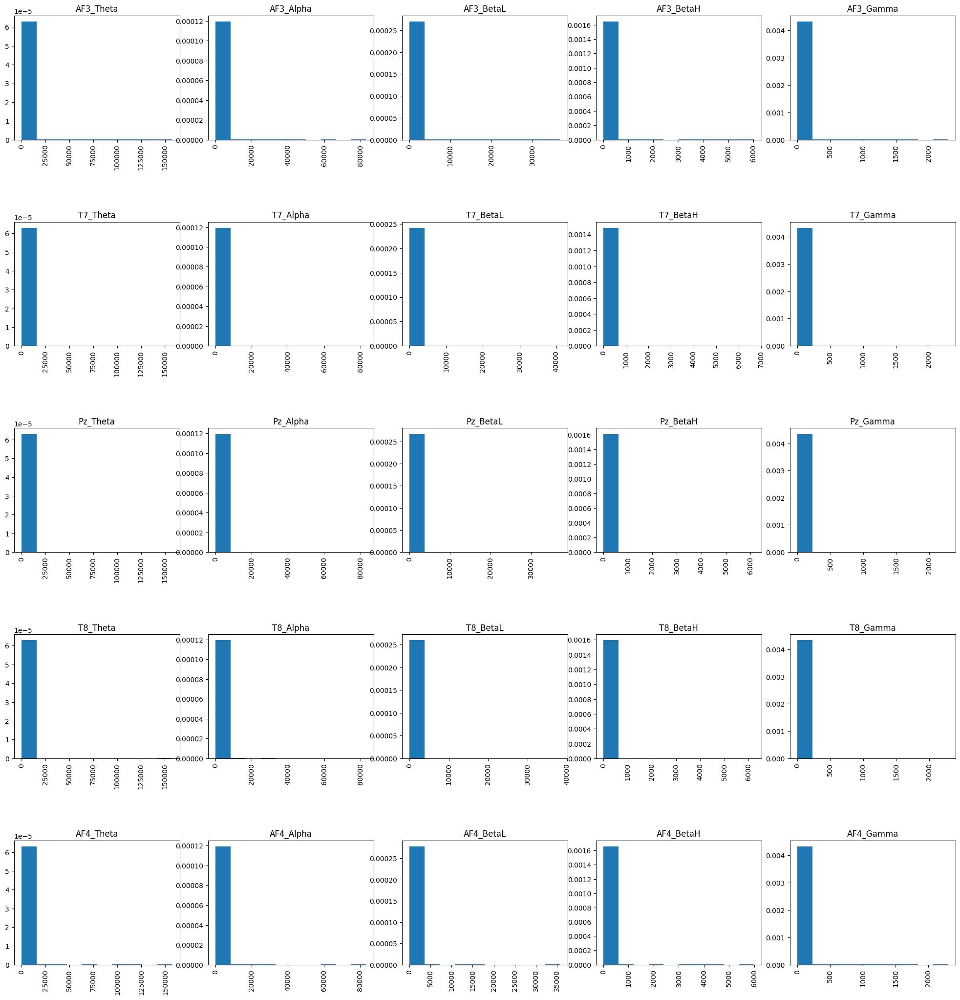

FILE  7


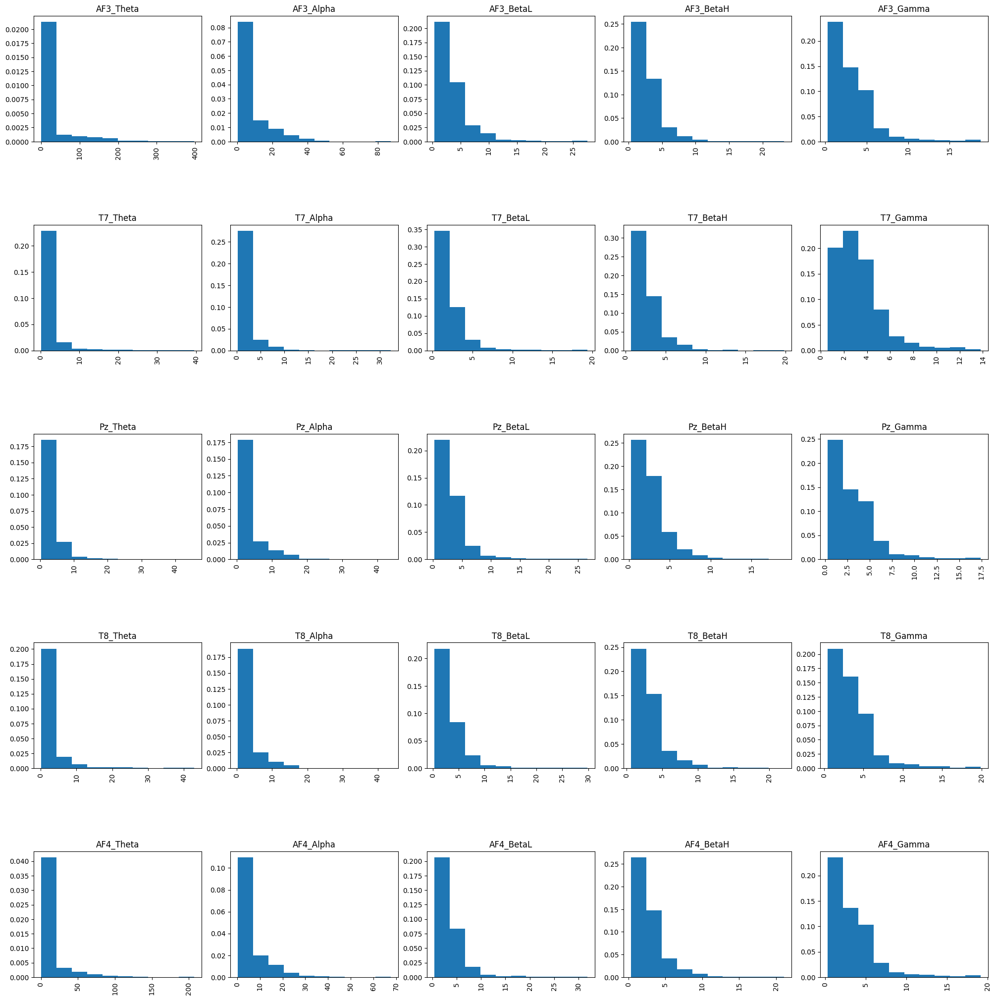

FILE  8


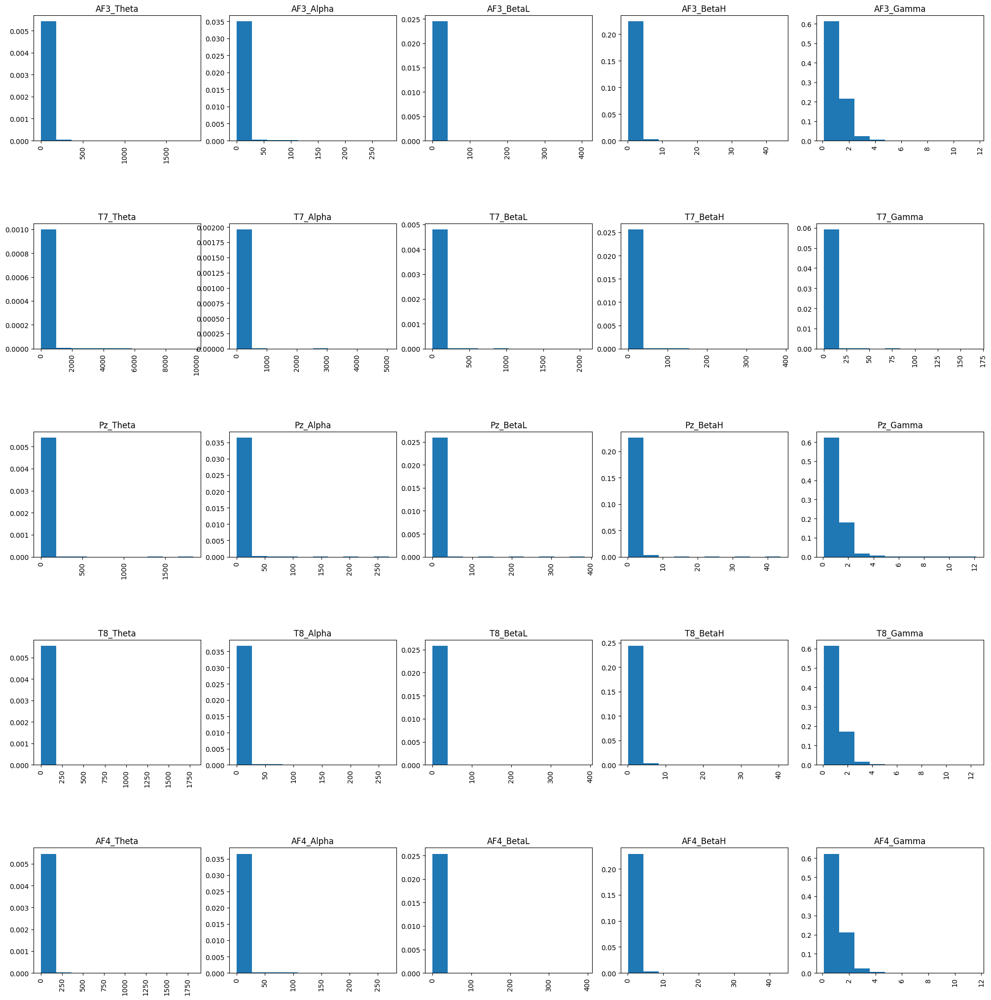

FILE  9


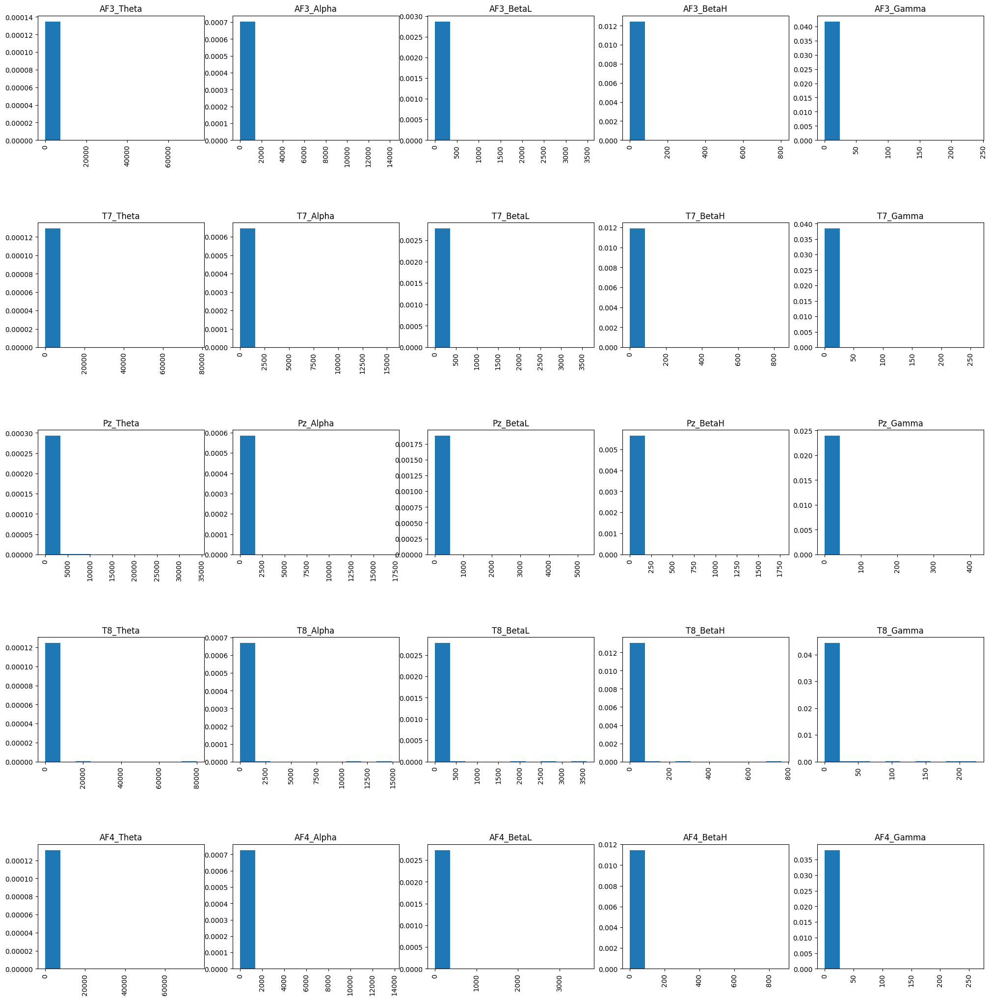

FILE  10


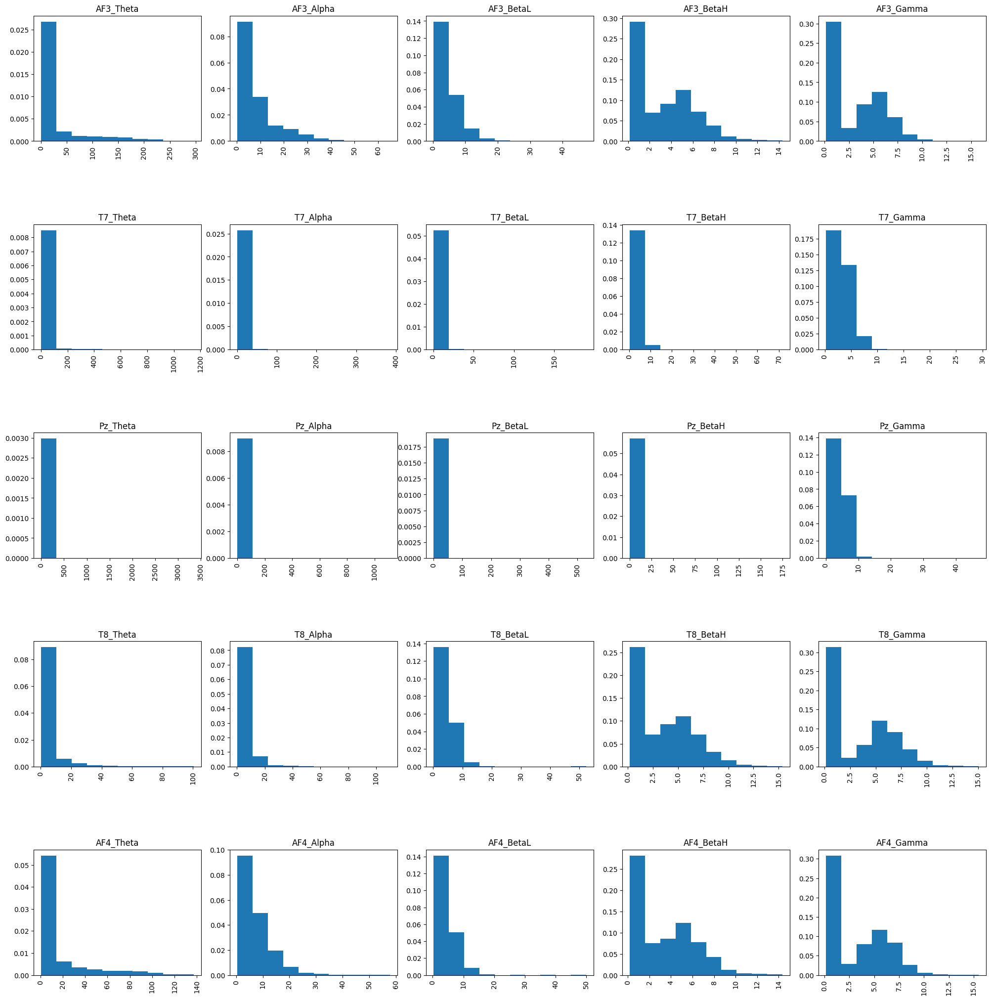

FILE  11


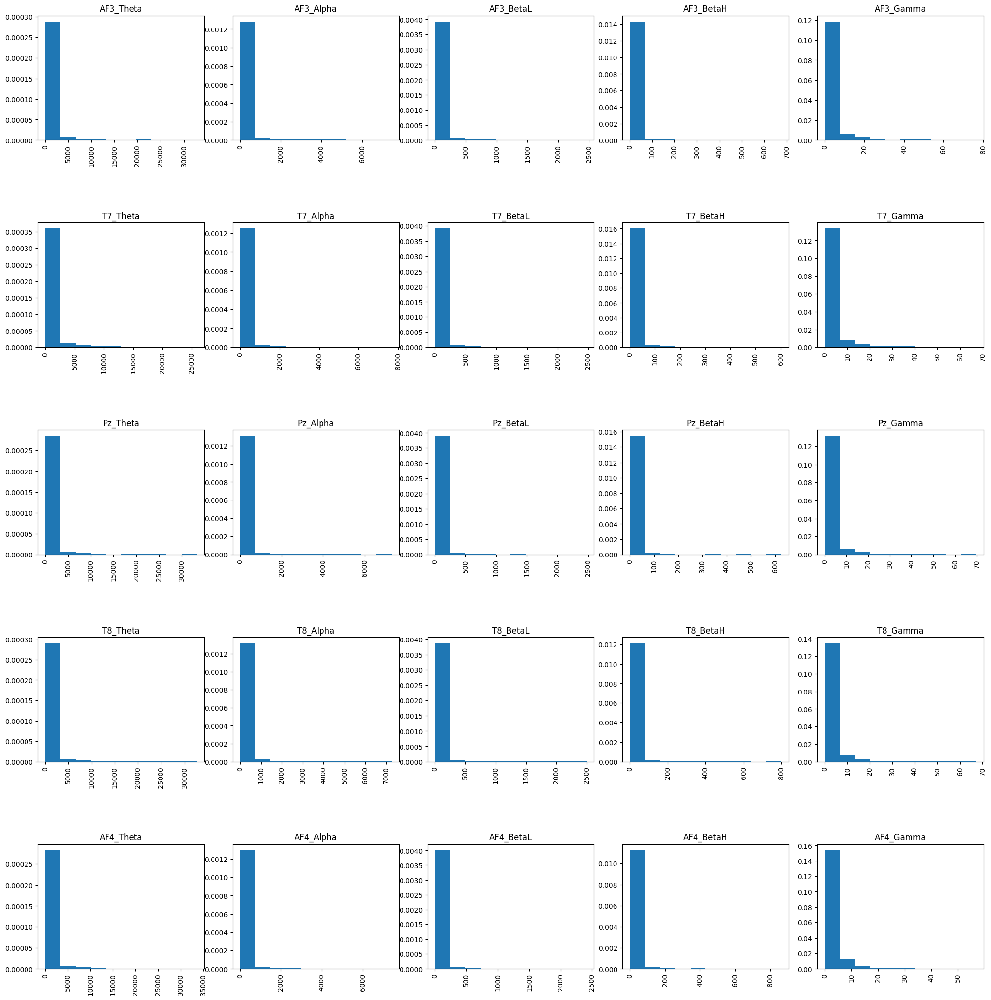

FILE  12


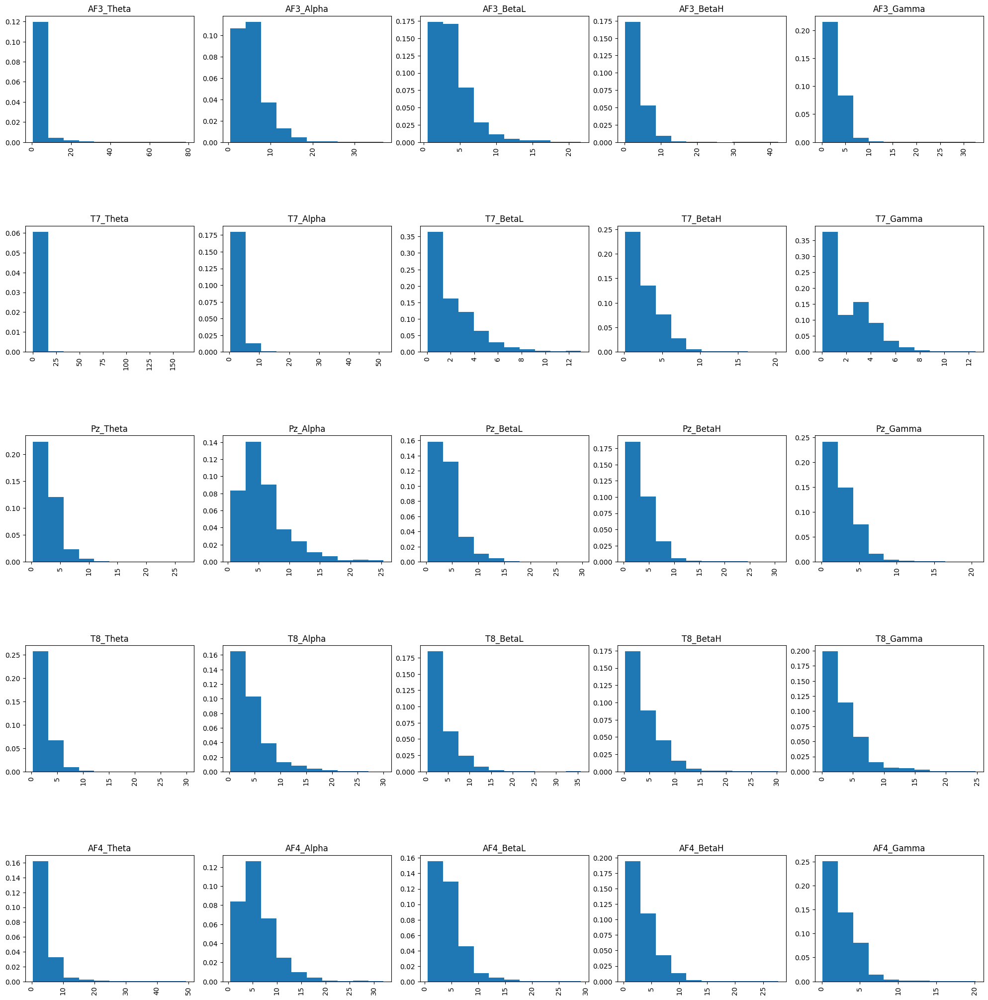

FILE  13


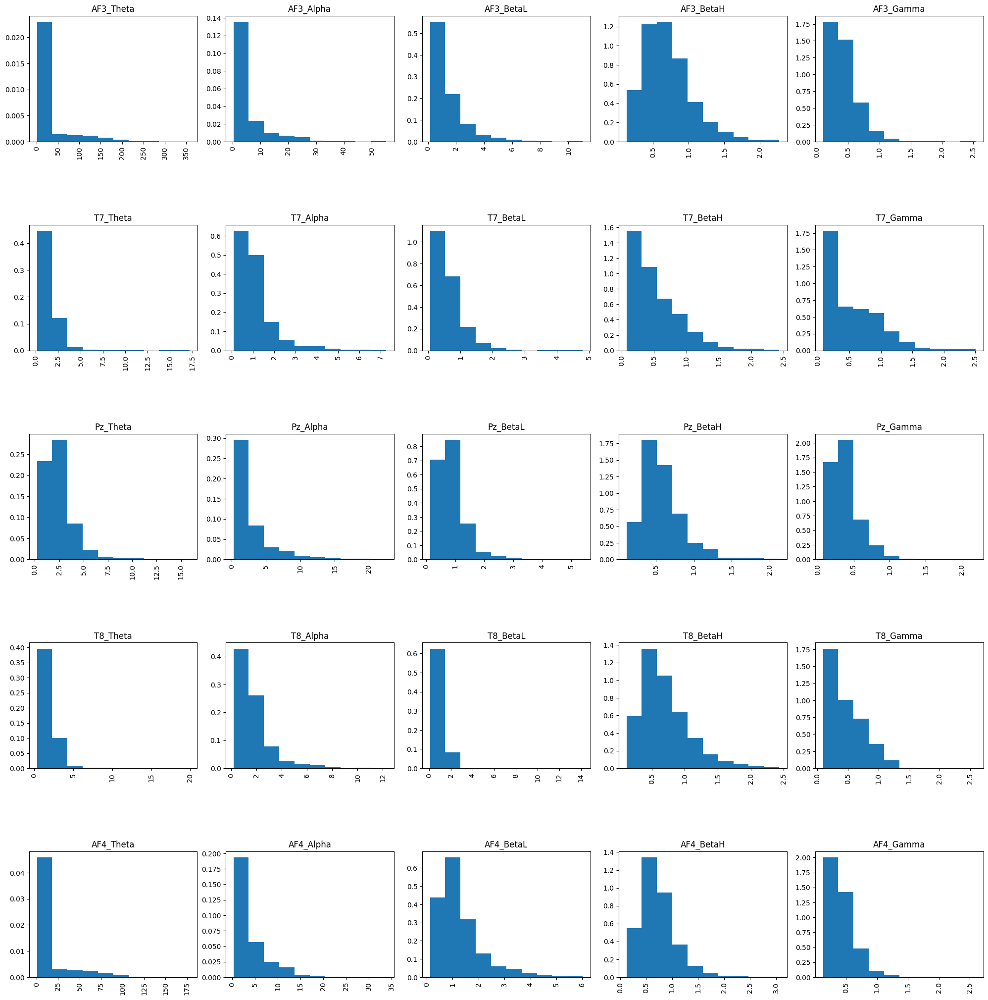

FILE  14


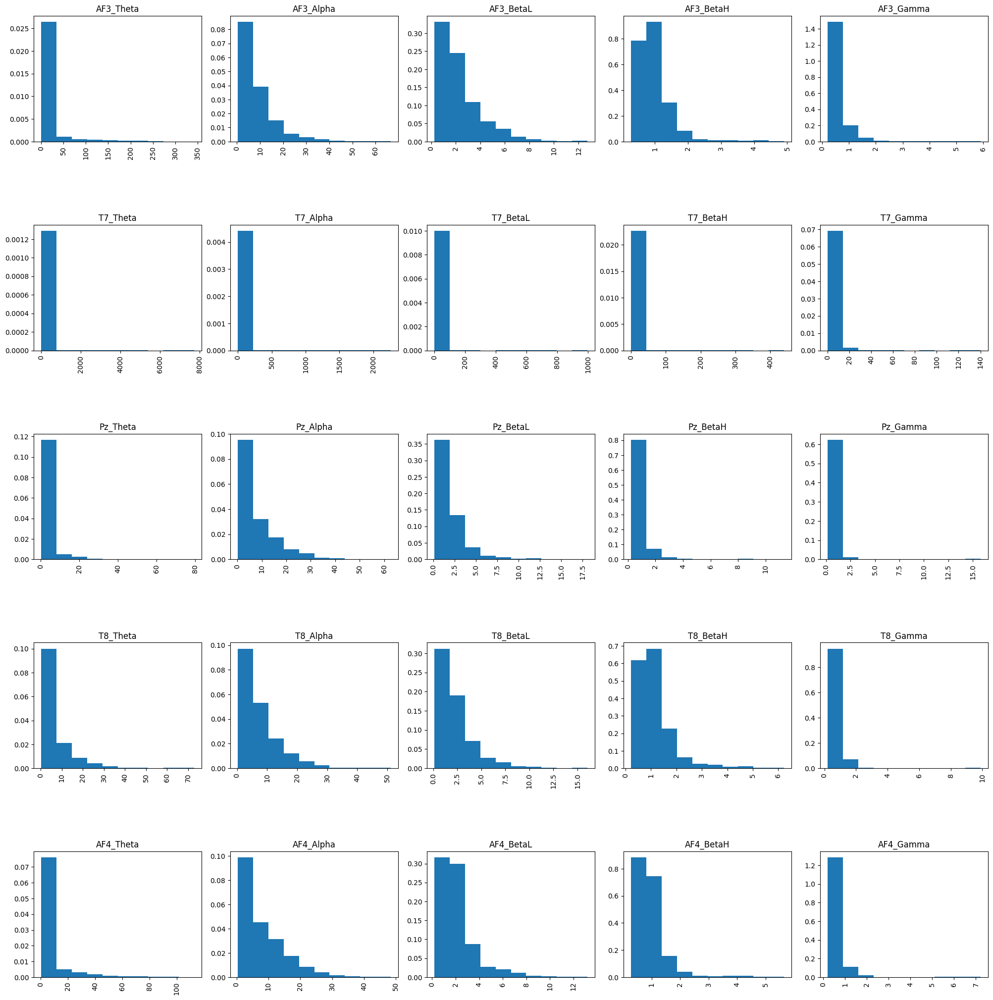

FILE  15


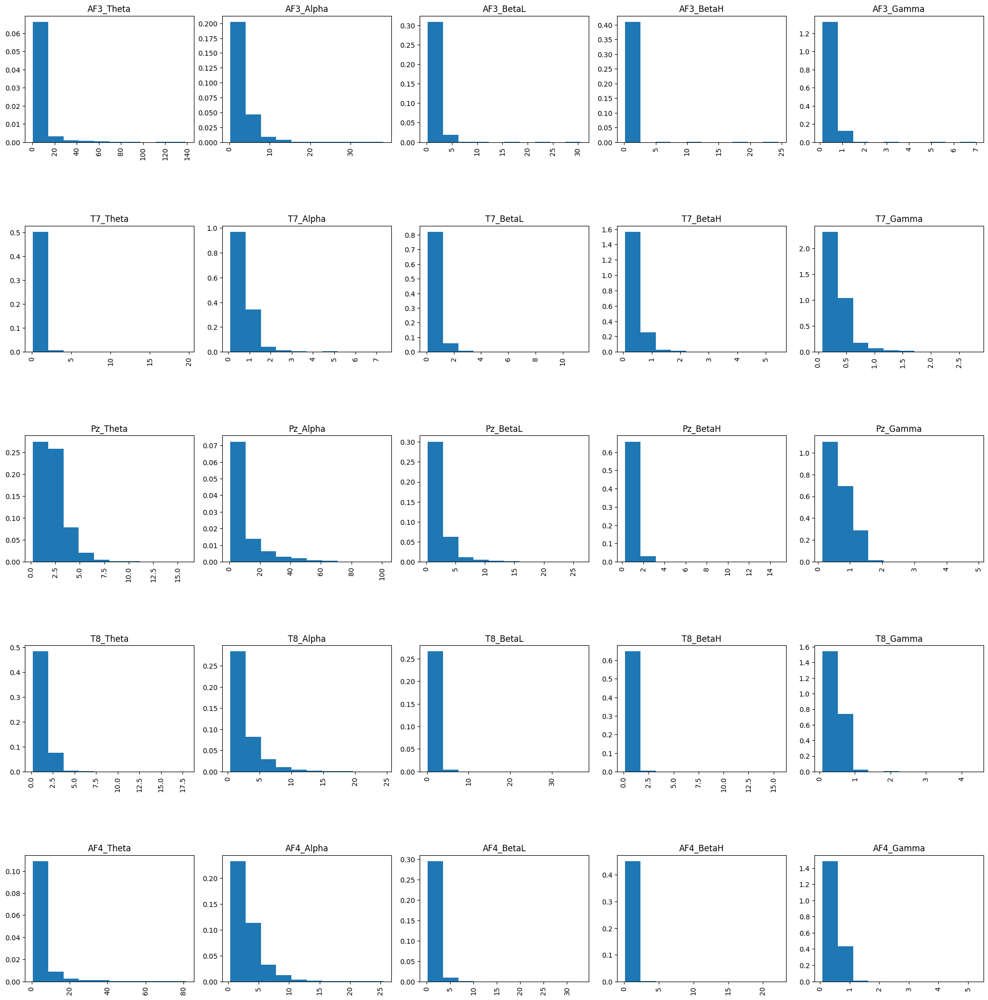

FILE  16


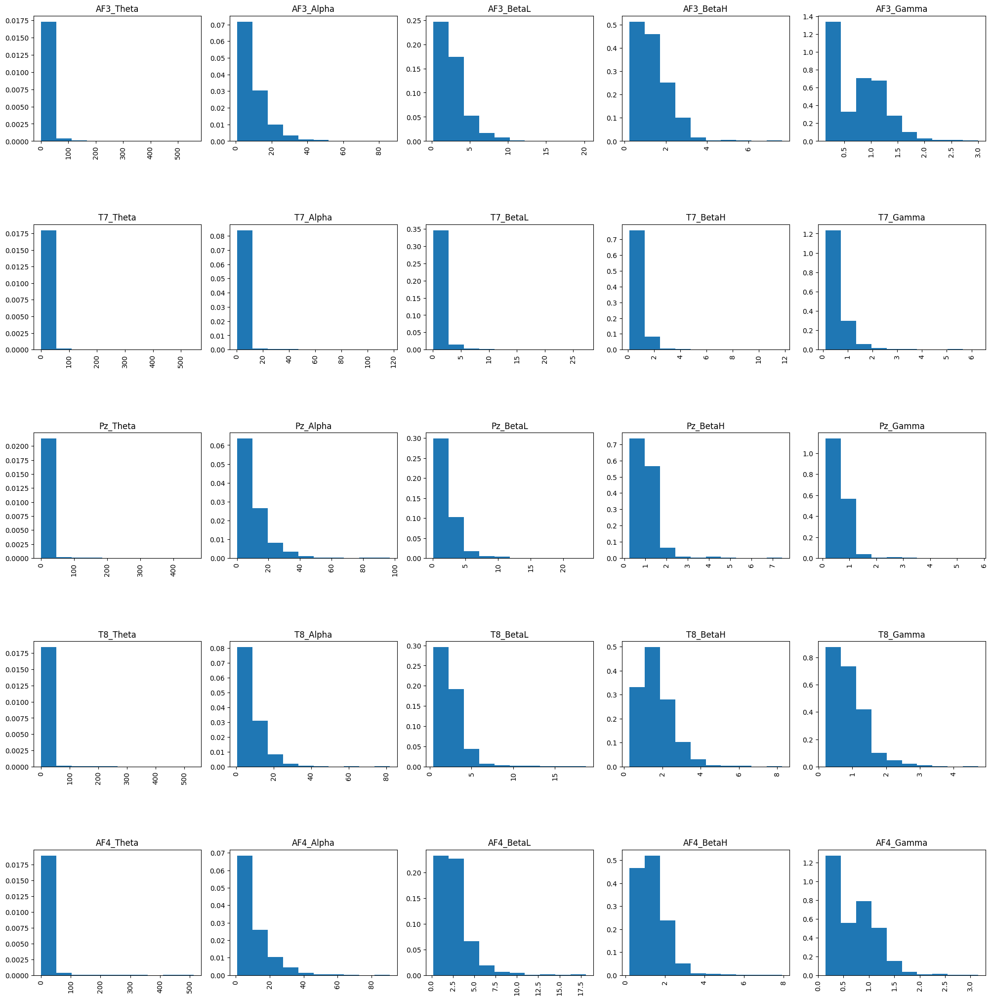

FILE  17


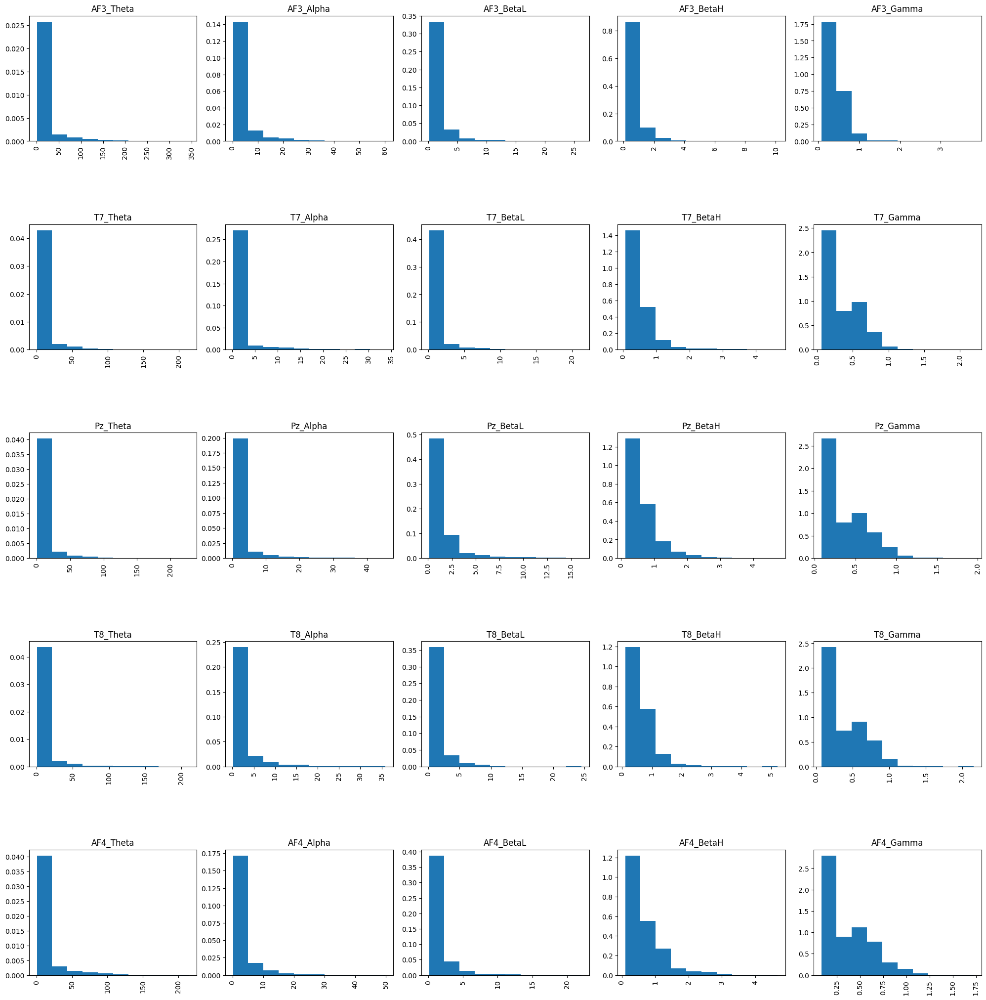

FILE  18


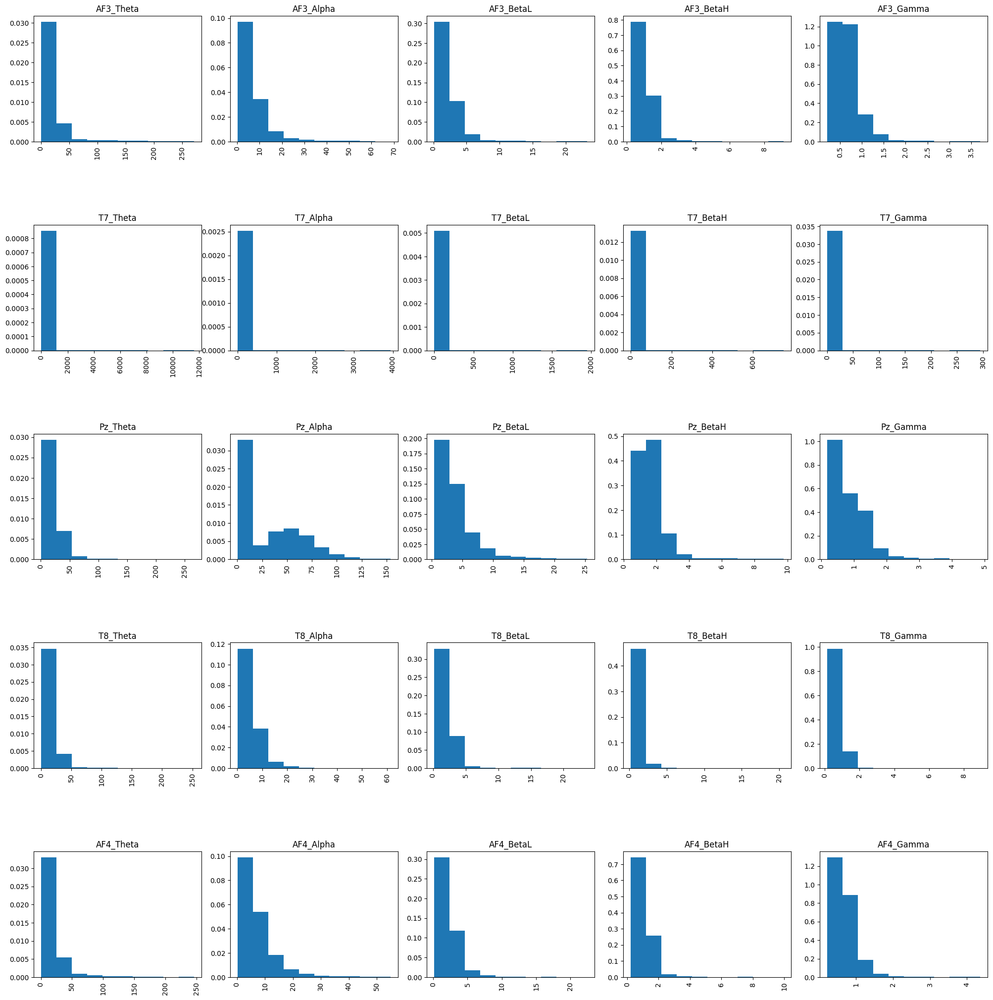

FILE  19


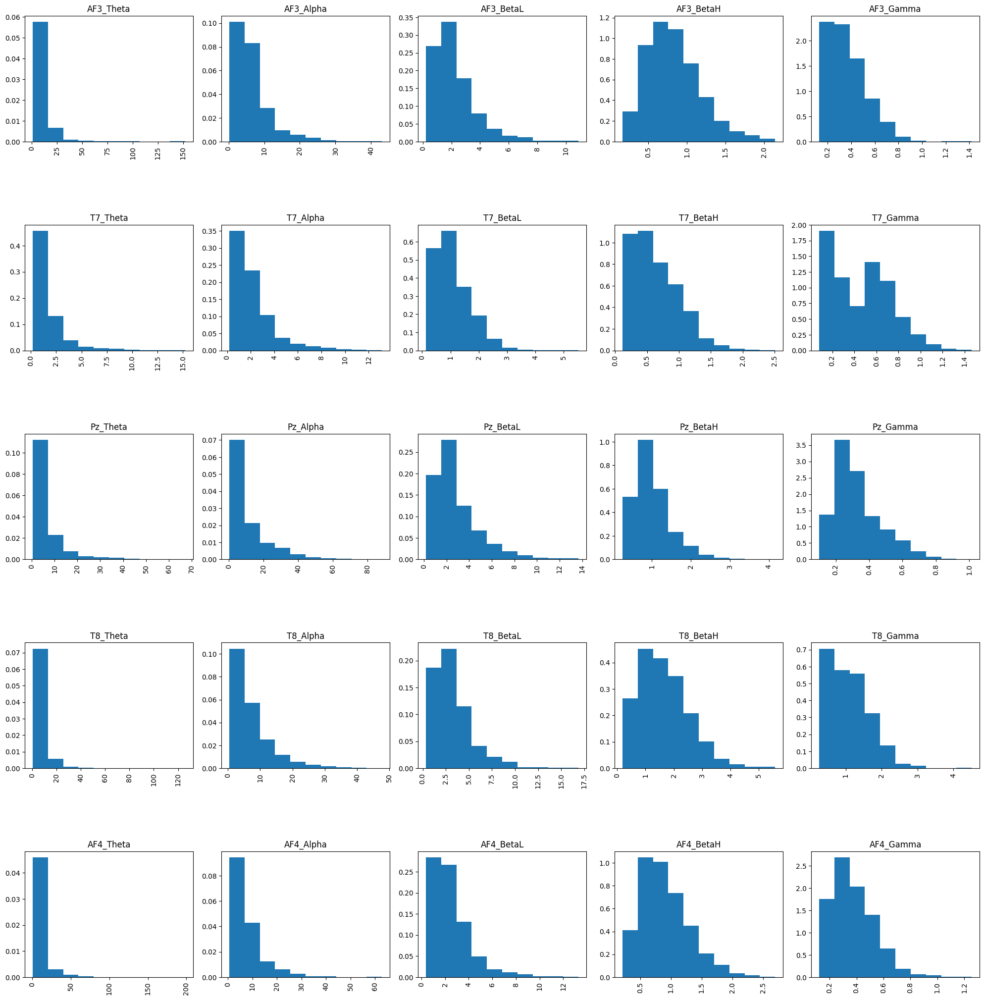

FILE  20


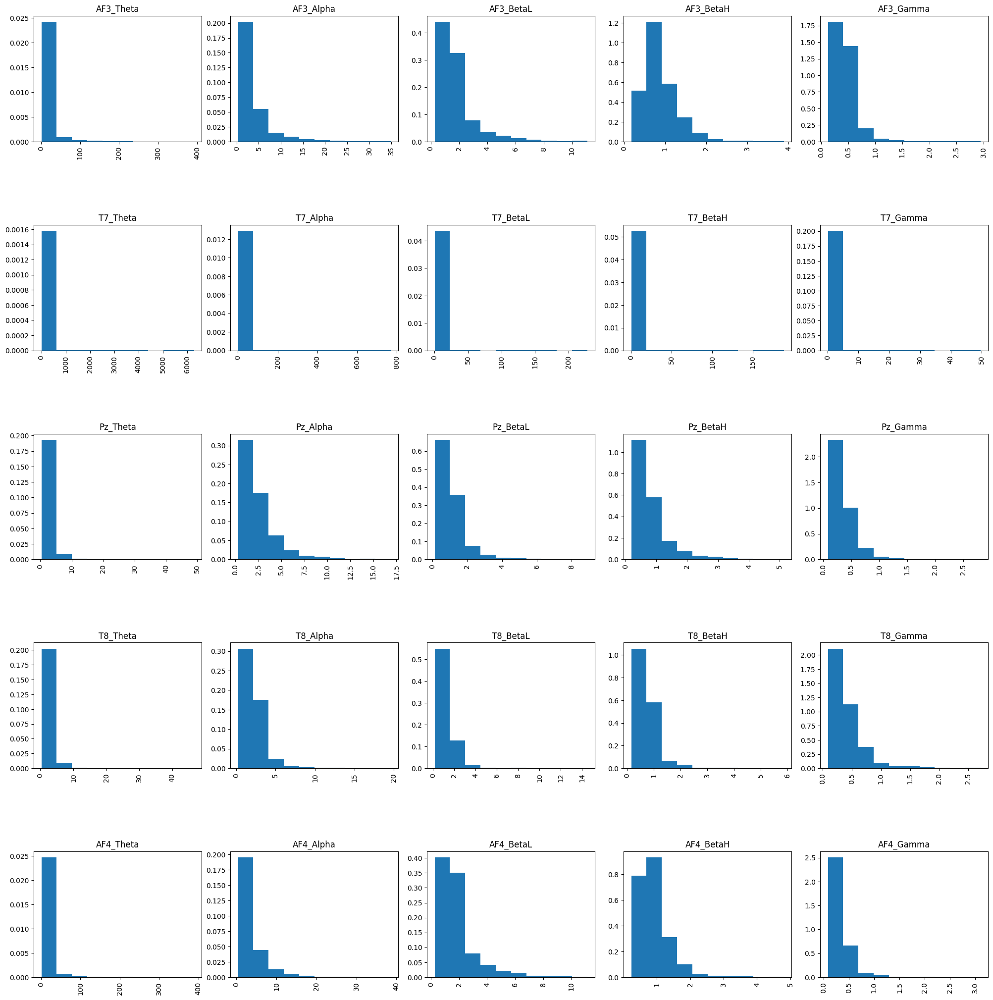

FILE  21


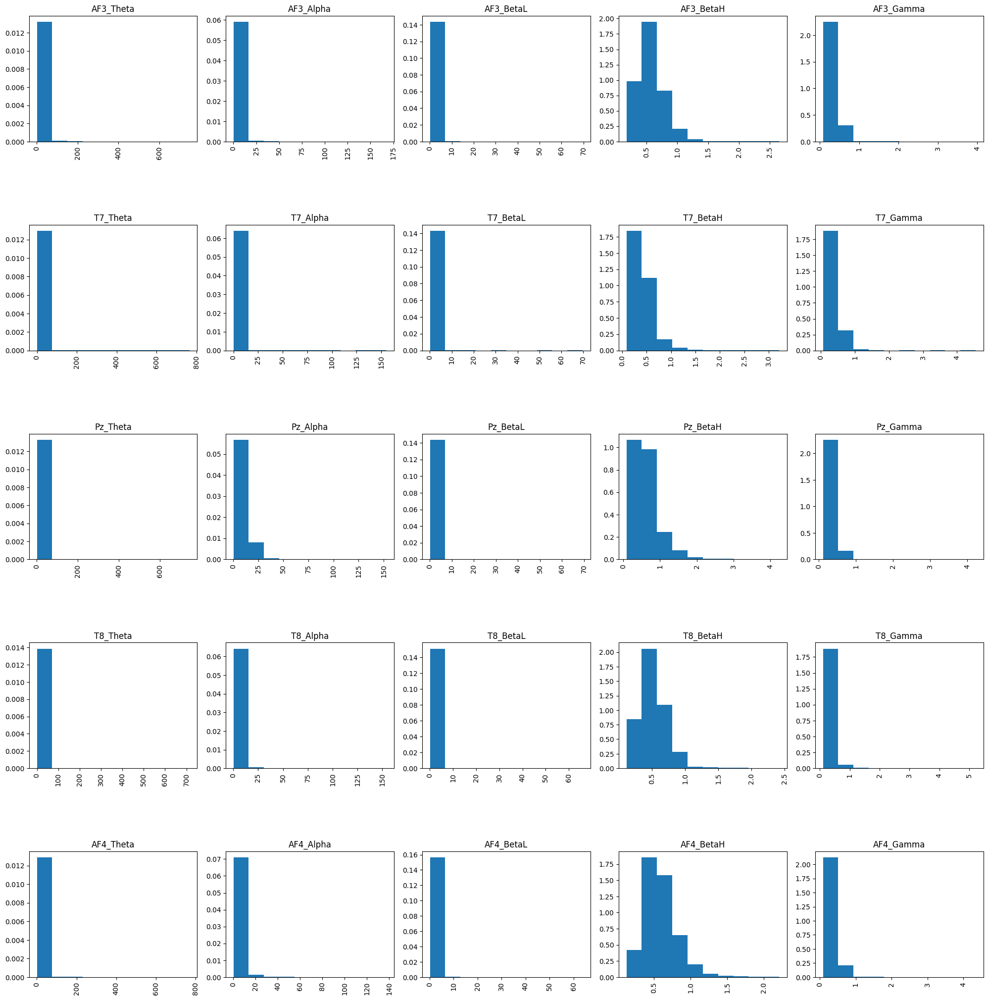

In [15]:
pow = []
for i in range(22):
  data = dataframes[i]
  onepow = data[columns_to_convert]
  pow.append(data[columns_to_convert])

  fig, axes = plt.subplots(5, 5,figsize=[20,20])
  axes = axes.flatten()
  fig.tight_layout(h_pad=10)
  print("FILE ", f'{i}')
  i=0
  for x in onepow.columns:
    plt.sca(axes[i]) # set the current Axes
    plt.hist(onepow[x],density=True)
    plt.xticks(rotation = 90) # Rotates X-Axis Ticks by 45-degrees
    plt.title(x)
    i+=1
  plt.show()

We would like the data to be as distributed and normal as possible. Since these data points are concentrated around zero and exhibit exponential decay, we apply a logarithm to make them more "normal."

In [16]:
pow_transformed = []
for i in range(22):
  onepow = pow[i]
  onepow_transformed = onepow[columns_to_convert].apply(lambda x: x.apply(lambda y: math.log(y + 1)))
  pow_transformed.append(onepow_transformed)

FILE  0


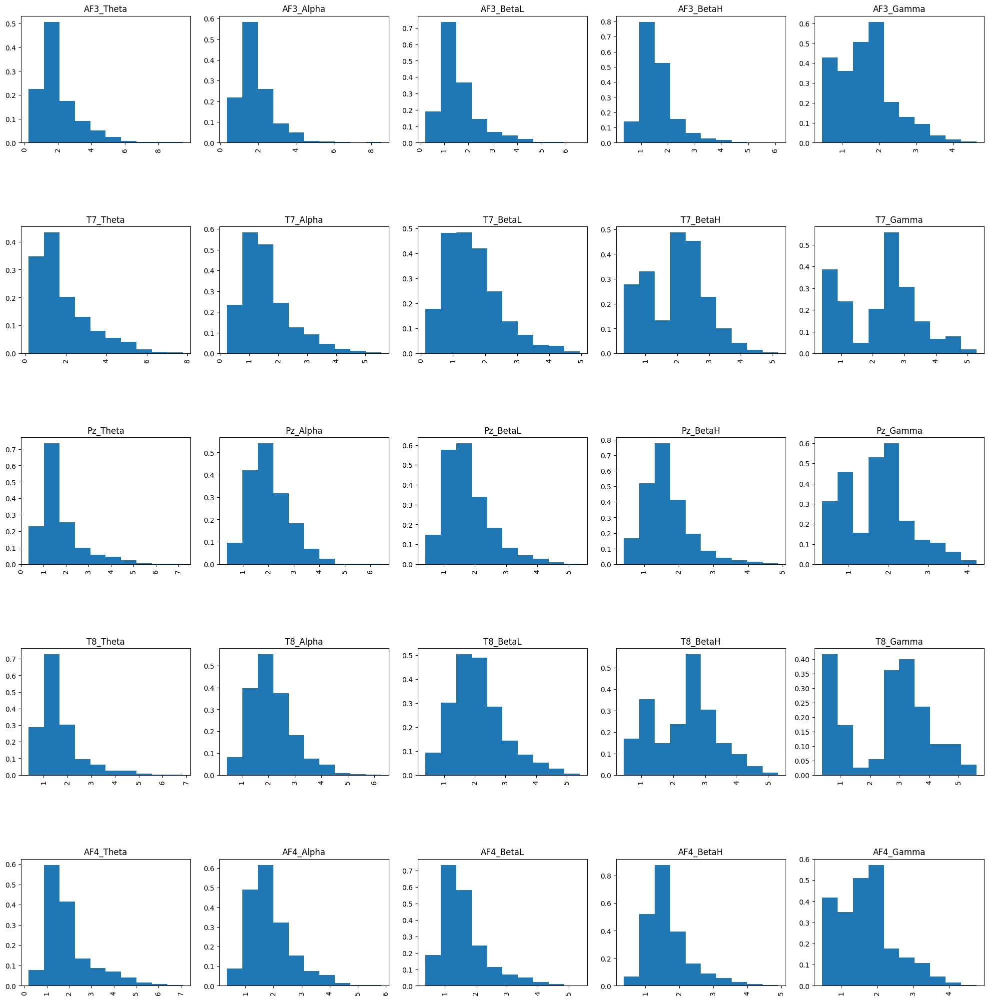

FILE  1


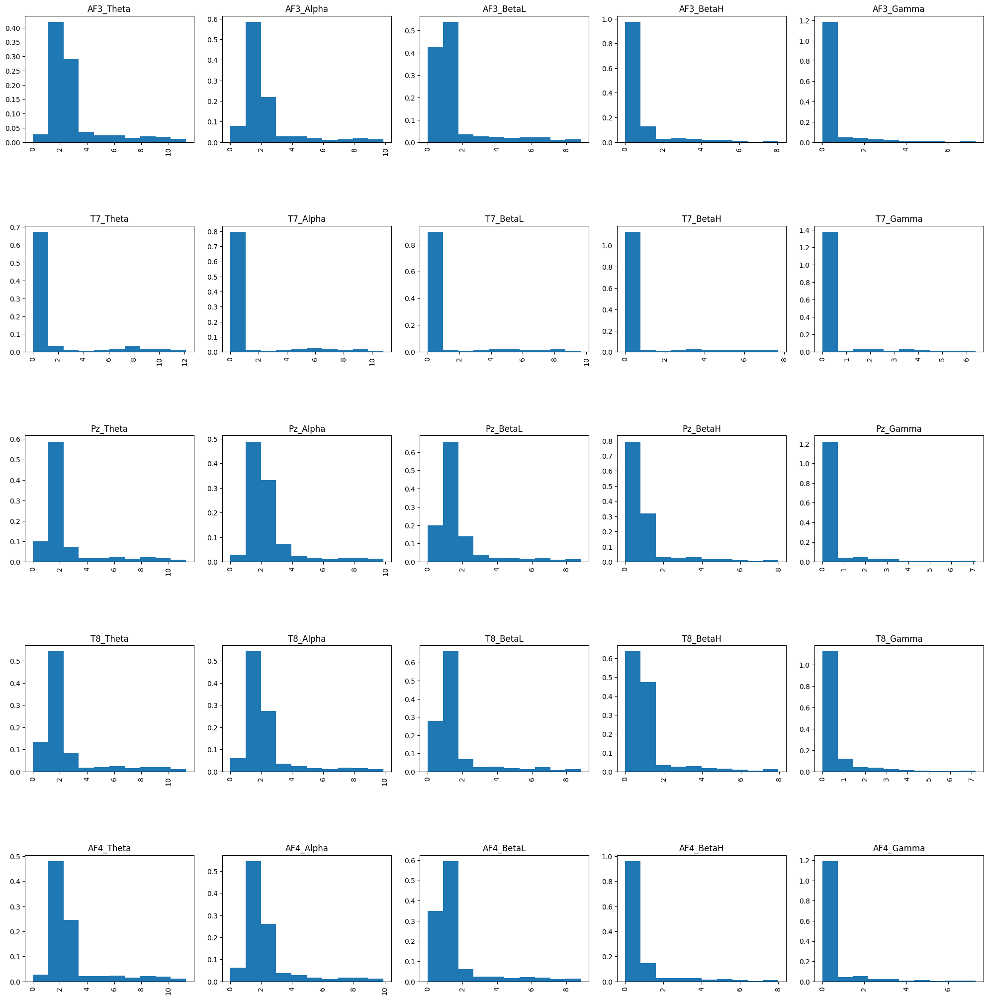

FILE  2


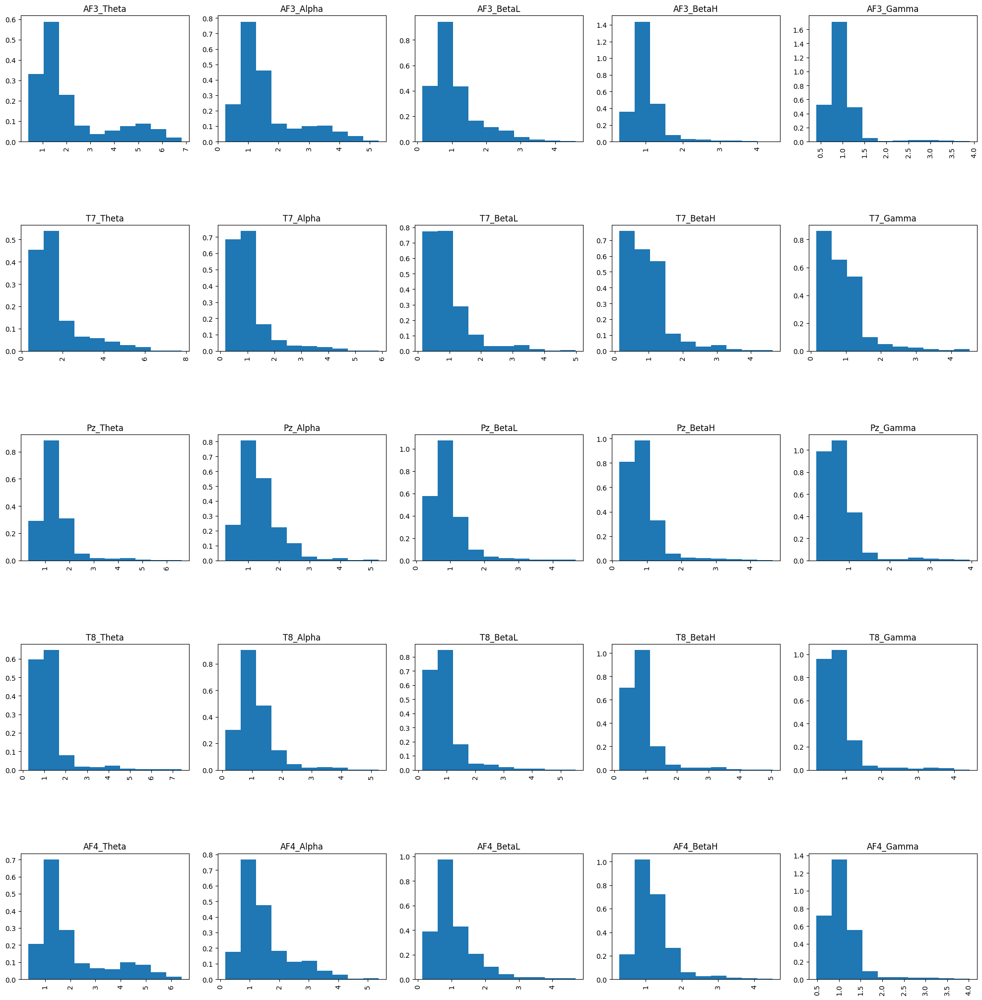

FILE  3


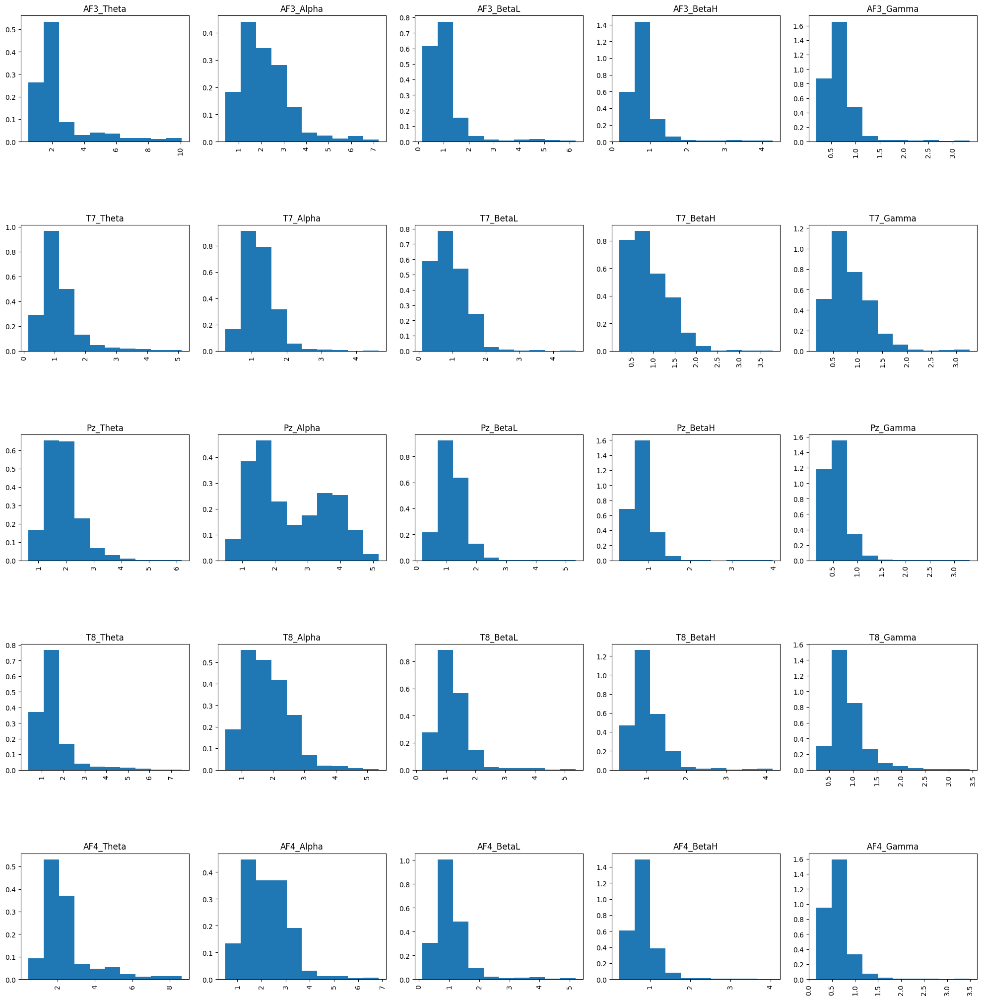

FILE  4


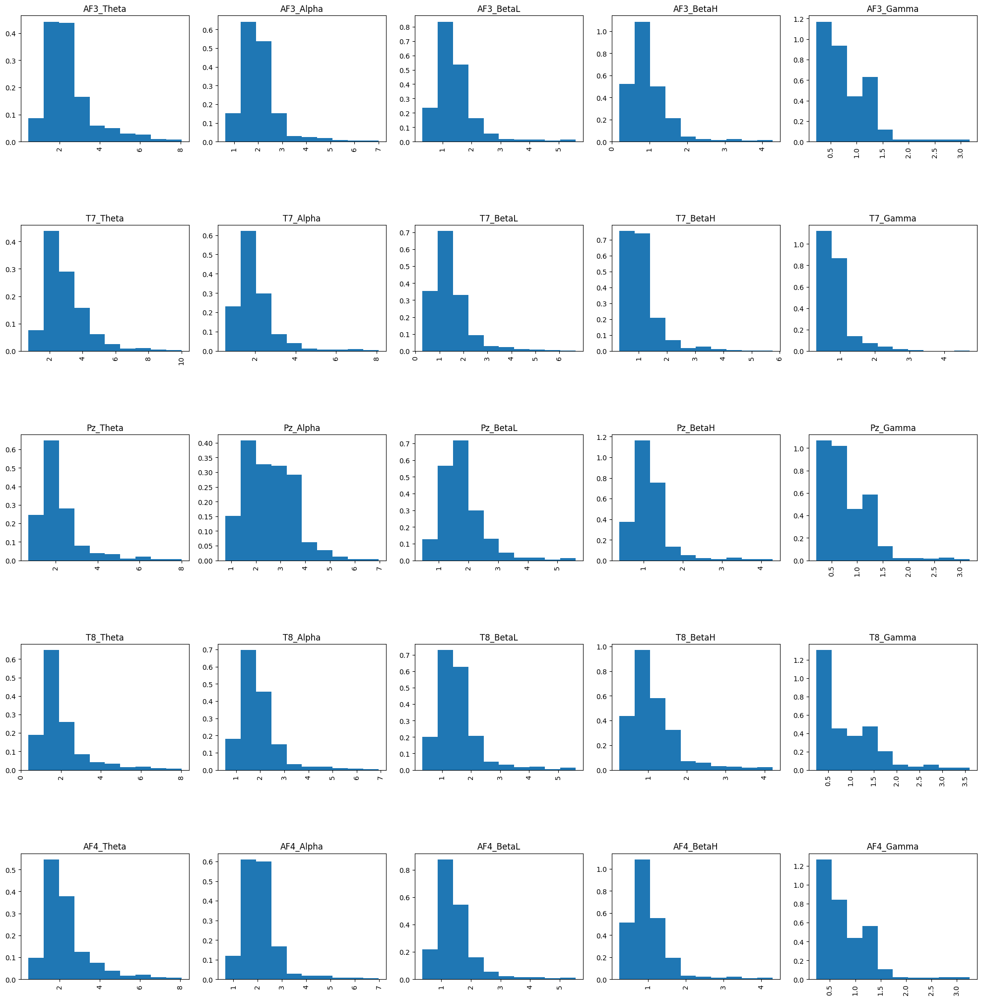

FILE  5


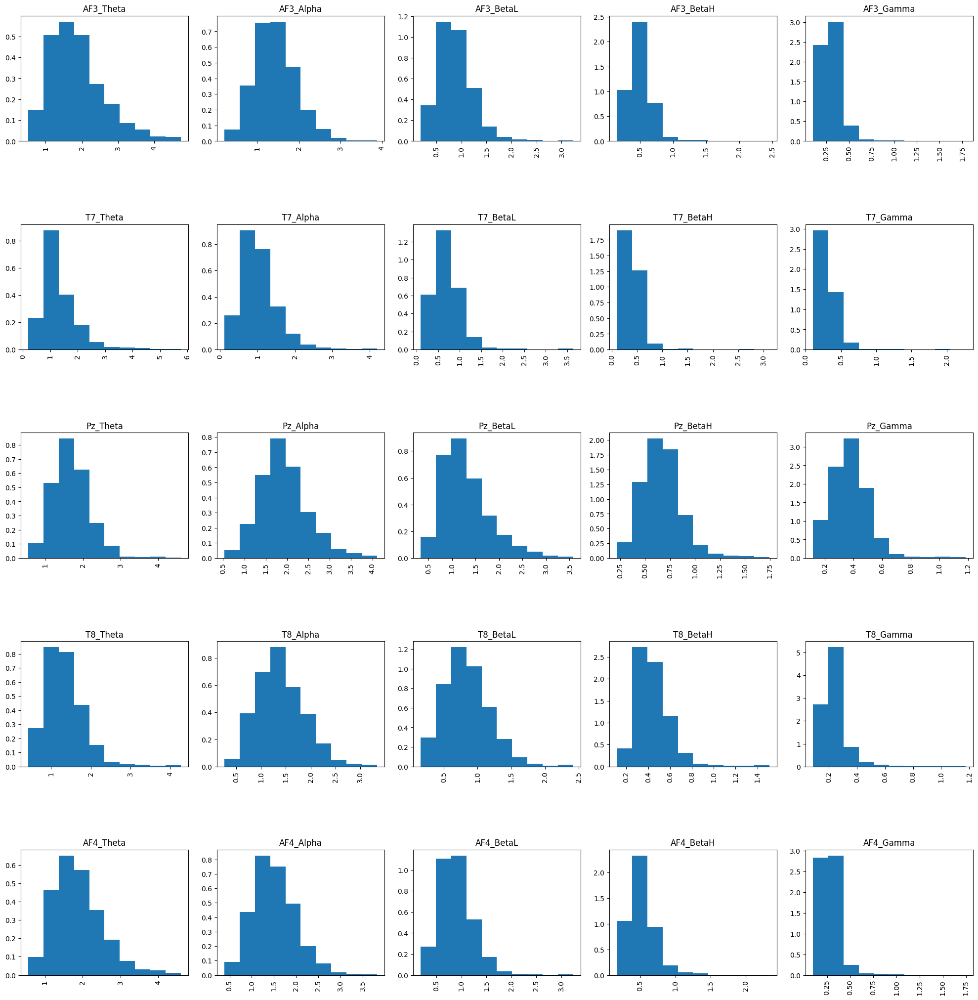

FILE  6


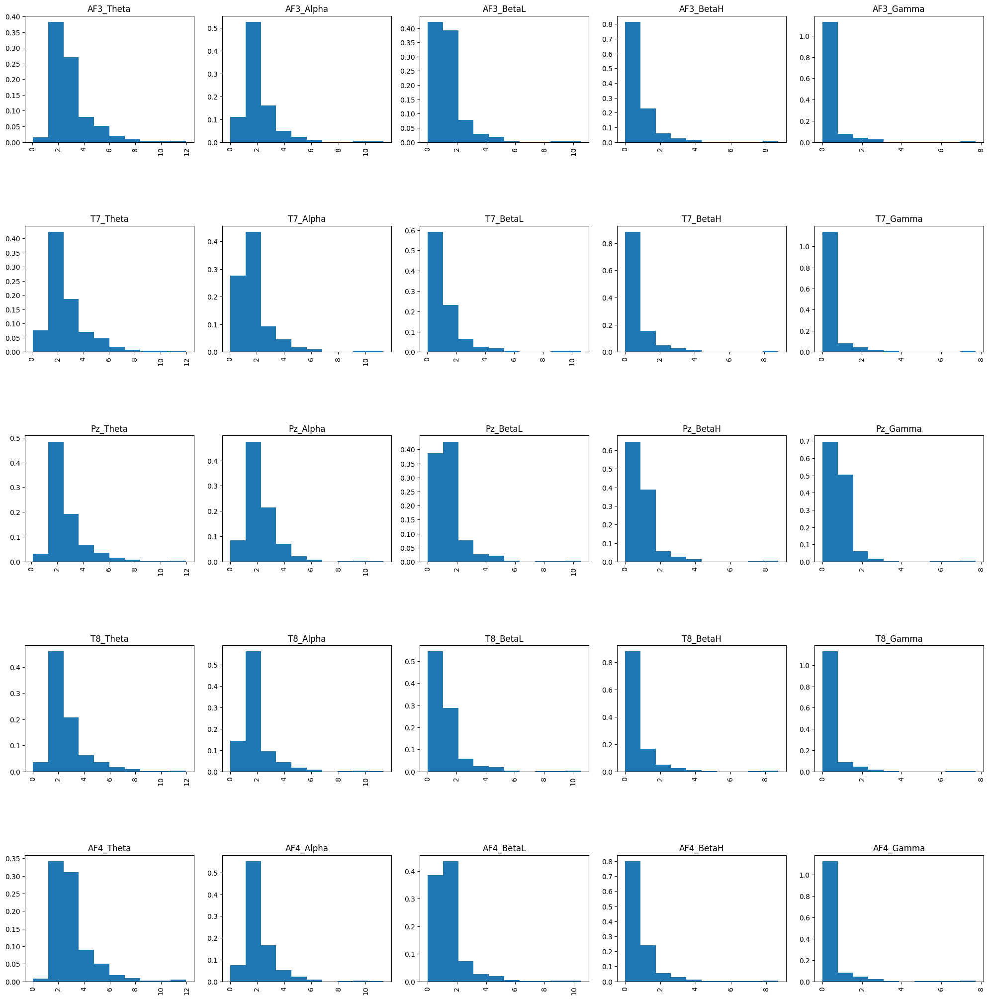

FILE  7


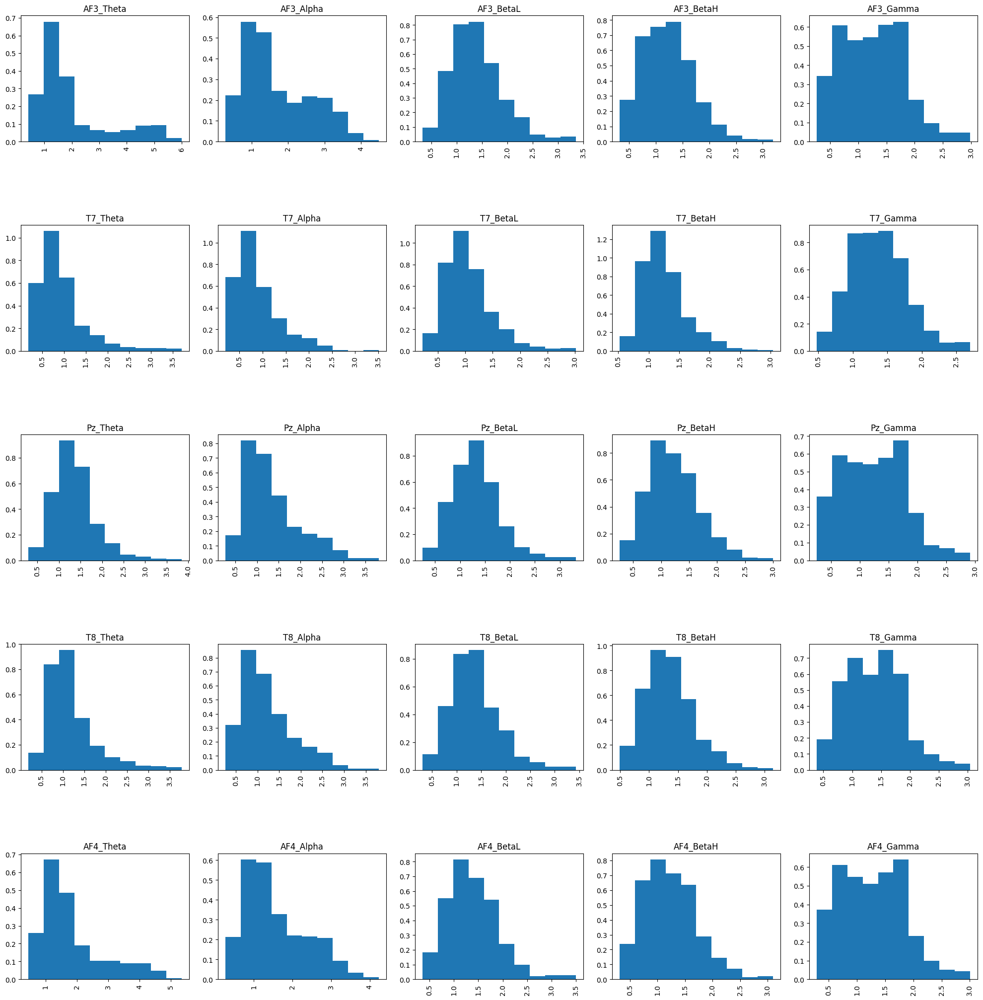

FILE  8


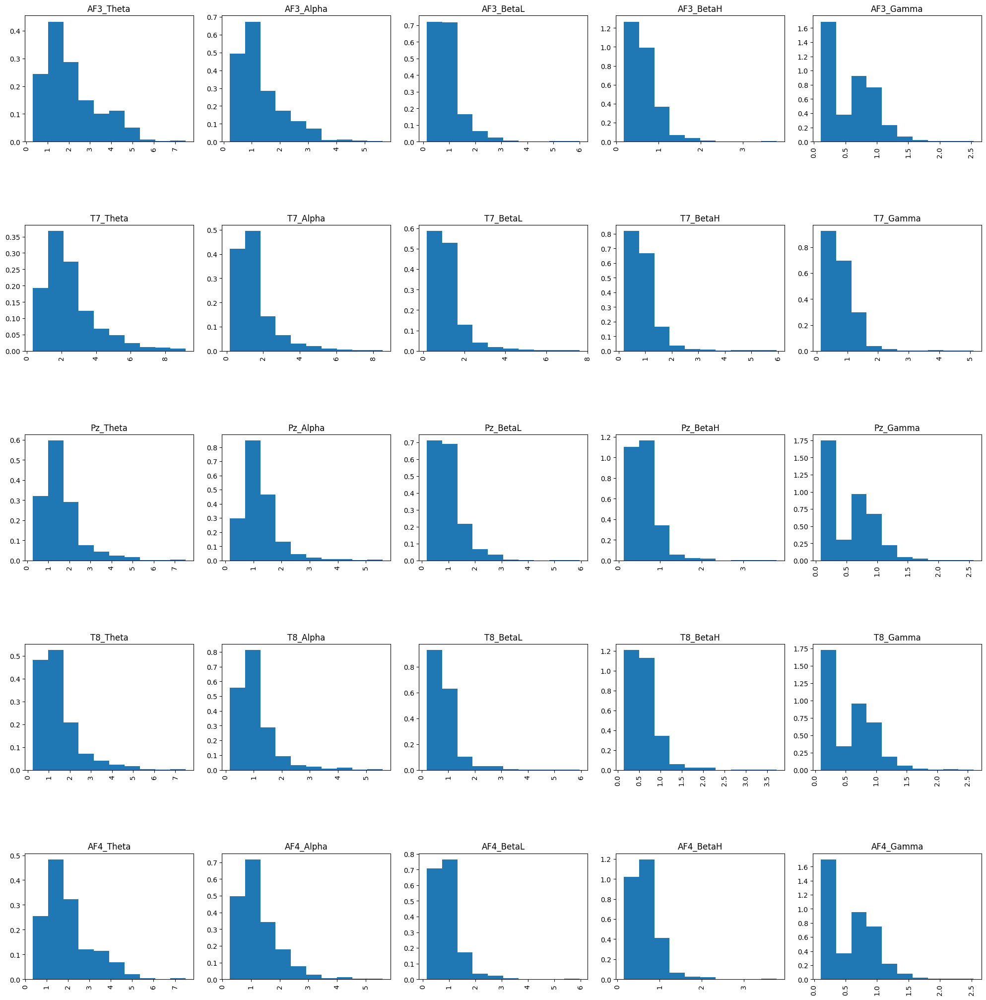

FILE  9


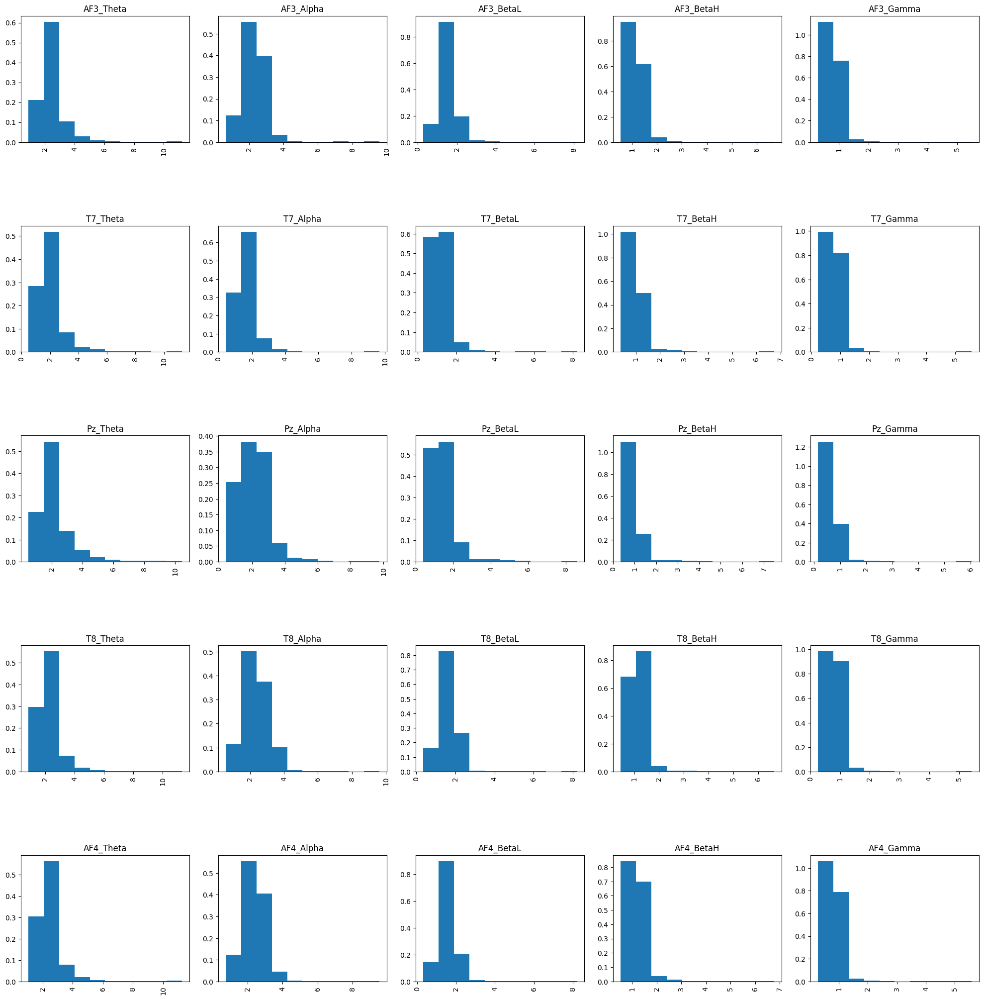

FILE  10


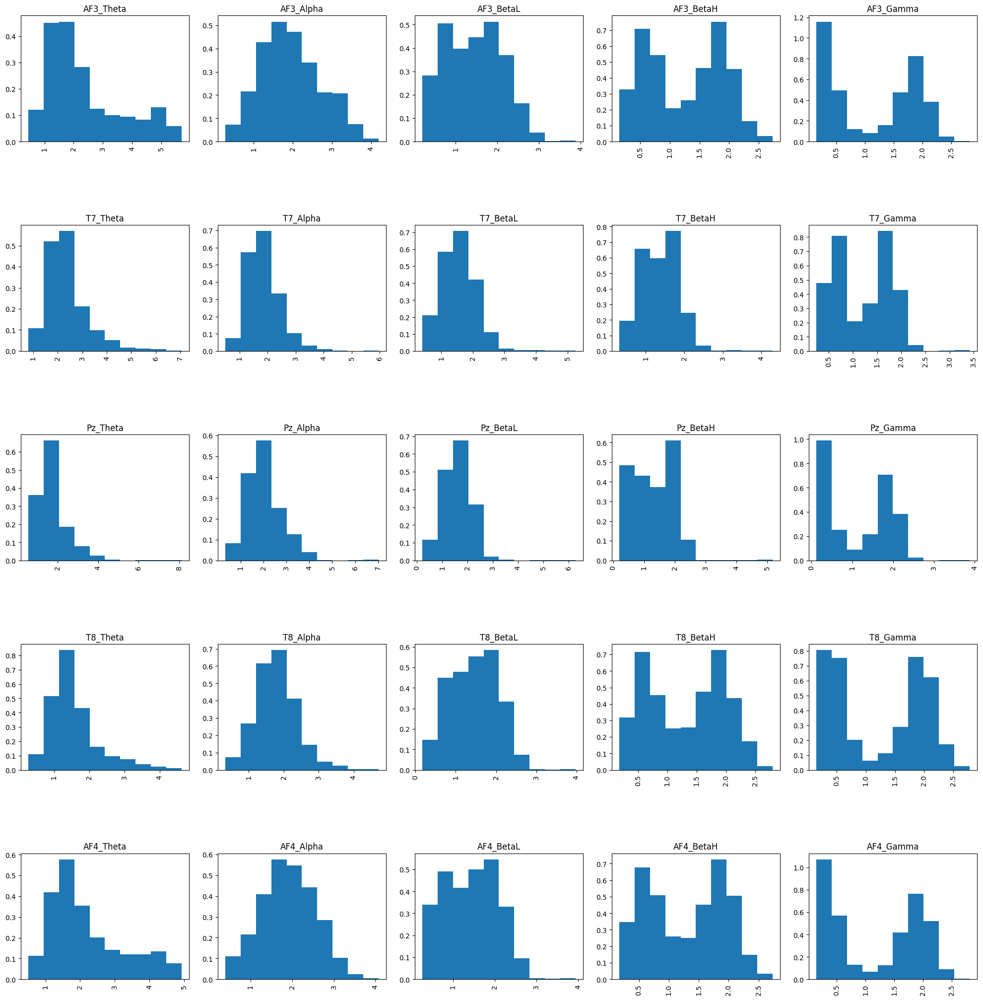

FILE  11


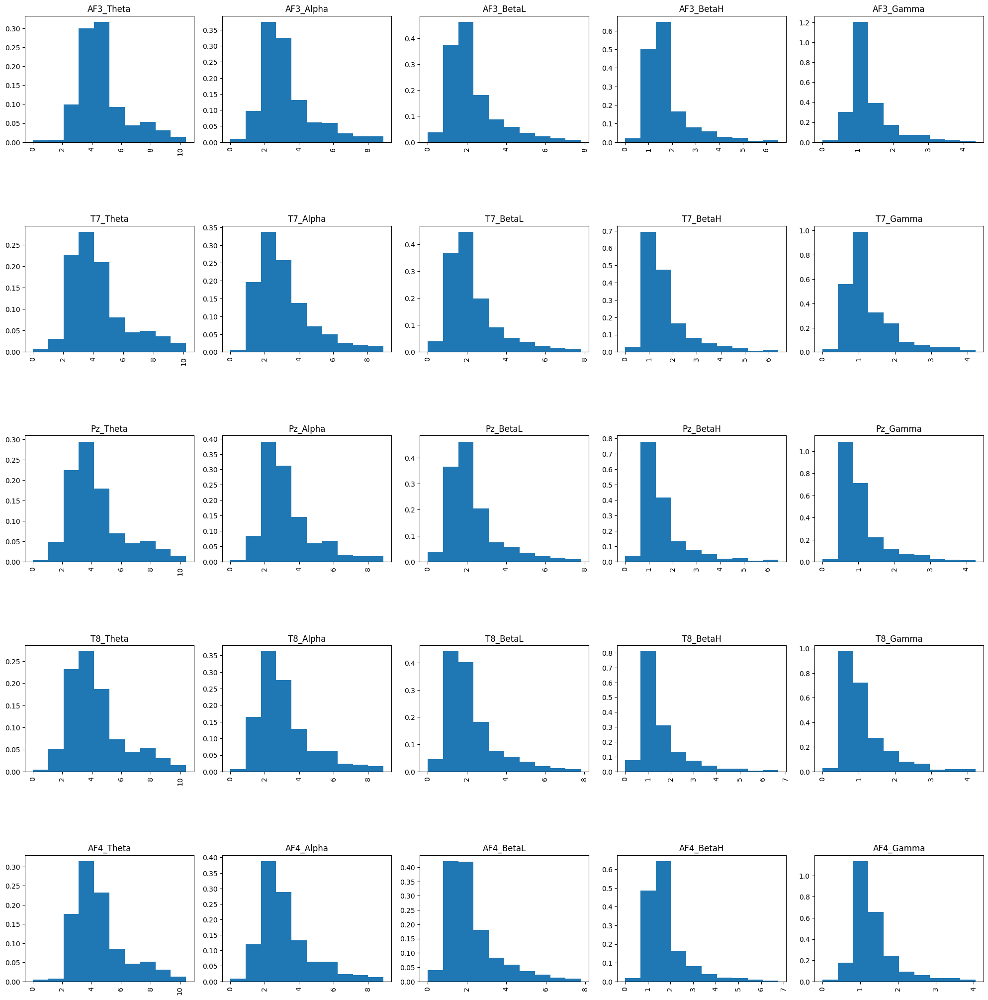

FILE  12


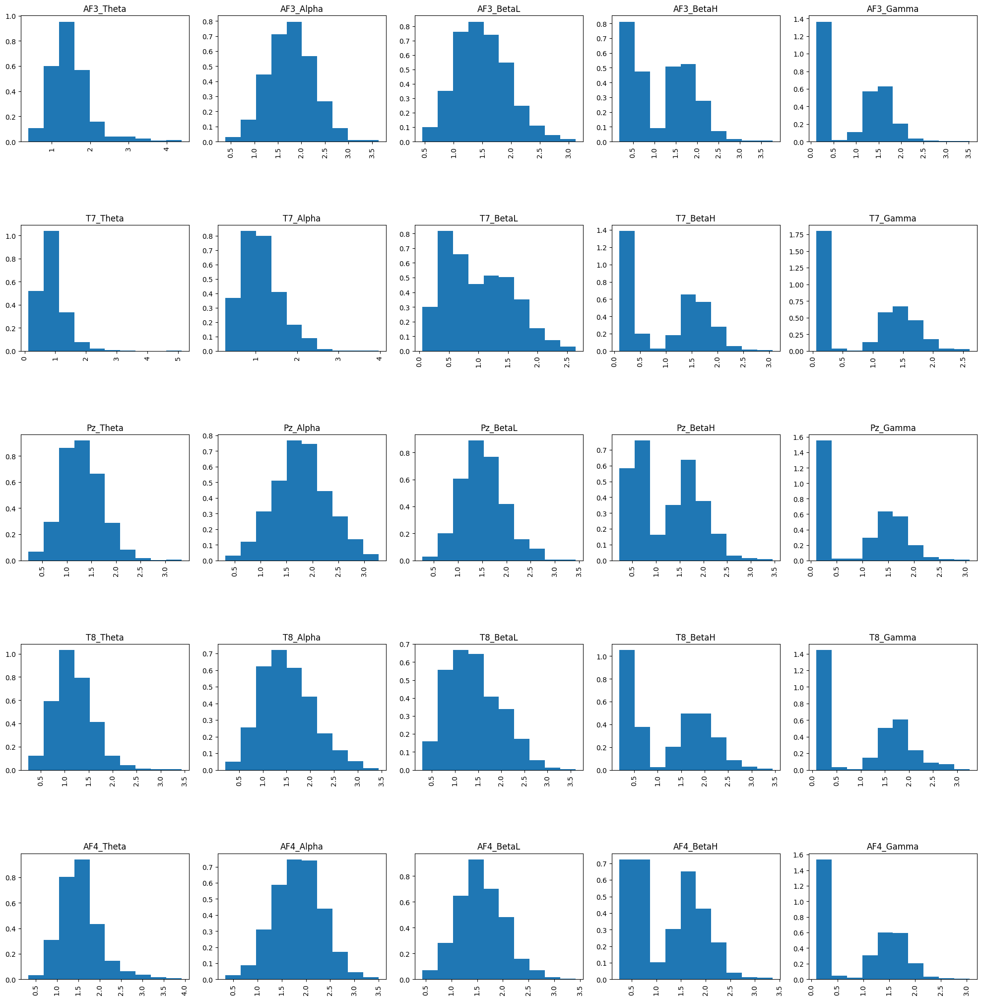

FILE  13


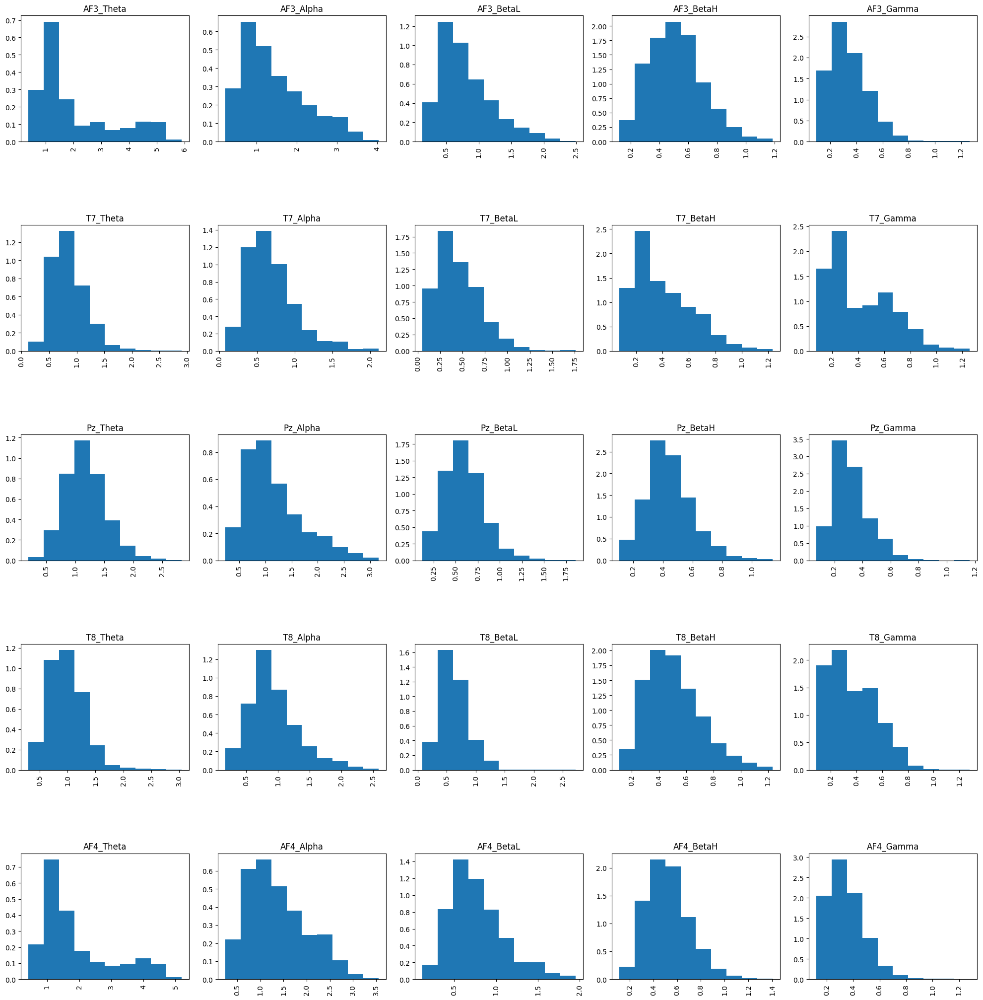

FILE  14


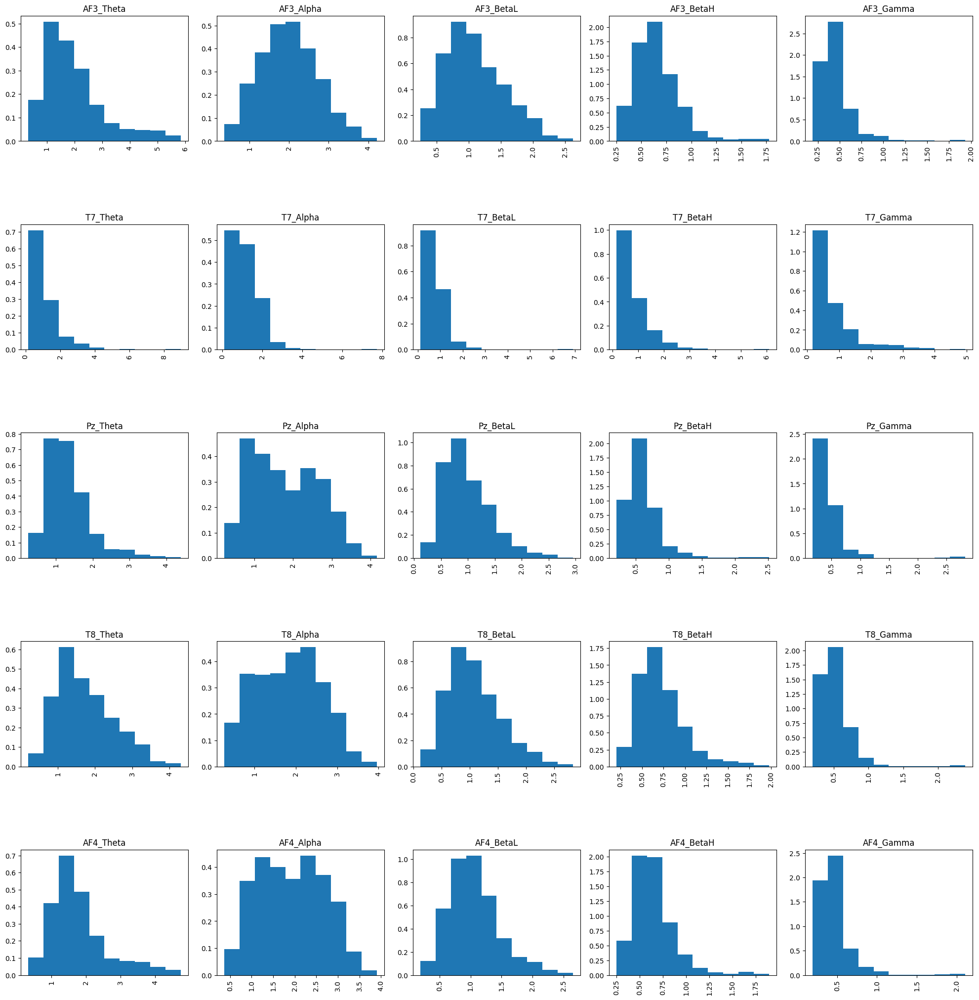

FILE  15


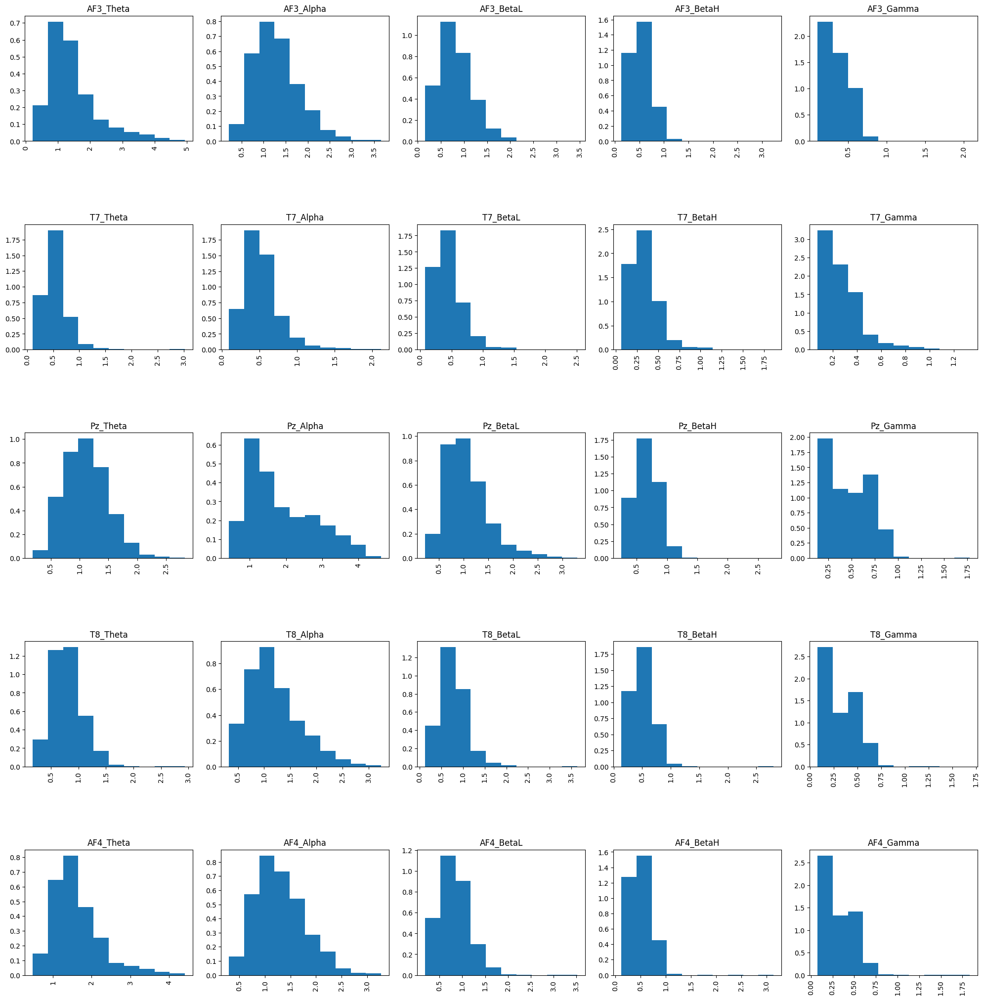

FILE  16


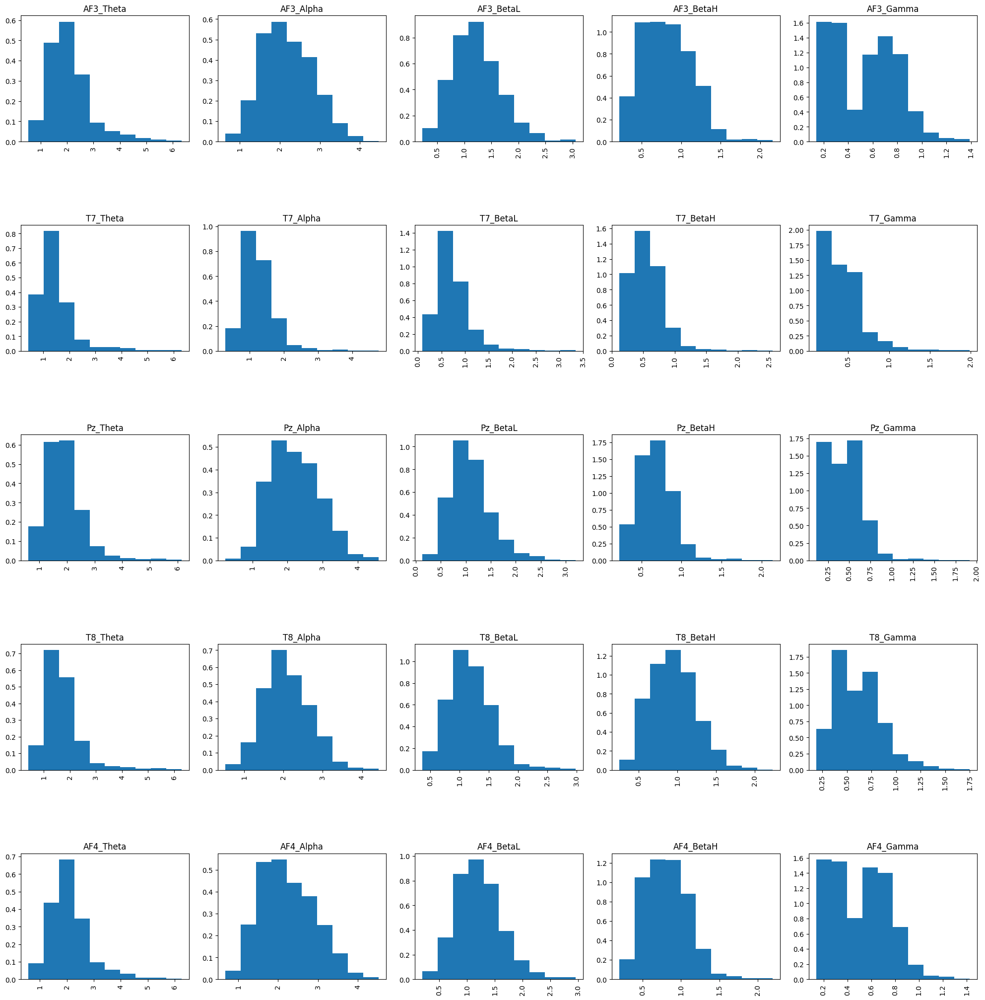

FILE  17


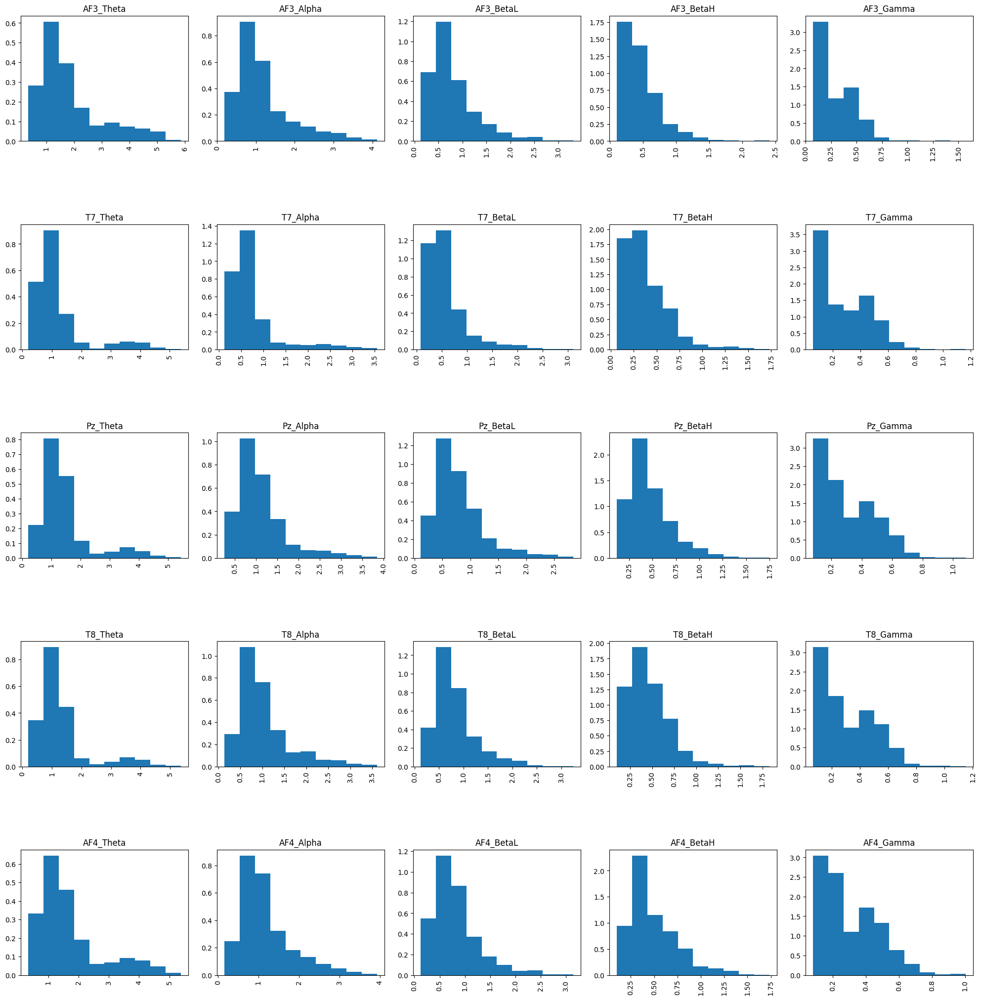

FILE  18


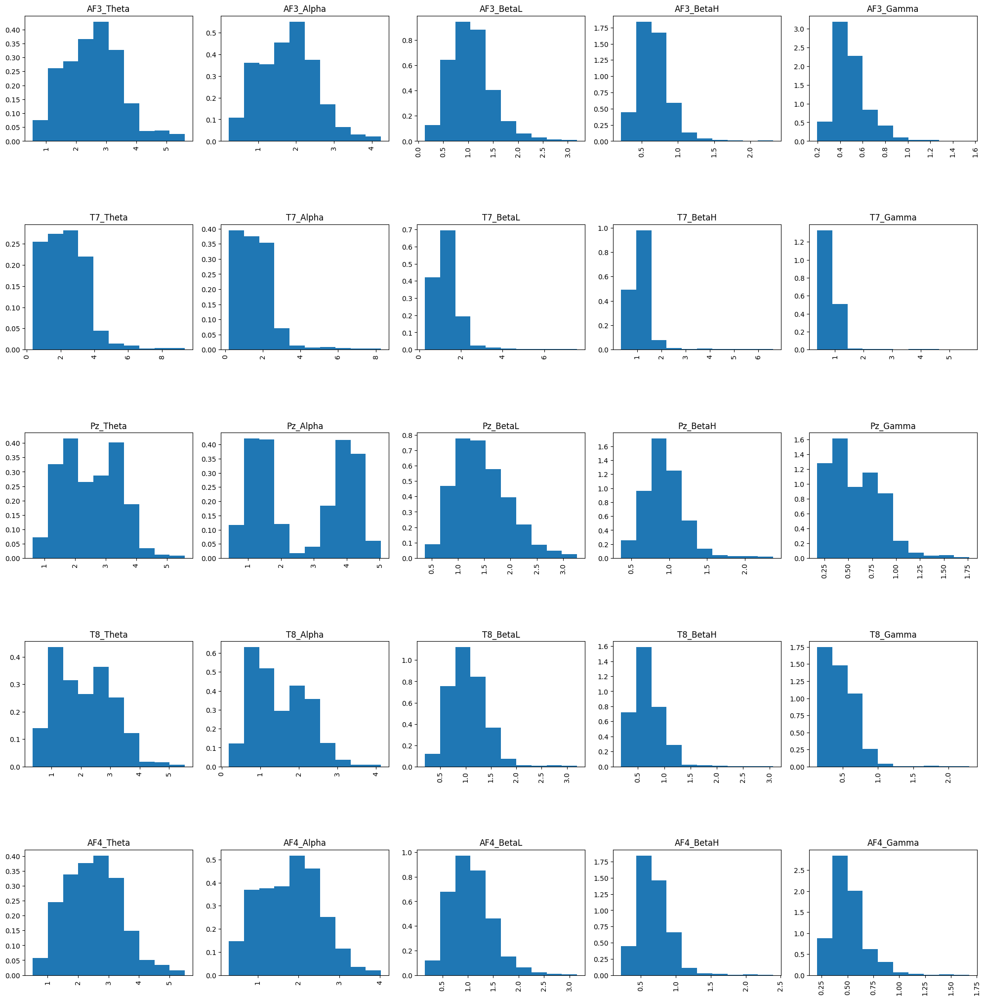

FILE  19


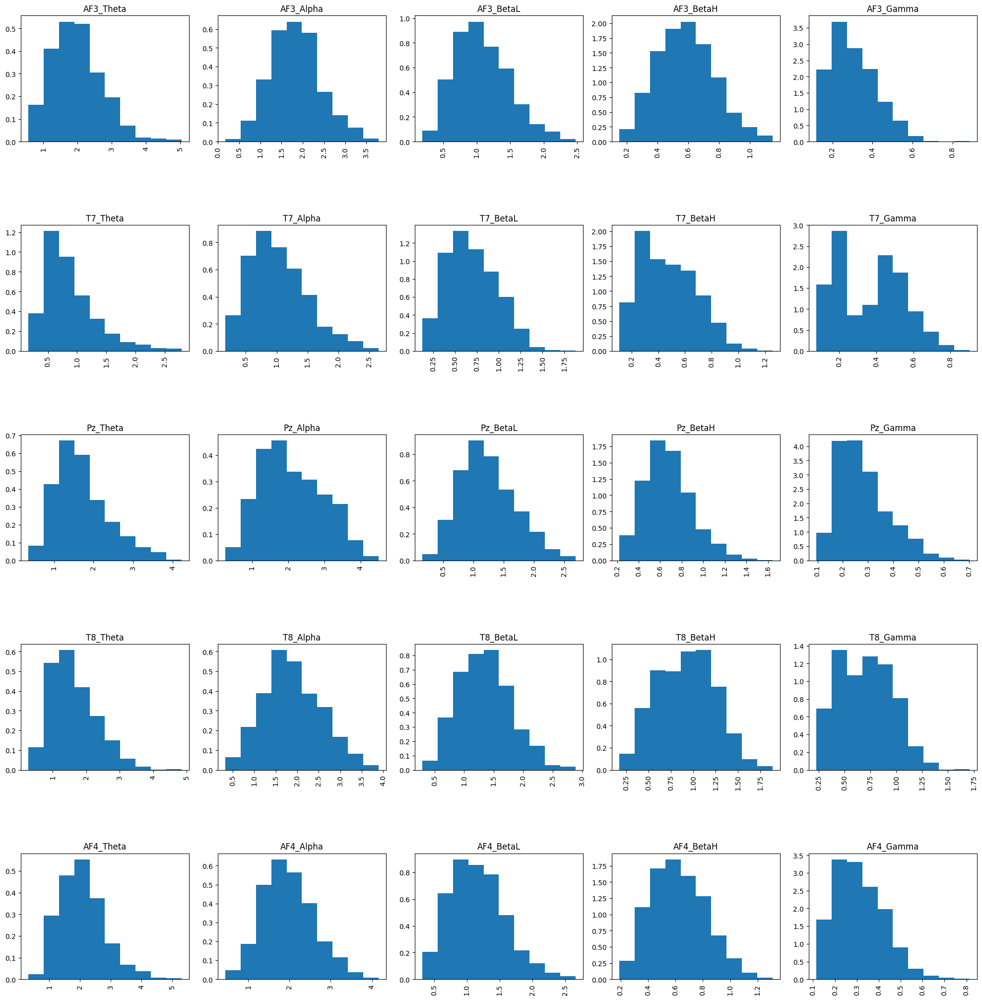

FILE  20


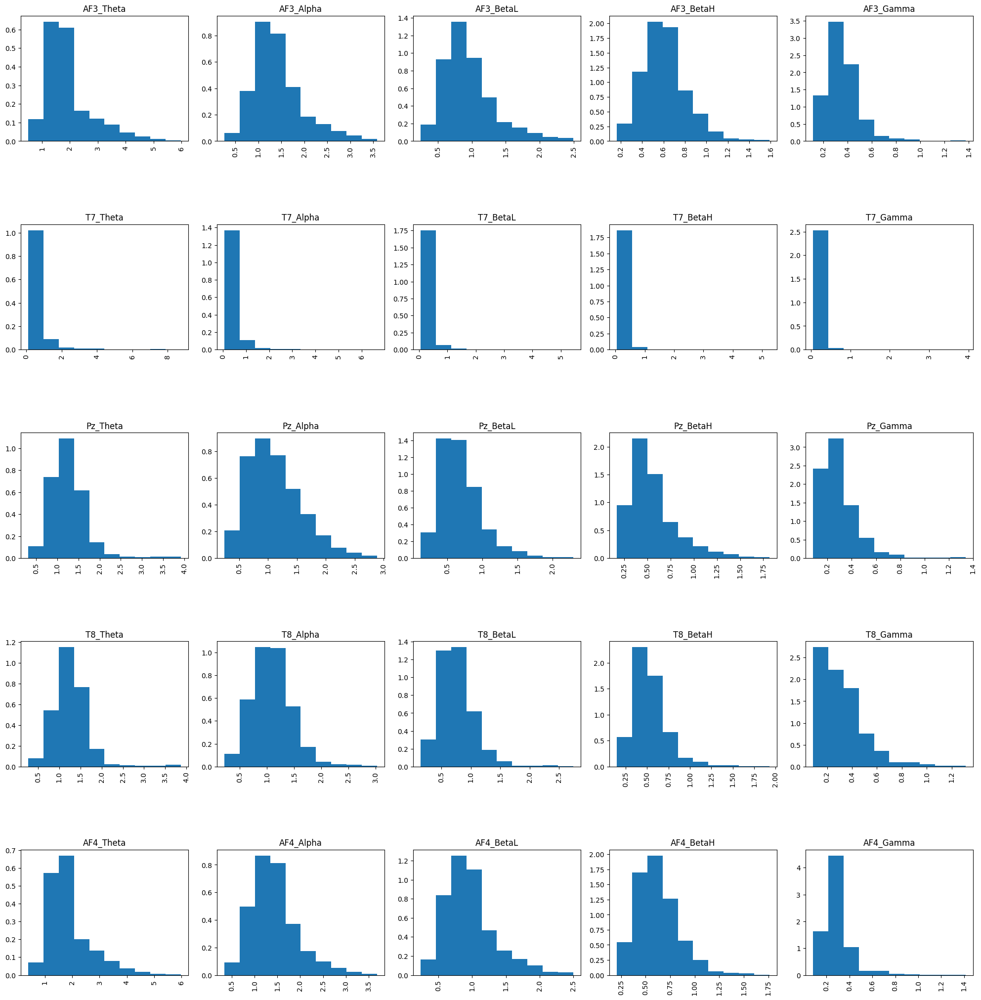

FILE  21


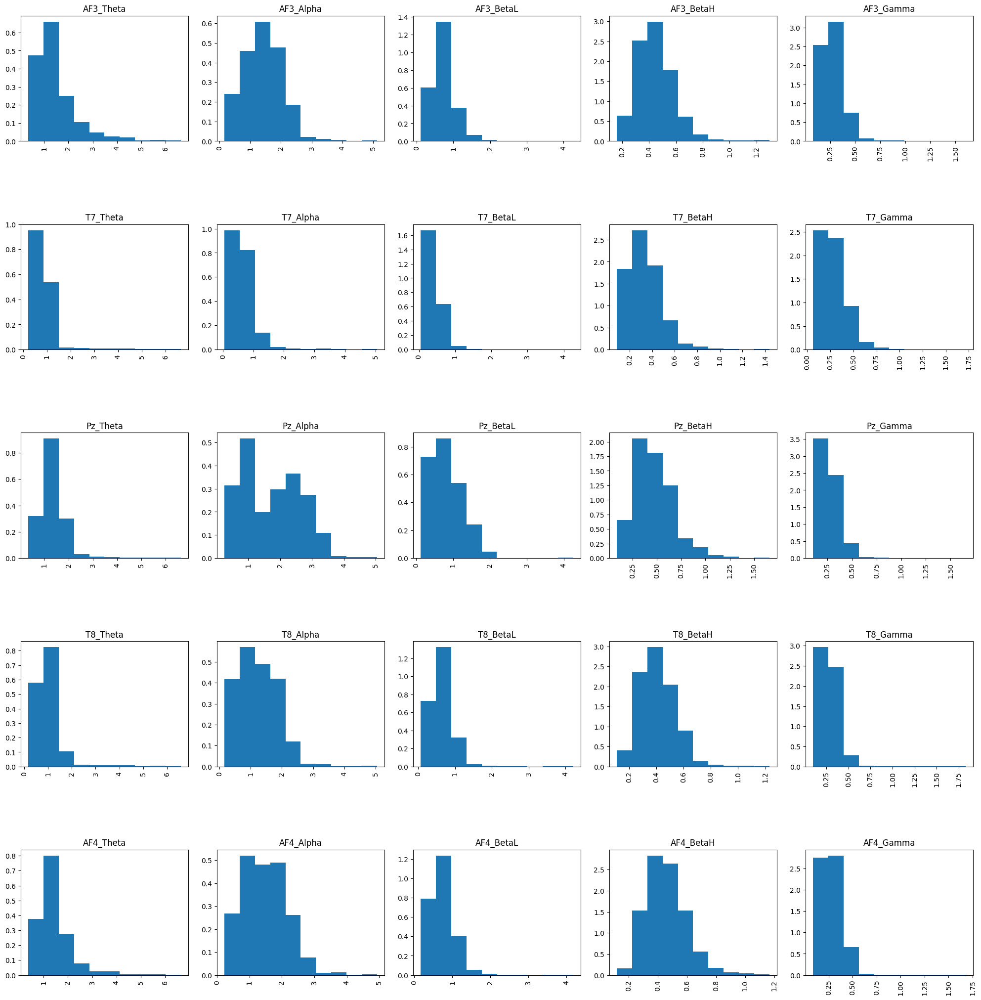

In [17]:
for i in range(22):
  onepow_transformed = pow_transformed[i]
  fig, axes = plt.subplots(5, 5,figsize=[20,20])
  axes = axes.flatten()
  fig.tight_layout(h_pad=10)
  print("FILE ", f'{i}')
  i=0
  for x in onepow_transformed.columns:
    plt.sca(axes[i]) # set the current Axes
    plt.hist(onepow_transformed[x],density=True)
    plt.xticks(rotation = 90) # Rotates X-Axis Ticks by 45-degrees
    plt.title(x)
    i+=1
  plt.show()

---
# ***RELAX AND FOCUS IN DATA***
---

FILE 0


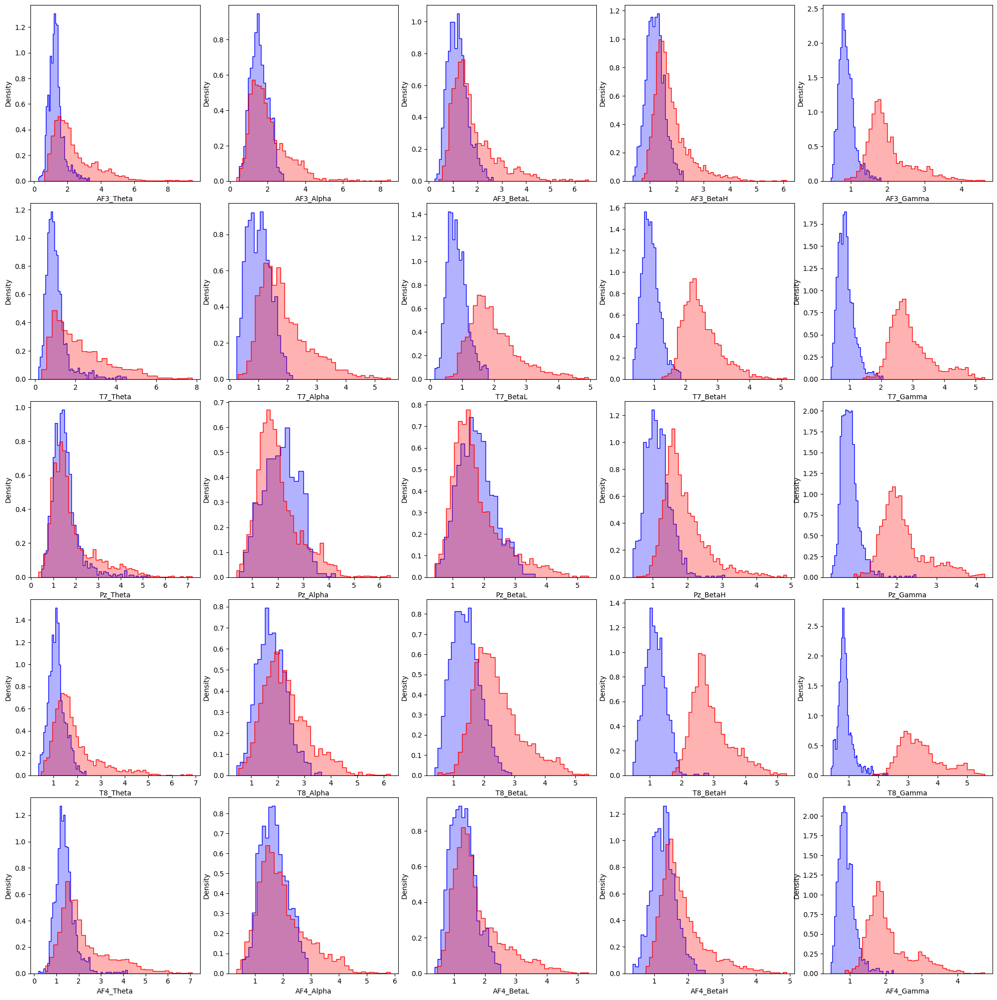

FILE 1


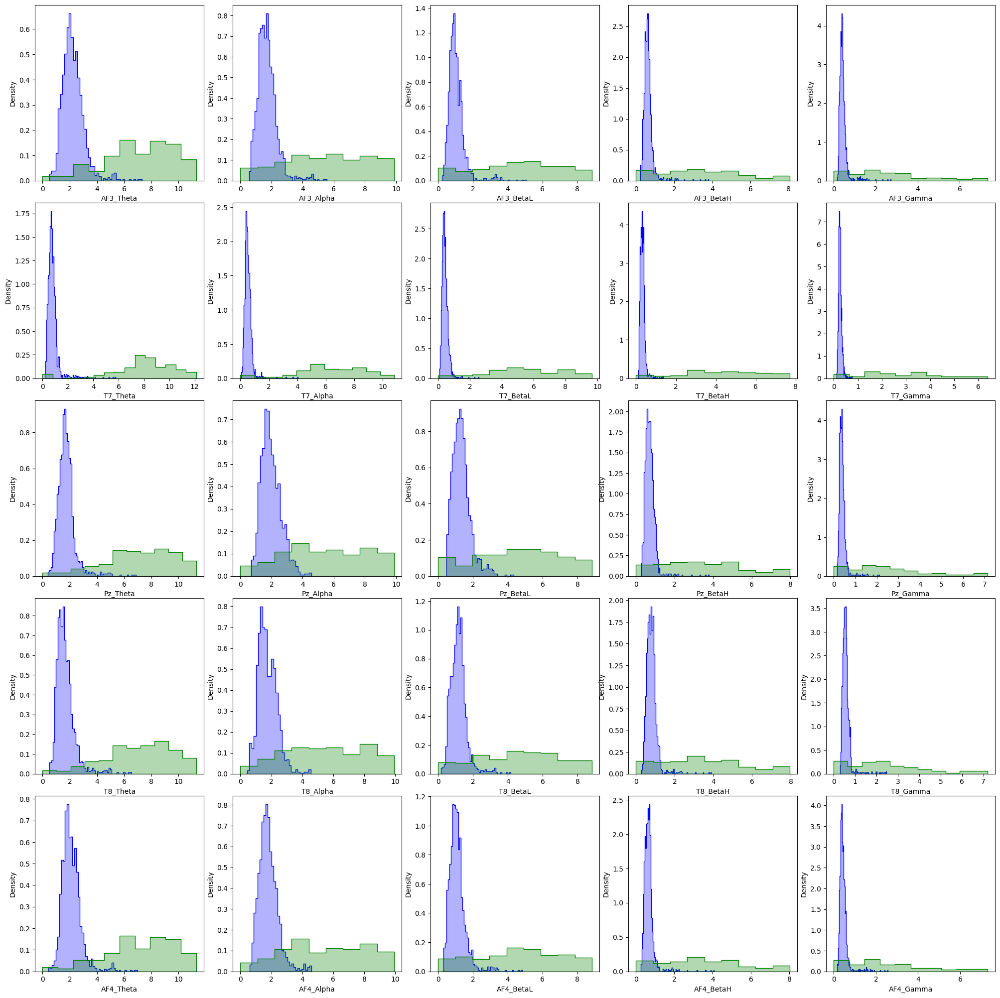

FILE 2


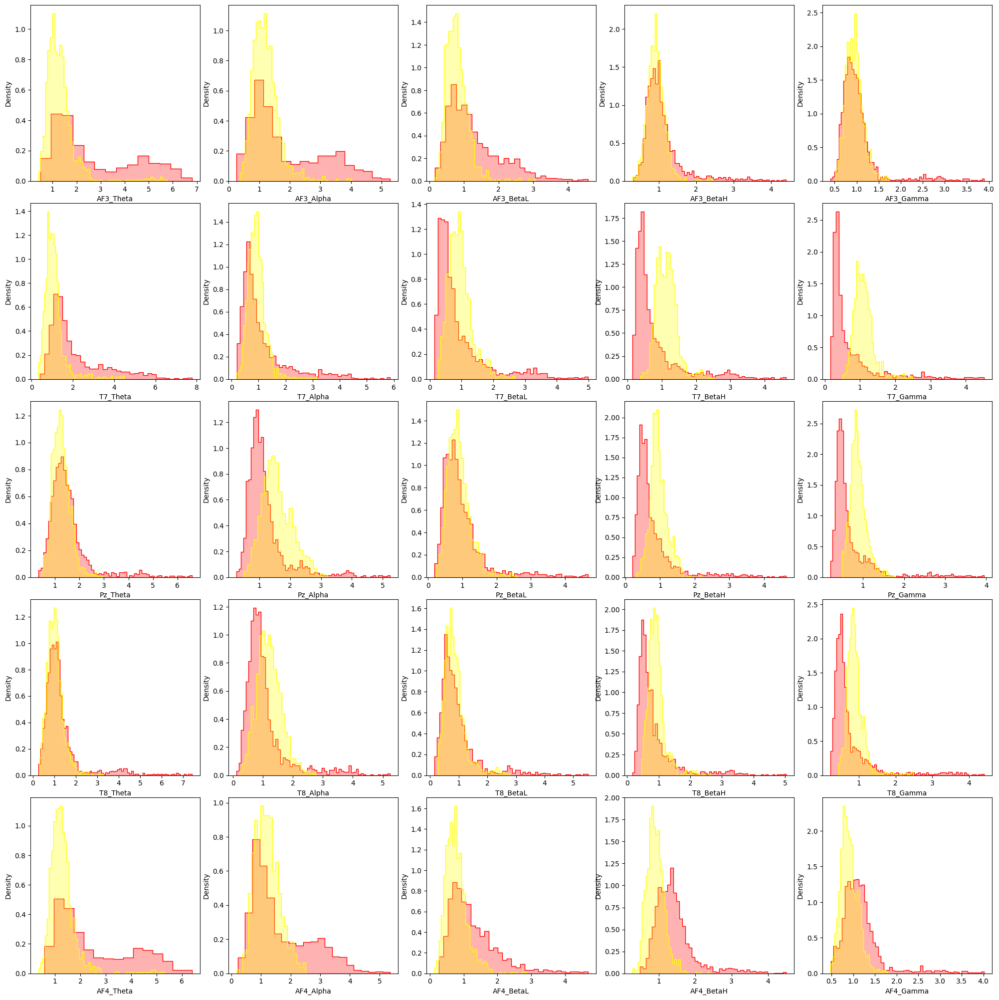

FILE 3


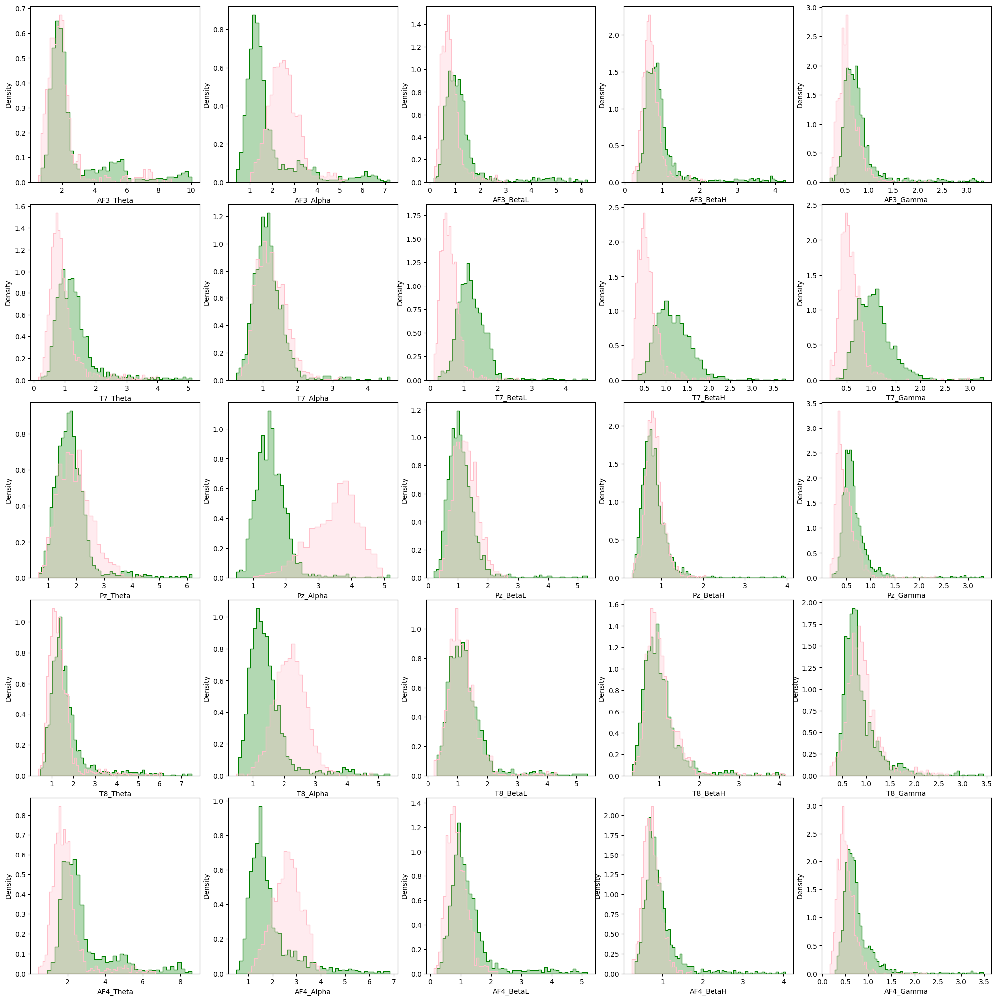

FILE 4


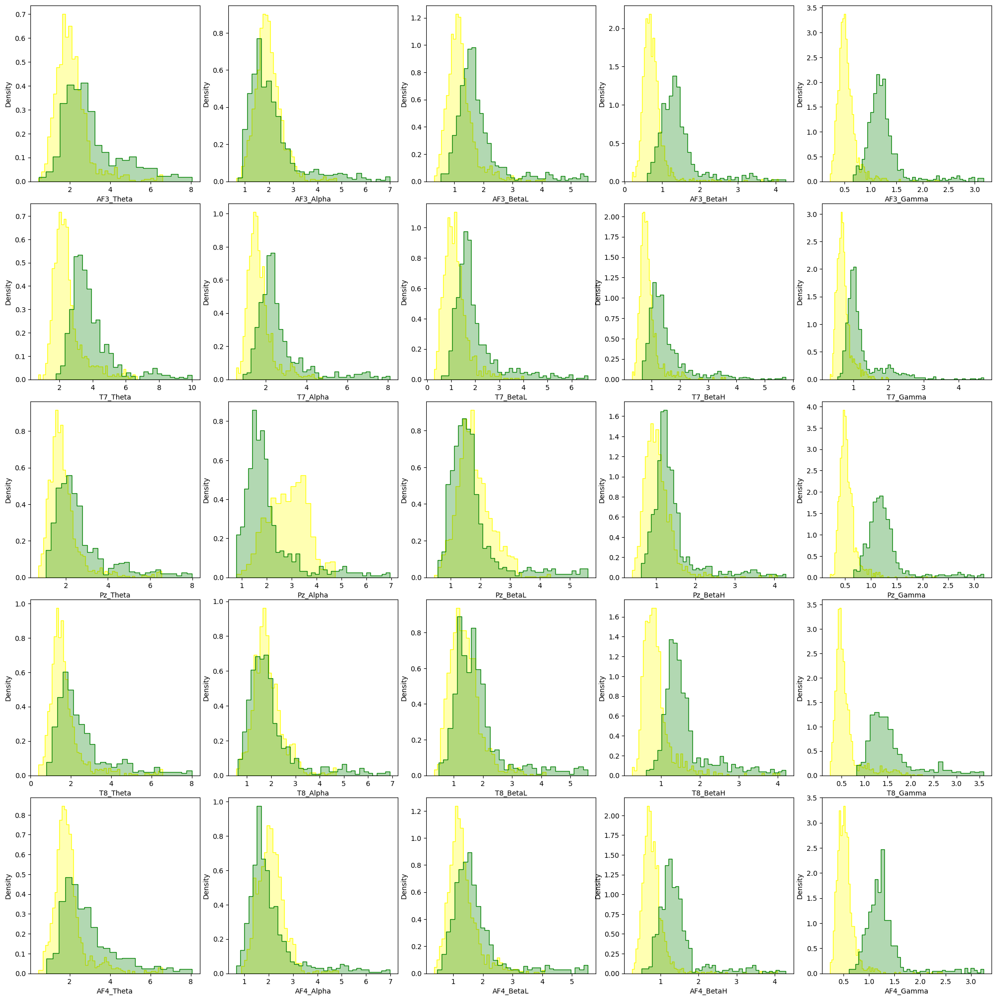

FILE 5


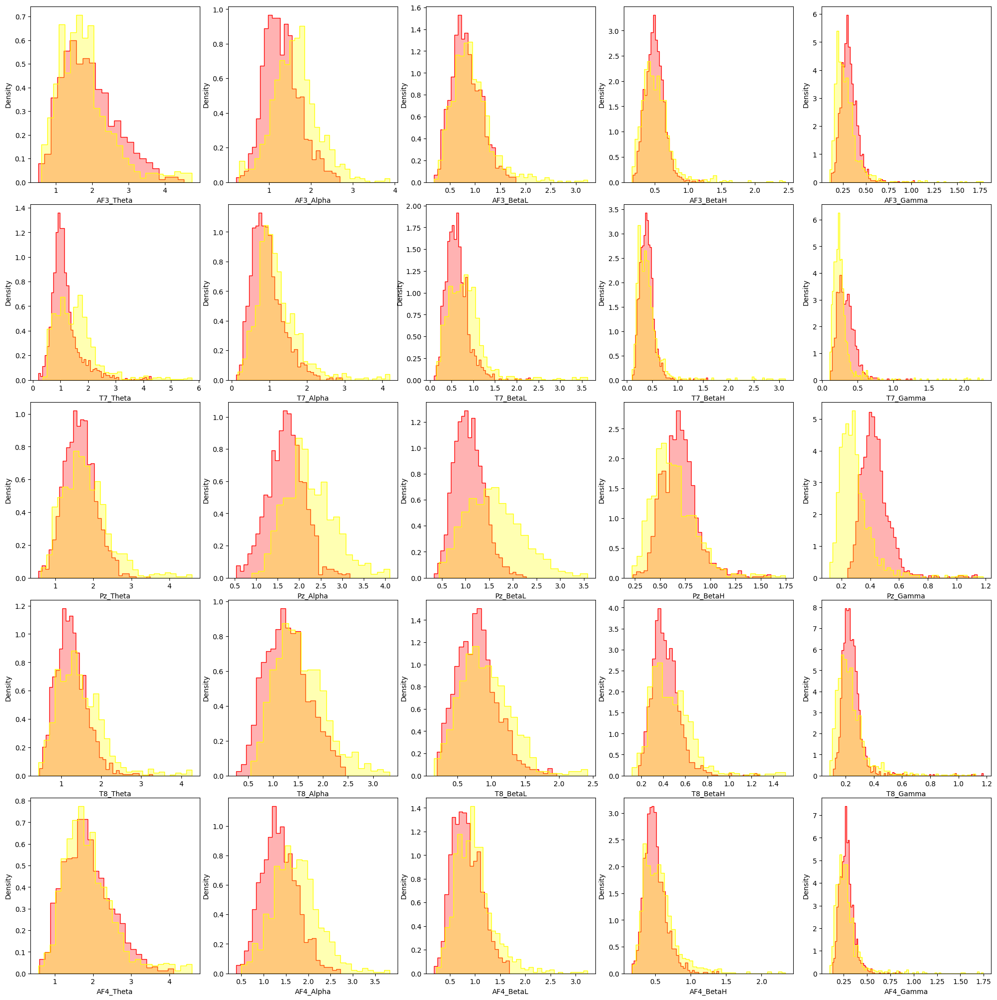

FILE 6


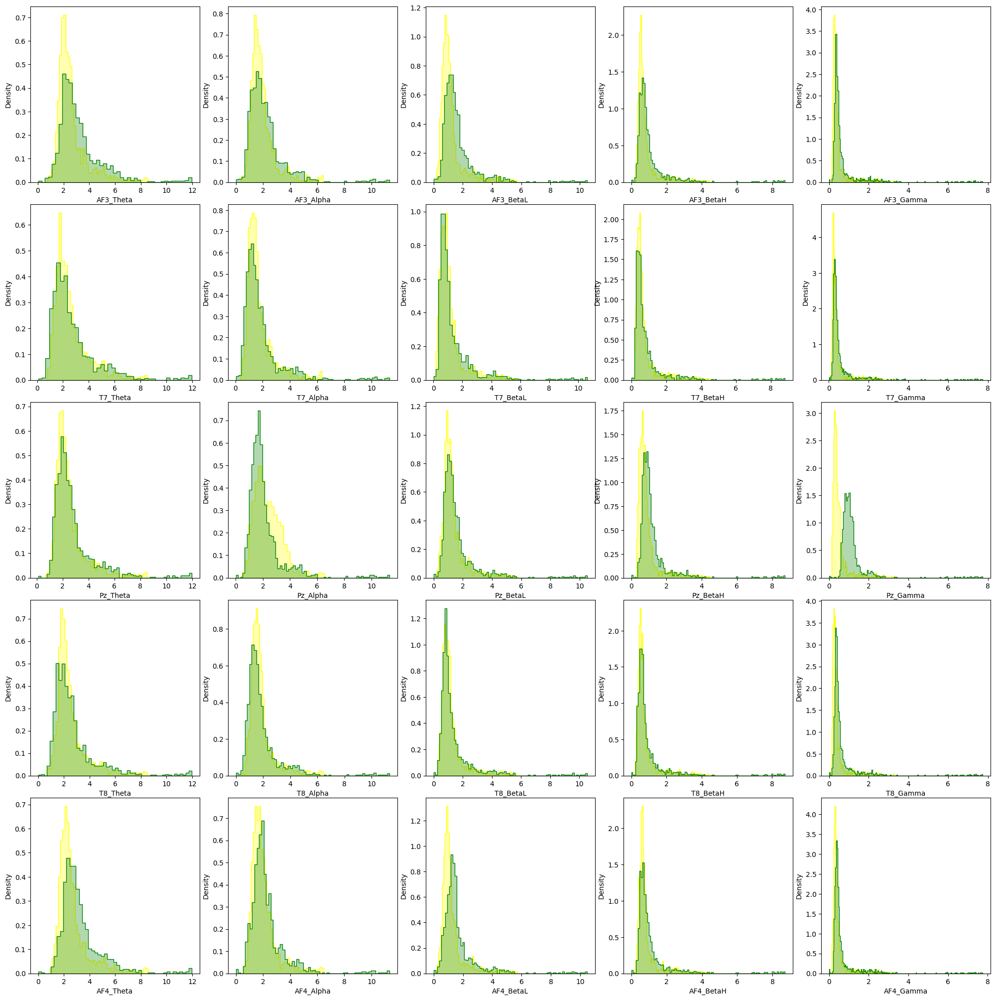

FILE 7


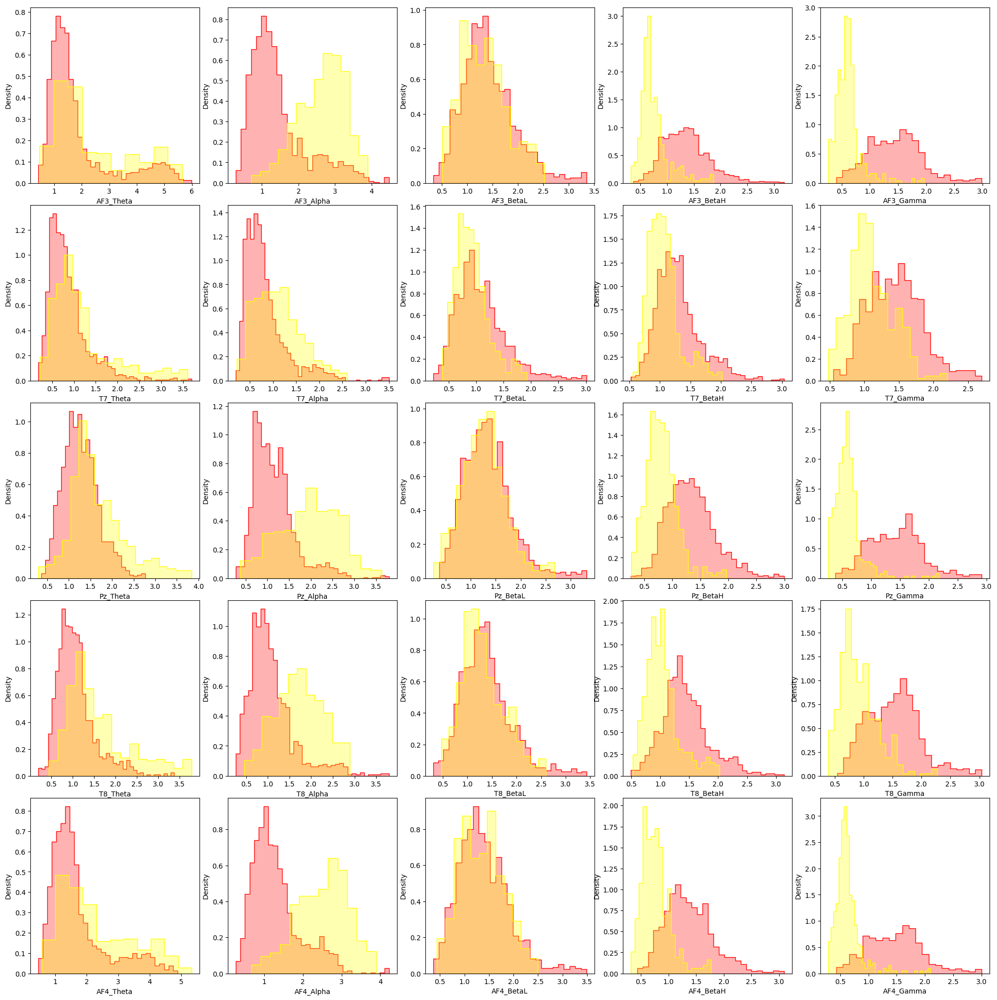

FILE 8


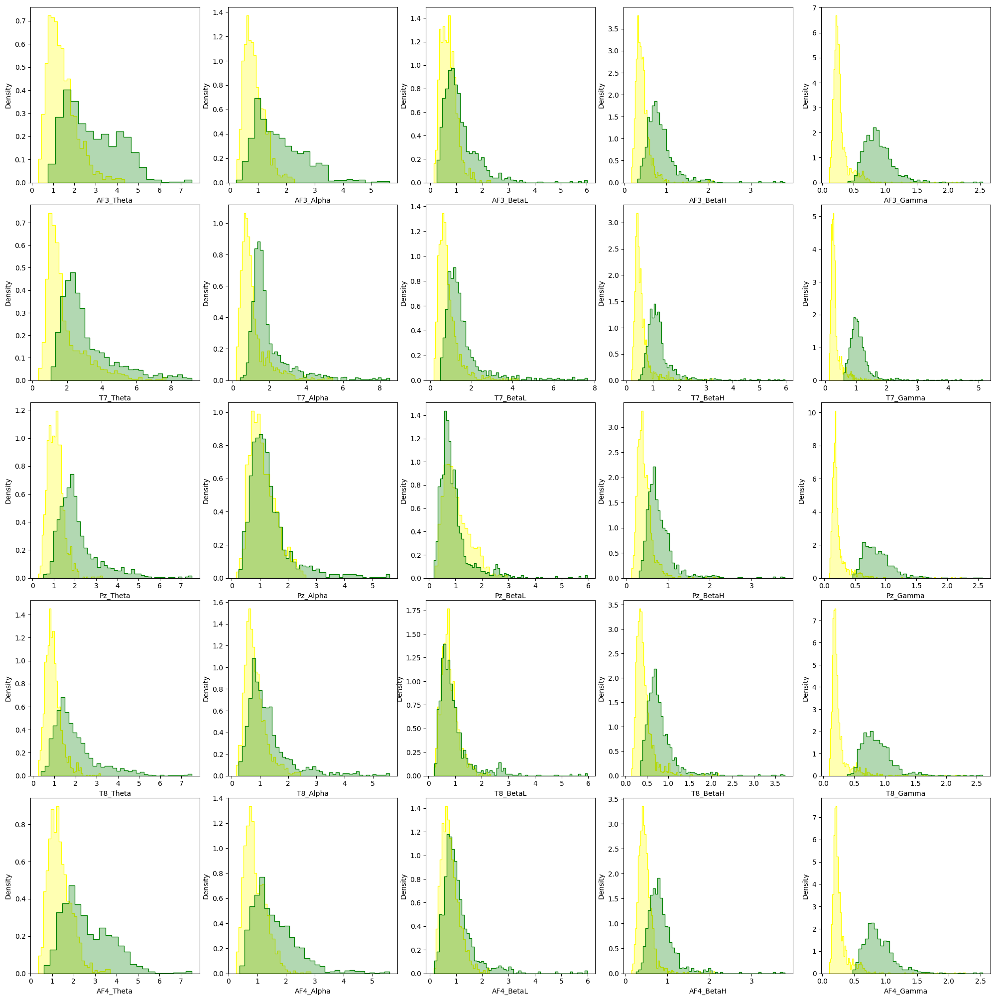

FILE 9


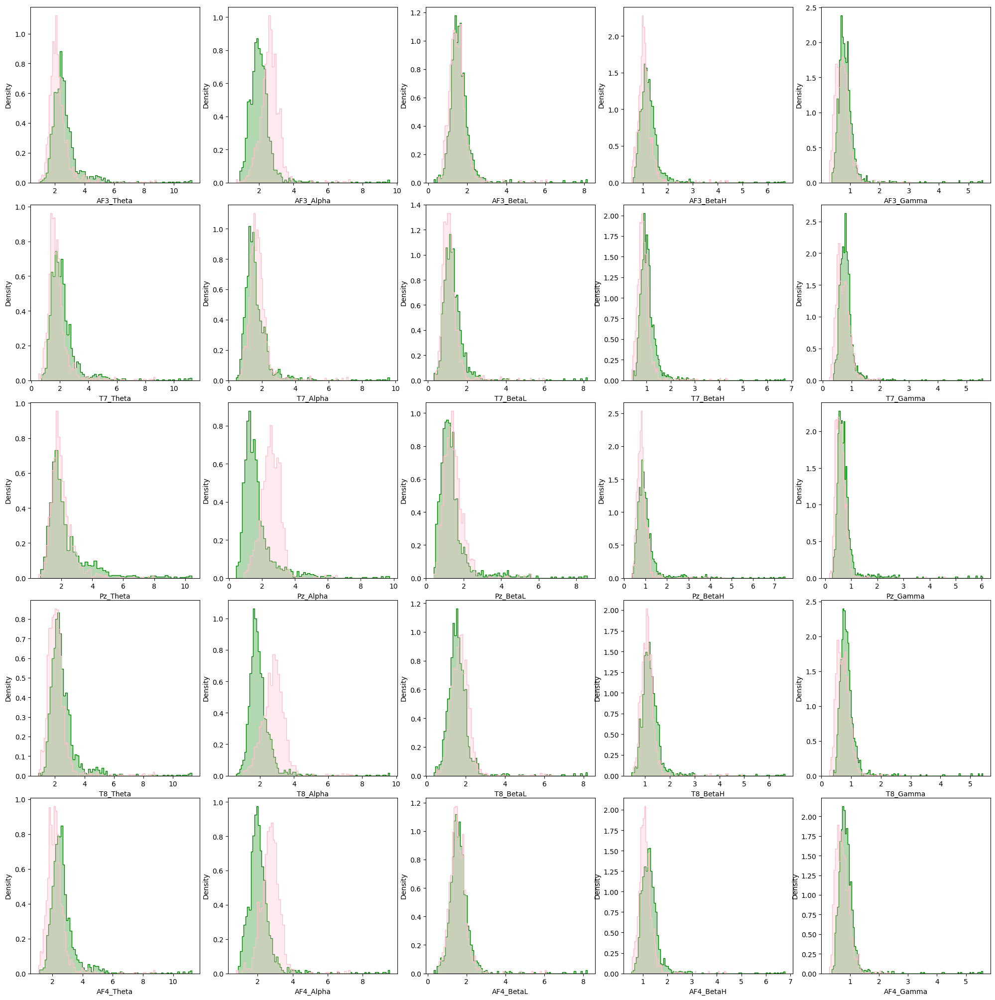

FILE 10


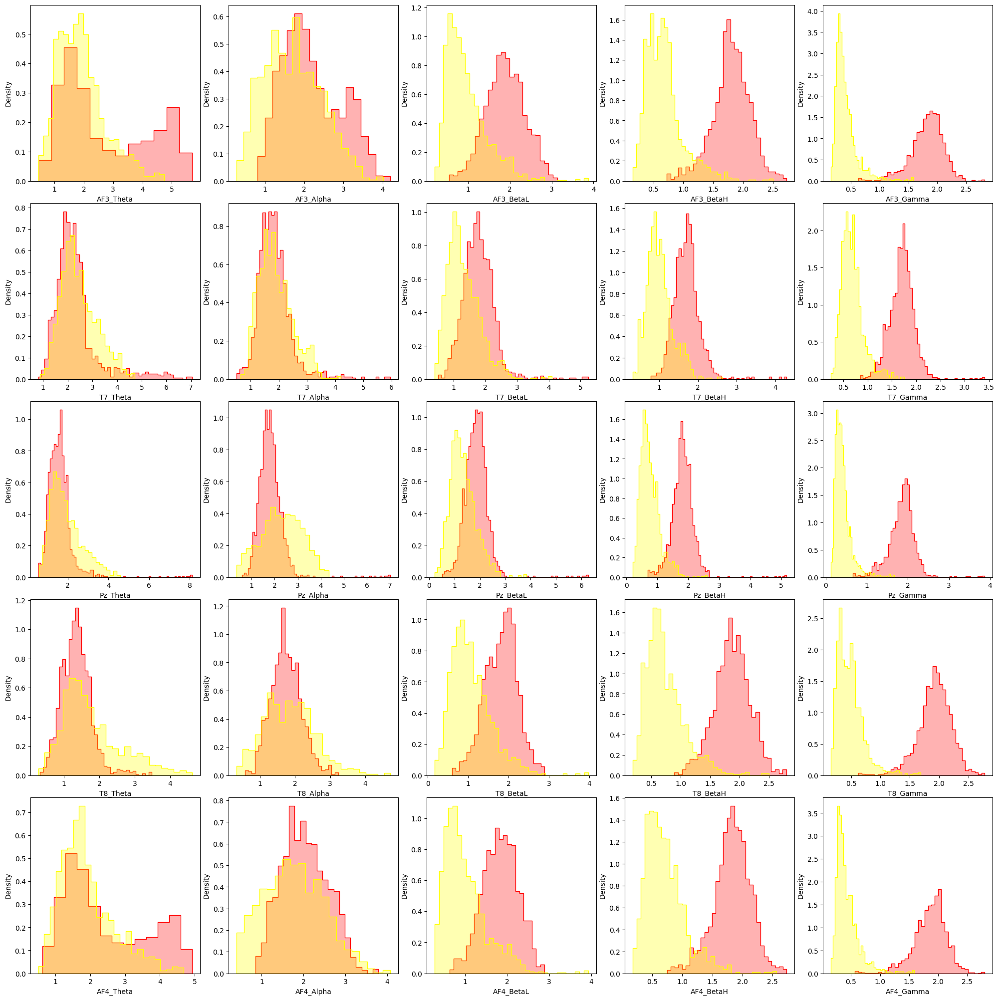

FILE 11


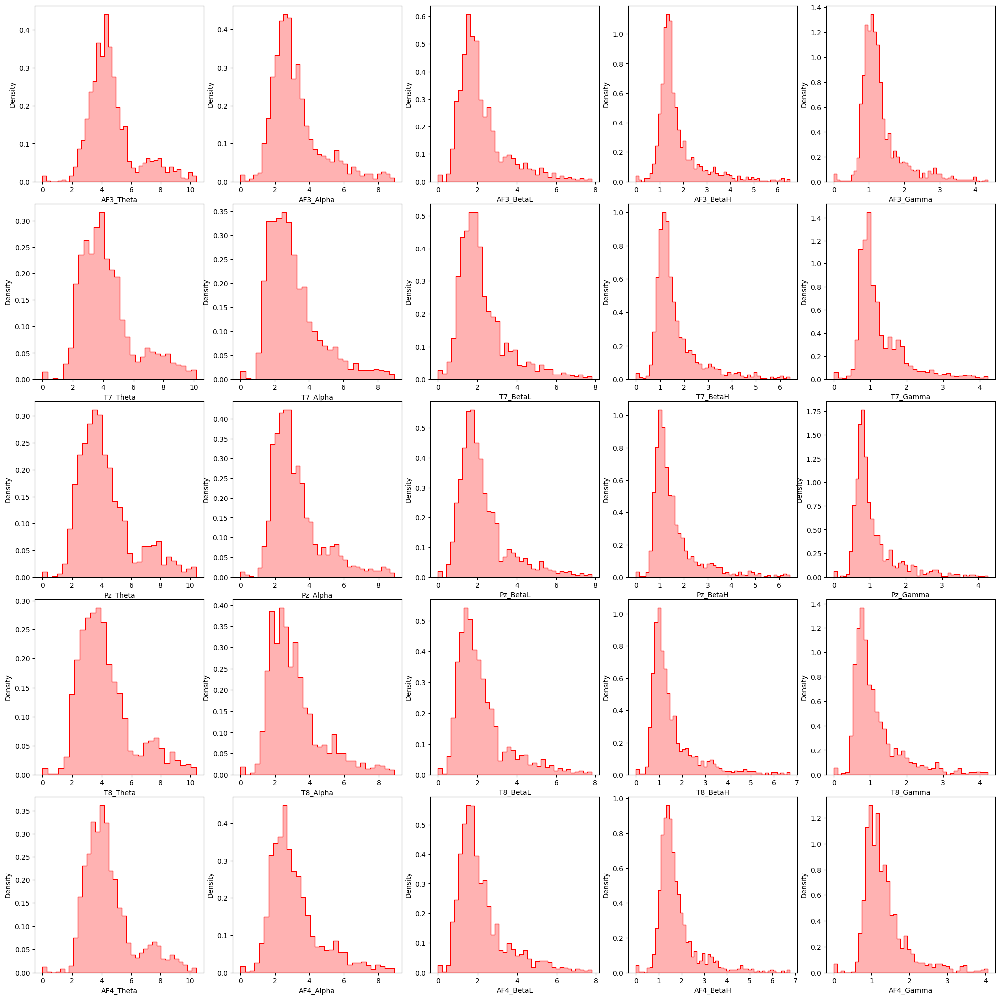

FILE 12


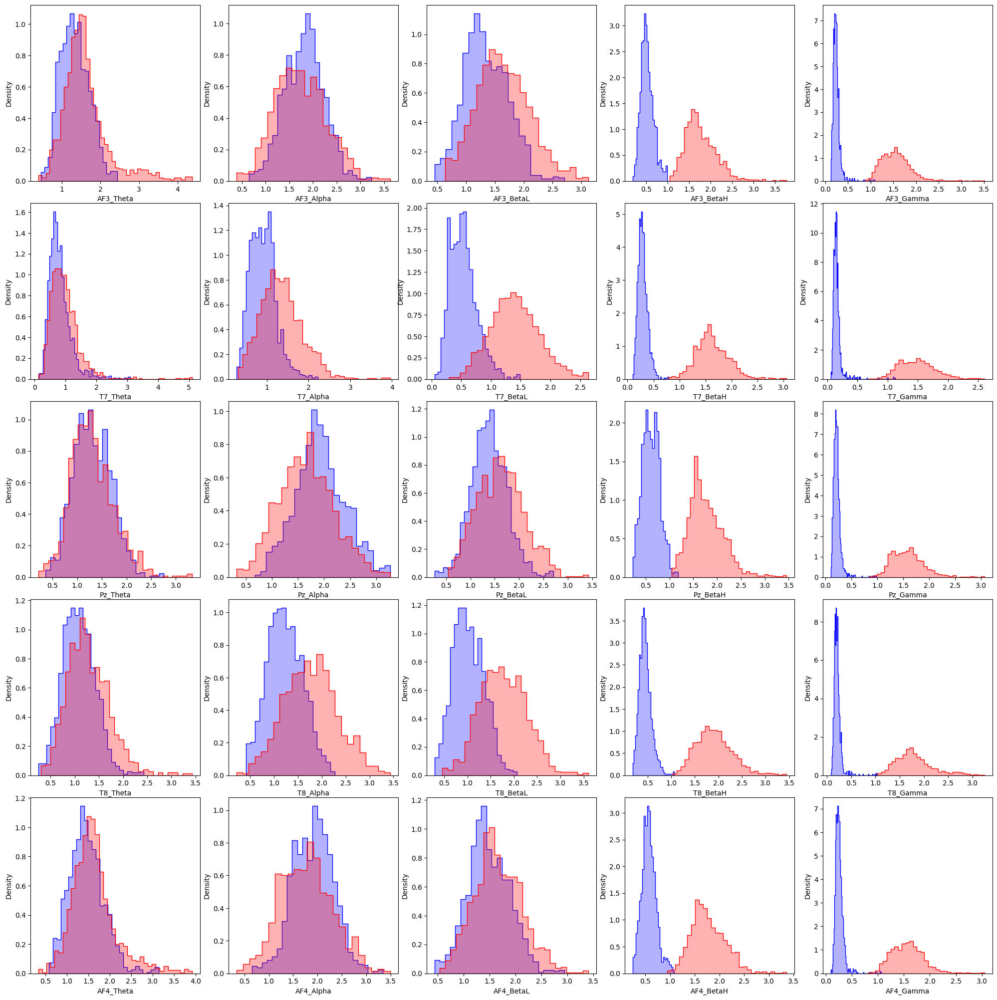

FILE 13


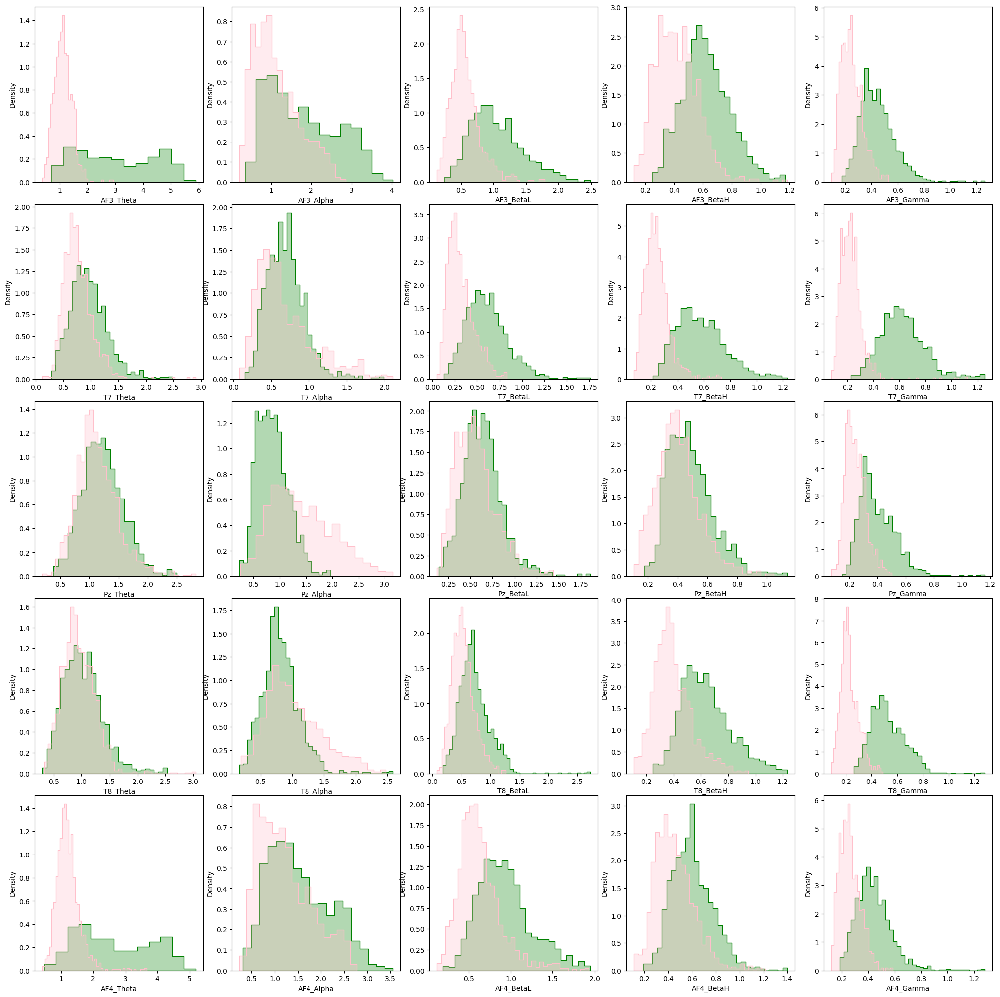

FILE 14


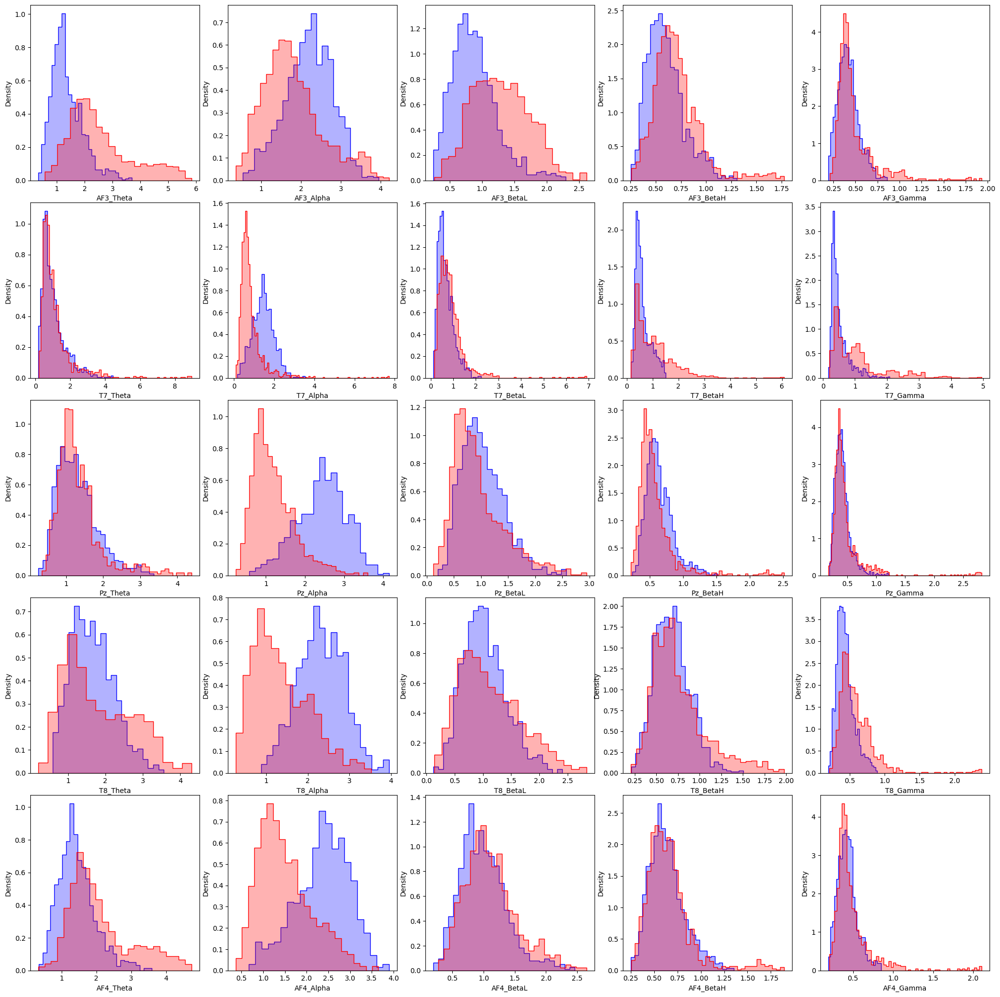

FILE 15


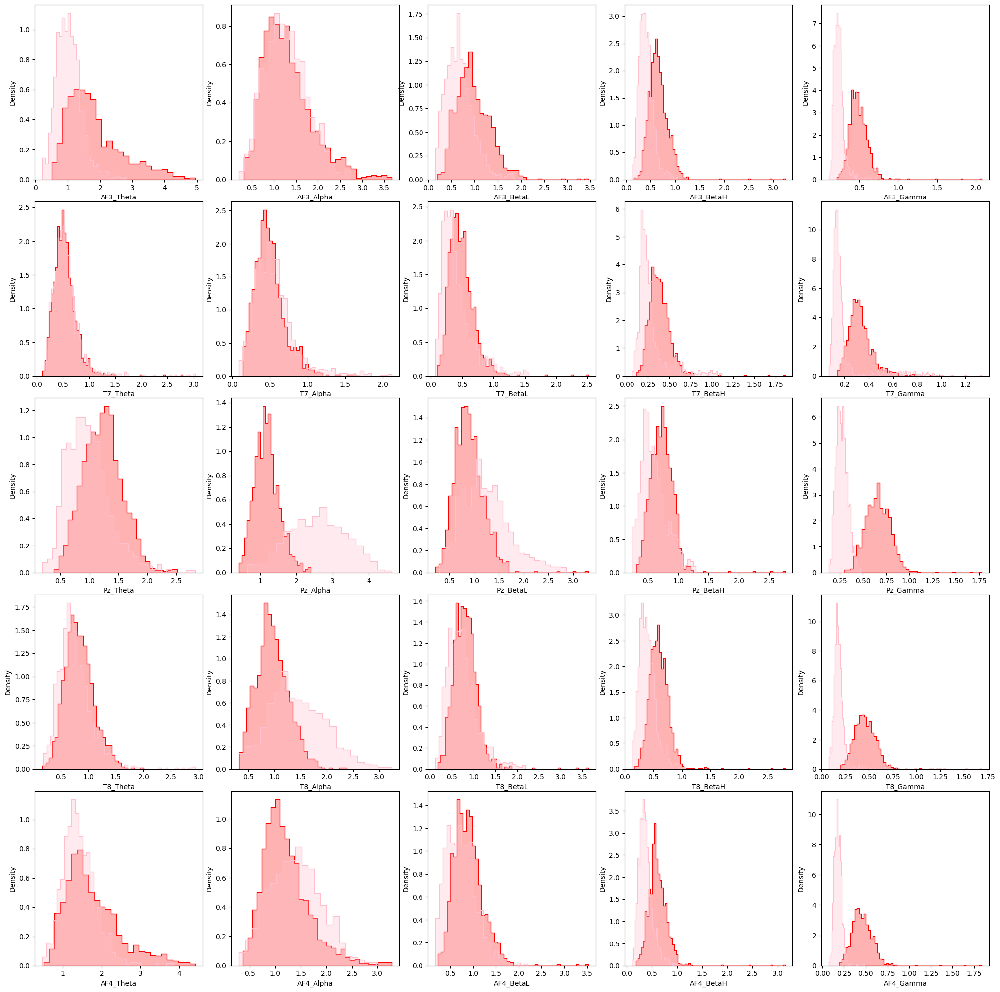

FILE 16


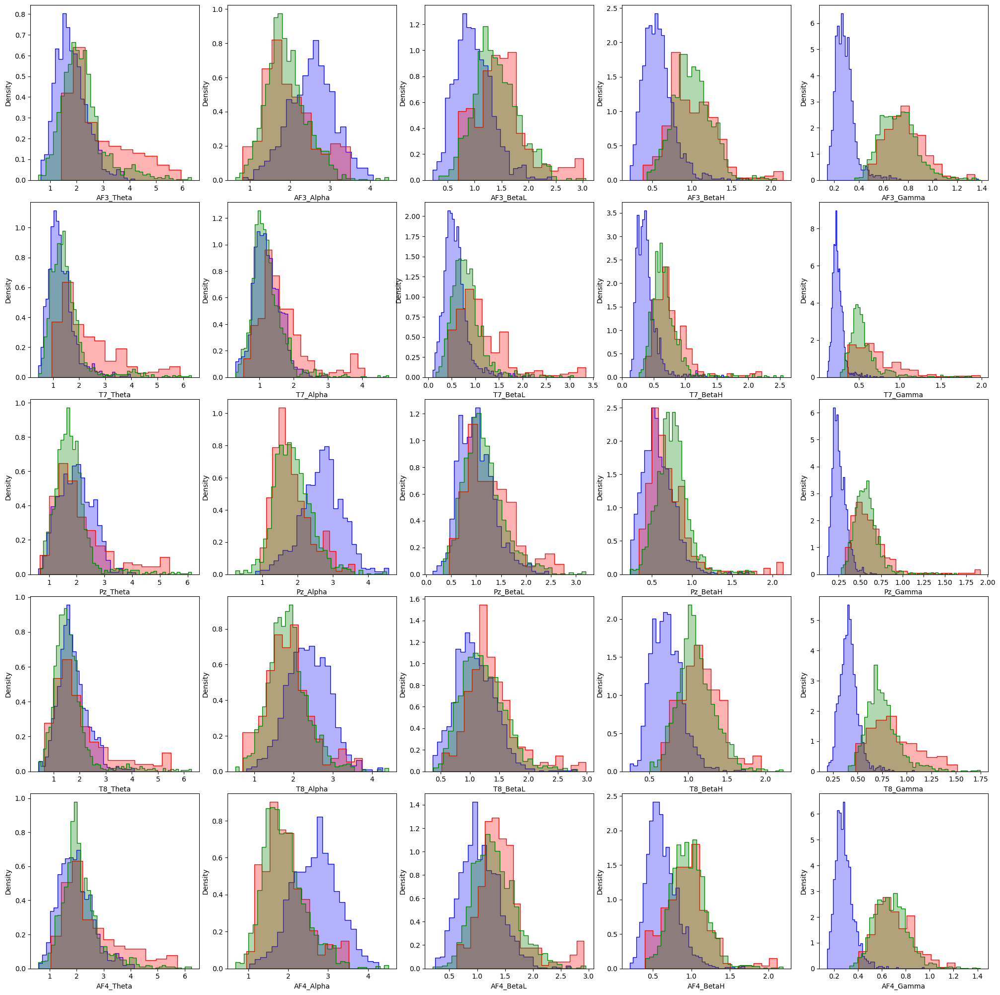

FILE 17


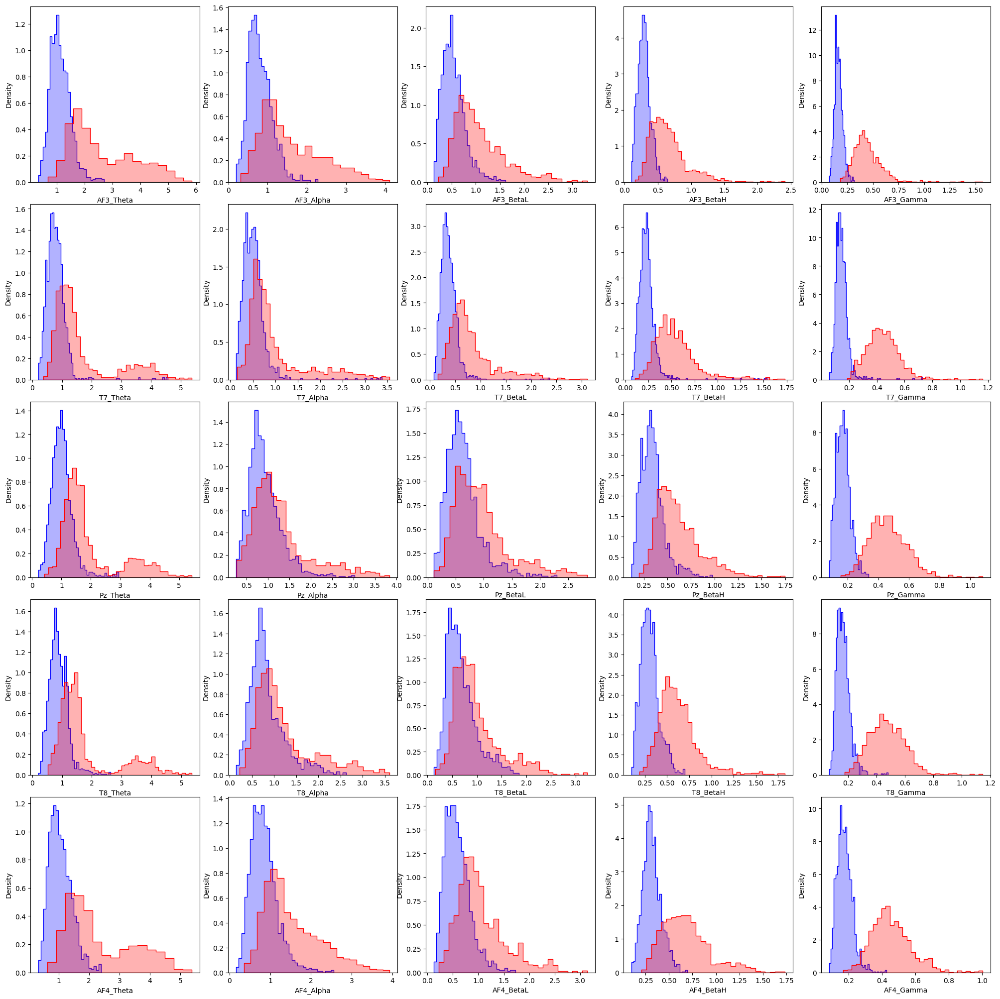

FILE 18


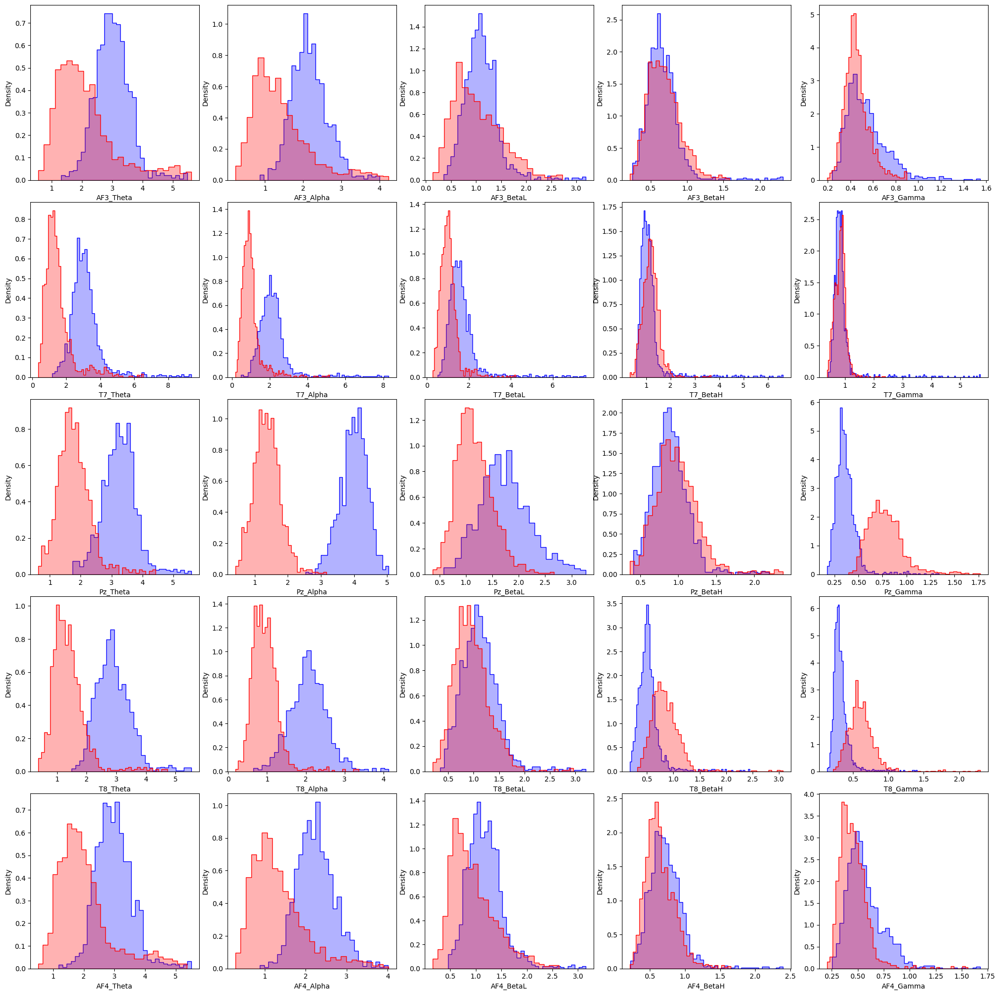

FILE 19


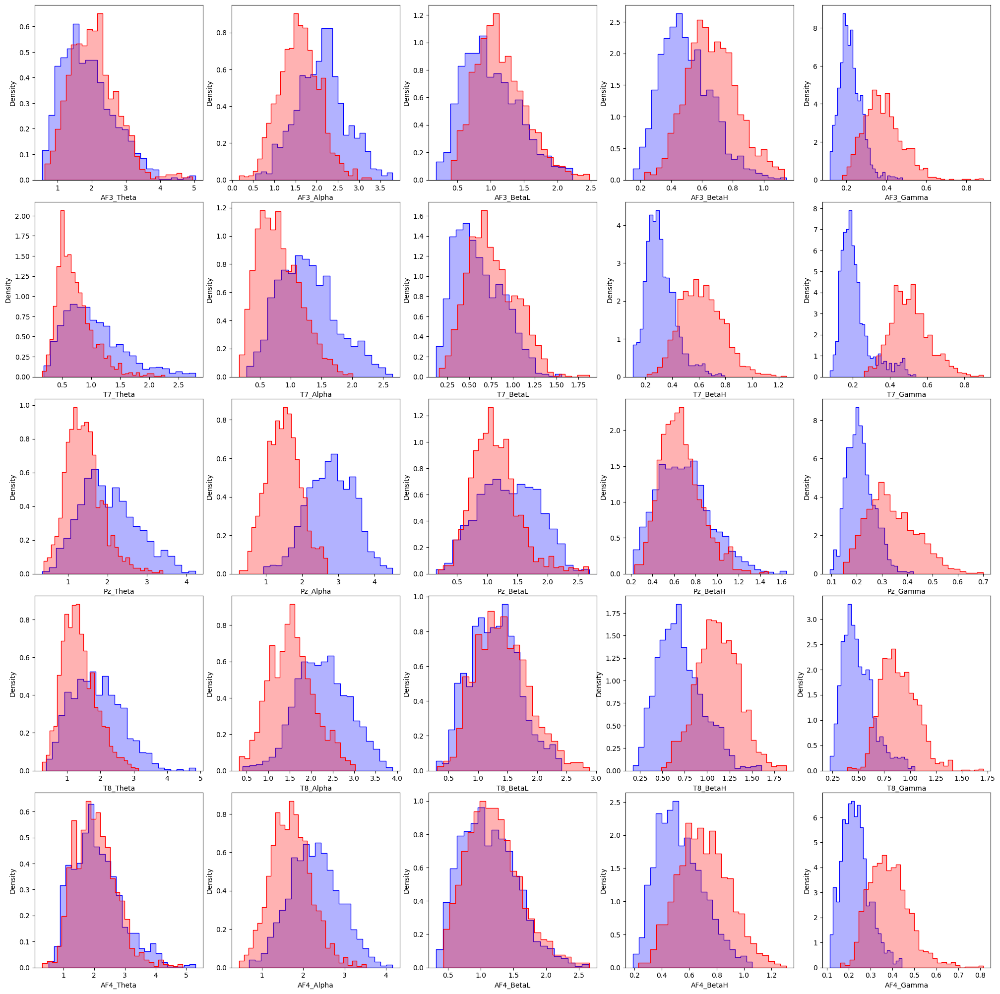

FILE 20


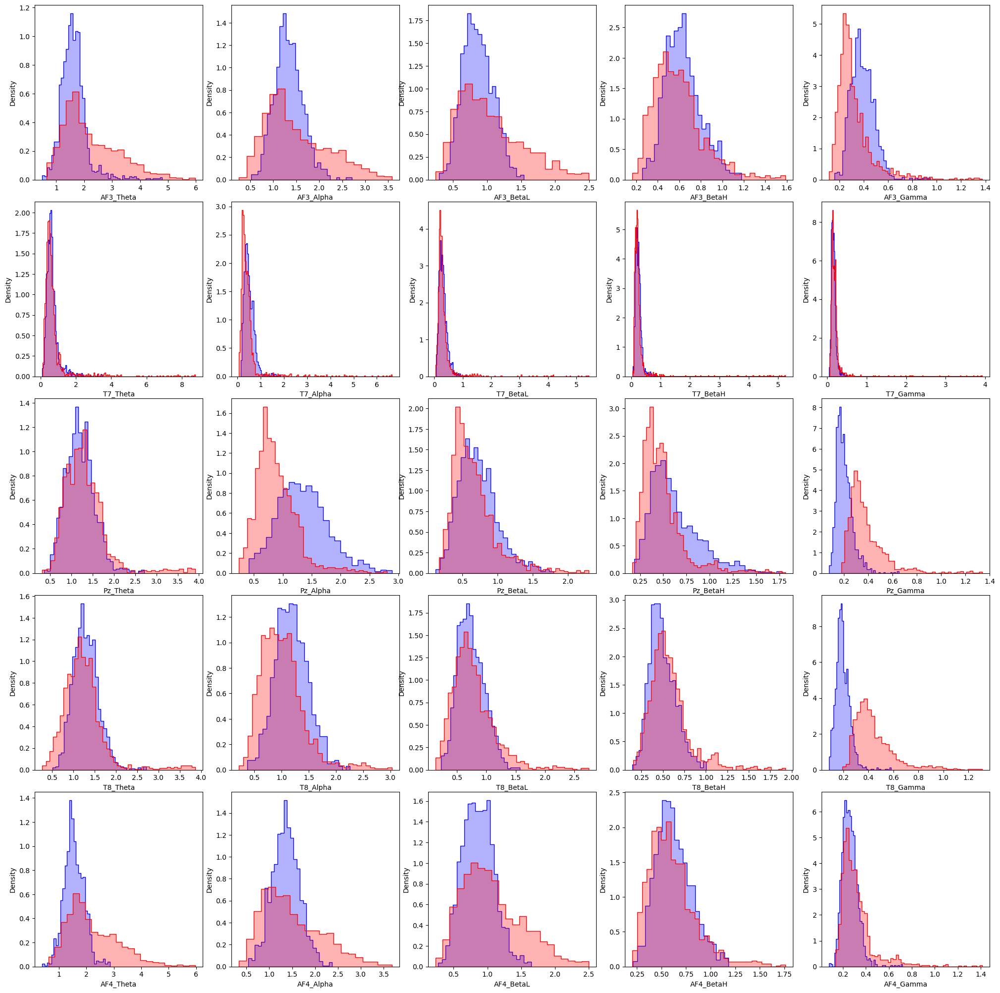

FILE 21


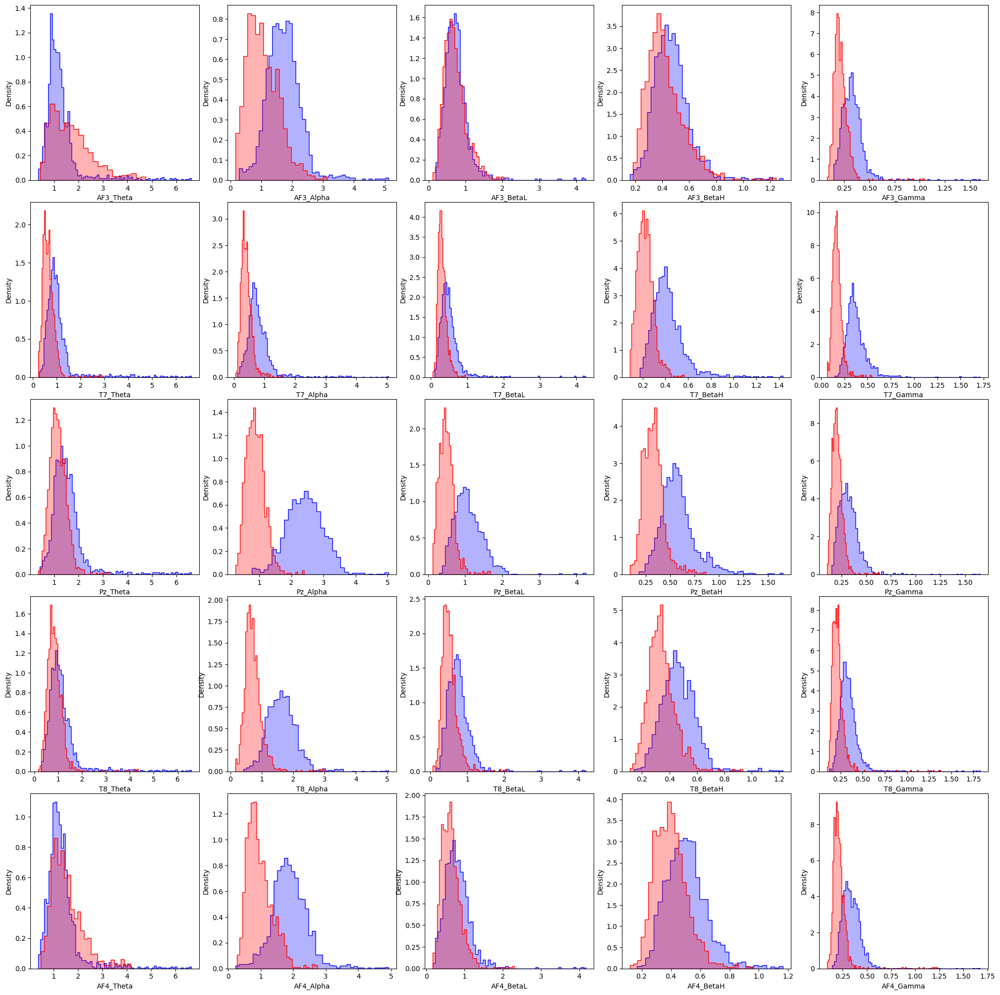

In [18]:
from re import X
for i in range(22):
  data = dataframes[i]
  onepow_transformed = pow_transformed[i]
  onepow = pow[i]
  X0 = onepow_transformed[data['Phase']=='baseline occhi chiusi']
  X1 = onepow_transformed[data['Phase']=='sudoku']
  X2 = onepow_transformed[data['Phase']=='Baseline occhi chiusi']
  X3 = onepow_transformed[data['Phase']=='Sudoku']
  X4 = onepow_transformed[data['Phase']=='occhi chiusi']

  fig, axes = plt.subplots(ncols=5, nrows=5, figsize=(20,20))
  fig.tight_layout()

  print("FILE", f'{i}')
  for i, ax in zip(range(onepow.columns.size), axes.flat):
    sns.histplot(X0.iloc[:,i], color="blue", ax=ax, stat='density', element="step",  alpha=0.3)
    sns.histplot(X1.iloc[:,i], color="red",  ax=ax,stat='density', element="step",  alpha=0.3)
    sns.histplot(X2.iloc[:,i], color="yellow",  ax=ax,stat='density', element="step",  alpha=0.3)
    sns.histplot(X3.iloc[:,i], color="green",  ax=ax,stat='density', element="step",  alpha=0.3)
    sns.histplot(X4.iloc[:,i], color="pink",  ax=ax,stat='density', element="step",  alpha=0.3)

  plt.show()


---
# ***CLASSIFICATION***
---

In [20]:
# I need only data, not phase names
x = filtered_df
z = x.drop(columns = 'Phase')

# Conversion to numpy array
xnew = z.to_numpy()
# Let's check the shape
print(xnew.shape)

(63342, 25)


In [30]:
# Labels: I need a one-hot encoder. I realize the most basic (and stupid) one.
# I know there also the tfkl function "to_categorical()" but I gives me an error
# and now I don't have time to solve it
y = filtered_df['Phase']

labels = []
for i in y:
  if i == 'baseline occhi chiusi' or i == 'Baseline occhi chiusi' or i == 'occhi chiusi':
    labels.append([1, 0])
  elif i == 'sudoku' or i == 'Sudoku':
    labels.append([0, 1])

# conversion to array and shape check
labels = np.asarray(labels)
print(labels.shape)

(63342, 2)


In [31]:
# my model
def CNN1D_classifier(input_shape, label):
    input_layer = tfkl.Input(shape=input_shape, name='Input')

    cnn = tfkl.Conv1D(512,3,padding='same',activation='relu', name = "prova")(input_layer)
    cnn = tfkl.MaxPooling1D()(cnn)
    cnn = tfkl.Conv1D(512,3,padding='same',activation='relu')(cnn)
    gap = tfkl.GlobalAveragePooling1D()(cnn)
    dropout = tfkl.Dropout(.3, seed=seed)(gap)

    classifier = tfkl.Dense(1024, activation='relu')(dropout)
    dropout2 = tfkl.Dropout(.3, seed=seed)(classifier)
    output_layer = tfkl.Dense(2, activation='softmax')(dropout2)

    # Connect input and output through the Model class
    model = tfk.Model(inputs=input_layer, outputs=output_layer, name='model')

    opt = tf.keras.optimizers.Adam(
      learning_rate = 2e-4,
      beta_1=0.9,
      beta_2=0.999,
      epsilon=1e-08,
      amsgrad=False,
      name="Adam",
    )
    # Compile the model
    model.compile(loss=tfk.losses.CategoricalCrossentropy(), optimizer=tfk.optimizers.Adam(), metrics='accuracy')

    # Return the model
    return model

model = CNN1D_classifier((25, 1), labels)

In [ ]:
# Train the model
history = model.fit(
    x = xnew,
    y = labels,
    batch_size = 32,
    #class_weight = class_weights_dic
    epochs = 200,
    validation_split=0.2
).history

Epoch 1/200
1584/1584 [==============================] - 12s 6ms/step - loss: 0.9085 - accuracy: 0.7499 - val_loss: 0.6767 - val_accuracy: 0.7553
Epoch 2/200
1584/1584 [==============================] - 11s 7ms/step - loss: 0.4519 - accuracy: 0.8362 - val_loss: 0.6675 - val_accuracy: 0.7574
Epoch 3/200
1584/1584 [==============================] - 9s 6ms/step - loss: 0.3498 - accuracy: 0.8648 - val_loss: 0.8184 - val_accuracy: 0.7173
Epoch 4/200
1584/1584 [==============================] - 10s 6ms/step - loss: 0.2954 - accuracy: 0.8820 - val_loss: 1.1430 - val_accuracy: 0.7207
Epoch 5/200
1584/1584 [==============================] - 10s 6ms/step - loss: 0.2894 - accuracy: 0.8883 - val_loss: 0.6741 - val_accuracy: 0.7671
Epoch 6/200
1584/1584 [==============================] - 11s 7ms/step - loss: 0.2612 - accuracy: 0.8973 - val_loss: 1.1912 - val_accuracy: 0.7384
Epoch 7/200
1584/1584 [==============================] - 10s 6ms/step - loss: 0.2614 - accuracy: 0.8982 - val_loss: 1.2008 - 